<a href="https://colab.research.google.com/github/kleeeeea/ECON_prev/blob/master/Foundations_of_Deep_Learning_(Feizi)_Programming_Modules.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Foundations of Deep Learning 
# By Soheil Feizi
# University of Maryland, College Park

**Course webpage:**: http://www.cs.umd.edu/class/fall2021/cmsc828W/

**Video lectures** : https://youtube.com/playlist?list=PLHgjs9ncvHi80UCSlSvQe-TK_uOyDv_Jf

**Introduction:** In this Colab, we provide programming modules that supplement the lectures. These modules are meant to be educational and interative to provide a better understanding of the material covered in this course. Programming modules have been prepared by the cohort of students in the course CMSC828W: Fall 2021 led by the course TA, **Kyle Seelman**. 

Codes may have been borrowed from public githubs and papers. If a citation is missing, please contact us to include.

We are going to run through a simple example module. All modules must be done using pytorch, https://pytorch.org/tutorials/ contains many tutorials if you need a refresher on pytorch. 



##### We are going to walk through automatic differentiation using pytorch. Let's differentiate y = 4𝐱^⊤𝐱

In [ ]:
import torch

First, let us initialize 𝐱 with random values between [0,10]. In pytorch "requires_grad" must be set to true if we want to differentiate a variable

In [ ]:
x = torch.randint(0,10,(4,))
x = x.float()
x.requires_grad_(True)
print(x)

tensor([7., 7., 7., 0.], requires_grad=True)


Next, let's define y. Since 𝐱 is a vector, we are taking the dot product of 𝐱 and itself in order to obtain a scalar value

In [ ]:
y = 4 * torch.dot(x,x)
print(y)

tensor(588., grad_fn=<MulBackward0>)


To show the importance of using the dot product, if we just try to use the multiplication operator for 𝐱 and itself, we will get a vector in return

In [ ]:
4*x*x

tensor([196., 196., 196.,   0.], grad_fn=<MulBackward0>)

Next, we can automatically calculate the gradient of y with respect to each component of 𝐱 by calling the function for backpropagation and printing the gradient

In [ ]:
y.backward()
x.grad

tensor([56., 56., 56.,  0.])

The gradient of the function  𝑦=4𝐱^⊤𝐱  with respect to  𝐱  should be  8𝐱 . Let us quickly verify that our desired gradient was calculated correctly.

In [ ]:
8*x == x.grad

tensor([True, True, True, True])

Since the gradient stored in "x.grad" matches 8*𝐱, we know that our differentiation worked.

# Lecture 1: DL basics: ERM and basic architectures (MLP, ResNet and CNNs), overview of SGD, ADAMs, Momentum, etc

We will first load the dependencies.

In [ ]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

**Loss Functions**

The following are some commonly used loss functions in deep learning. They are all defined as subclasses of `nn.Module` which requires overriding the `forward()` function.

Almost all of the following have native PyTorch implementations. We included them here to illustrate how a loss function is defined.

###Regression

#### Quadratic Loss

In [ ]:
class QuadraticLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs, target):
        return 0.5 * torch.sum((outputs - target) ** 2)

##### Usage

In [ ]:
loss = QuadraticLoss()
outputs = torch.Tensor([1., 2., 3.])
target = torch.Tensor([2., 1., 0.])
print(loss(outputs, target))

tensor(5.5000)


### Classification

#### 0-1 Loss

In [ ]:
class ZeroOneLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs, target):
        product = outputs * target
        product[product >= 0] = 0
        product[product < 0] = 1
        return torch.sum(product)

##### Usage

In [ ]:
loss = ZeroOneLoss()
outputs = torch.Tensor([2., -1.5, -0.7])
target = torch.Tensor([1., -1, 1.])
print(loss(outputs, target))

tensor(1.)


#### Hinge Loss

In [ ]:
class HingeLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs, target):
        product = outputs * target
        zeros = torch.zeros_like(product)
        return torch.sum(torch.maximum(zeros, 1 - product))

##### Usage

In [ ]:
loss = HingeLoss()
outputs = torch.Tensor([2., -1.5, -0.7])
target = torch.Tensor([1., -1, 1.])
print(loss(outputs, target))

tensor(1.7000)


#### Cross-Entropy

**Note:** When `z` is a large negative number, `exp(-z)` blows up. To avoid that, the following implementation uses a numerically stable version of cross-entropy. 

$L_{CE} = \text{max}(0, z) - zy + \text{log}(1 + e^{-|z|})$

[Reference](https://rafayak.medium.com/how-do-tensorflow-and-keras-implement-binary-classification-and-the-binary-cross-entropy-function-e9413826da7)

In [ ]:
class CrossEntropyLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs, target):
        zeros = torch.zeros_like(outputs)
        loss = torch.maximum(zeros, outputs) - outputs * target + torch.log1p(torch.exp(-torch.abs(outputs)))
        return torch.sum(loss)

##### Usage

In [ ]:
loss = CrossEntropyLoss()
outputs = torch.Tensor([2., -1.5, -0.7])
target = torch.Tensor([1., -1, 1.])
print(loss(outputs, target))

tensor(-0.0685)


#### Softmax

`Softmax` is used to convert outputs of a model into probabilities when the number of classes is more than 2.

**Note:** For reasons similar to the above, `Softmax` is implemented as:

$\frac{e^{z - \text{max}(z)}}{\sum_i e^{z_i - \text{max}(z)}}$

The exponent is always negative, so we don't risk any numerical instability.

In [ ]:
class Softmax(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, outputs):
        outputs = outputs - torch.max(outputs)
        exp_outputs = torch.exp(outputs)
        return exp_outputs / torch.sum(exp_outputs)

##### Usage

In [ ]:
softmax = Softmax()
outputs = torch.Tensor([1. , 1., 1.])
print(softmax(outputs))

## Simple Feedforward Neural Network

Let us see how a simple neural network works. We will use Pytorch and the following implementation is coming from [this Pytorch tutorial](https://pytorch.org/tutorials/beginner/basics/buildmodel_tutorial.html).

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Using {} device'.format(device))

Using cuda device


We can now define our network. Supposing that the input x is two dimensional (such as an image with 28\*28 pixels), we first need to flatten it into the vector with 28\*28=784 features.

Let's see an example of x with dimensions 2\*2.

In [ ]:
x = torch.randint(0,10,(2,2))
x = nn.Flatten(x)
print(x)

Flatten(
  start_dim=tensor([[5, 9],
          [0, 9]]), end_dim=-1
)


Once we have the input ready, we plug it into our network. The network will perform a linear transformation, followed by a non-linear activation function (ReLU in our case). This allows to represent complex data better than using only linear transformation.

Our neural network will map the input to 2 hidden layers and then to a fixed dimension output.

In [ ]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.flatten = nn.Flatten() 
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512), # linear transformation
            nn.ReLU(),  # non-linear transformation
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 10),
        )

    def forward(self, x):
        x = self.flatten(x) # flatten the input into a vector
        logits = self.linear_relu_stack(x) # call the sequential function
        return logits # return raw values

We can now construct our model and print its parameters.


In [ ]:
model = NeuralNetwork().to(device)
print(model)

NeuralNetwork(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=10, bias=True)
  )
)


Let us now test it by using as input a random x. Once we obtain the logits (raw values, we want to transform them into probabilities by using a softmax function.

Once we have that, we can take the argmax or the mazimum probability given by the output of the softmax function. Whichever label had the hughest probability is our result.


In [ ]:
X = torch.rand(1, 28, 28, device=device)
logits = model(X)
pred_probab = nn.Softmax(dim=1)(logits)
y_pred = pred_probab.argmax(1)
print(f"Predicted class: {y_pred}")

Predicted class: tensor([2], device='cuda:0')


## Convolutional Neural Networks

In this section, we will walk through the implementation of a simple convolutional neural network (CNN), LeNet, in PyTorch. This is based on PyTorch tutorials, and a more in-depth discussion can be found [here](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html).

First, we import our dependencies.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

To create a CNN, we need two main building blocks in addition to simple feed forward layers and nonlinearities (discussed above). First, we'll need to create convolutions with `torch.nn.Conv2d(...)`. A simple example can be seen here:

In [ ]:
m = nn.Conv2d(in_channels = 2,  
              out_channels = 3,
              kernel_size = 3,
              stride = 2)

This layer is randomly initialized, so we don't expect a meaningful output. However, we can test that it works by inputting a simple 2 channel, 3x3 input:

In [ ]:
input = torch.randn(1, 2, 3, 3)
output = m(input)
print(output)

tensor([[[[ 0.5587]],

         [[ 0.8063]],

         [[-0.1996]]]], grad_fn=<ThnnConv2DBackward0>)


We also need to perform pooling operations using `torch.nn.MaxPool2d(...)`. Again, we can generate a simple example to test the layer:

In [ ]:
p = nn.MaxPool2d(kernel_size = 2,  # Kernel assumed square if single integer
                 stride = 2)

Once the layer is created, we can again test it by applying it to a simple 4x4 input matrix. 

In [ ]:
input = torch.randn(1, 1, 4, 4)
output = p(input)
print(output)

tensor([[[[0.8013, 0.3310],
          [1.2778, 0.3535]]]])


With these layers in hand, we can combine them to create a CNN! We first create a class to define our network. Here, `__init__(...)` defines the layers in the network (and their respective parameters), and `forward(...)` puts those layers in their appropriate order so PyTorch can train the network.

In [ ]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        #-- Define the convolution layers.
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        #-- Define three feed-forward layers.
        # Each applies affine operation: y = Wx + b
        self.fc1 = nn.Linear(16 * 5 * 5, 120)  # 5*5 from image dimension
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        #-- Apply convolution, then relu nonlinearity, then max pooling over a
        # (2, 2) window
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        # Flatten all dimensions except the batch dimension
        x = torch.flatten(x, 1) 
        # Run flattened `x` through three fully connected layers with 
        # nonlinearities
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Create the network, and print its parameters.
net = LeNet()
print(net)

LeNet(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)


We can then put a test input (32x32 matrix) through the network to verify it works:

In [ ]:
input = torch.randn(1, 1, 32, 32)
out = net(input)
print(out)

tensor([[ 0.1297,  0.1220,  0.0861, -0.0508,  0.0729, -0.0931,  0.0113, -0.0699,
         -0.1421,  0.0401]], grad_fn=<AddmmBackward0>)


To train this network, we first define a loss function as discussed above:

In [ ]:
criterion = nn.MSELoss()

While we can manually perform stochastic gradient descent (SGD) by calculating gradients,

`weight = weight - learning_rate * gradient`

PyTorch provides the `torch.optim` package that allows the user to easily switch between different optimization methods:

In [ ]:
import torch.optim as optim

# Create SGD optimizer
optimizer = optim.SGD(net.parameters(), lr=0.01)  

We then create a training loop by generating outputs, calculating loss, backpropagating, and updating weights. Here, we generate a random example target to optimize against:

In [ ]:
# Create example target
target = torch.randn(10)
# Make it the same shape as output
target = target.view(1, -1)  

# Begin training loop
# Zero the gradient buffers
optimizer.zero_grad()   
# Generate outputs
output = net(input)
# Calculate loss
loss = criterion(output, target)
# Backpropagate loss
loss.backward()
# Perform update
optimizer.step()

print(loss)

tensor(1.3752, grad_fn=<MseLossBackward0>)


In practice, we would feed this CNN a labelled dataset (MNIST, for example), and iterate through it with the training loop above. 

# Lecture 2: DL optimization: SGD convergence in overparameterized regime

## Optimization
We train and optimize the model through an iterative process over the training dataset. This process is called a `training loop`. In each iteration (called an `epoch`) of training loop, the model generates outputs, calculates errors (losses), and adjusts parameters to reduce errors. The adjustment is performed by optimization algorithms (`optimizer`), a logic to converge to optimal parameters. 


## Optimizers
Commonly used optimizers, mentioned in the lecture, e.g. SGD, RMSprop, and Adam, can be implemented by using the `torch.optim` package like in the previous example. Some of optimizers can optionally implement a momentum. 


In [ ]:
# Examples of optimizers 
optimizer_SGDmomentum = optim.SGD(net.parameters(), lr=0.01, momentum=0.9)

# For PyTorch RMSprop, alpha corresponds to epsilon from class, and eps corresponds to delta from class
# There are other arguments that can be passed in as well, including using momentum
optimizer_RMSprop = optim.RMSprop(net.parameters(), lr=0.01, alpha=0.99, eps=1e-08)

optimizer_Adam = optim.Adam(net.parameters(), lr=0.01)

## Adjustive Learning Rate
In the previous example, we used a fixed learning rate, but we can also adjust learning rate based on the number of epochs by using the `torch.optim.lr_scheduler` package. The learning rate scheduler should be implemented after optimizer's update.


In [ ]:
# Example of adjustive learning rate
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

### Usage 
The code below shows how adjustive learning rate is used  with the training loop. As explained previously, the training loop includes the following steps: (1) compute prediction and loss, (2) reset the gradients of parameters, (3) backpropagate the loss, and (4) update the parameters. The learning rate is adjusted after the optimizer's update, at the end of each epoch, if necessary. 


In [ ]:
def train_loop(input, target, model, loss, optimizer):
    # The code below usually iterates over batches
    # (1) Compute prediction and loss
    output = net(input)
    loss = criterion(output, target)

    # Optimization
    # (2) Reset gradients
    optimizer.zero_grad()   
    # (3) Backpropagate loss
    loss.backward()
    # (4) Perform update
    optimizer.step()

    print(loss)

for epoch in range(5):
    print(f"Epoch {epoch+1}\n-------------------------------")
    train_loop(input, target, model, loss, optimizer) # can simply pass in the new optimizers as well
    # put validation / test loop here if necessary
    scheduler.step()
print("Done!")

Epoch 1
-------------------------------
tensor(1.3506, grad_fn=<MseLossBackward0>)
Epoch 2
-------------------------------
tensor(1.3267, grad_fn=<MseLossBackward0>)
Epoch 3
-------------------------------
tensor(1.3058, grad_fn=<MseLossBackward0>)
Epoch 4
-------------------------------
tensor(1.2878, grad_fn=<MseLossBackward0>)
Epoch 5
-------------------------------
tensor(1.2734, grad_fn=<MseLossBackward0>)
Done!


# Lecture 3: SGD convergence in overparameterized regime

## Comparing a under-parametrized regime to an over-parametrized regime:

In the case when the number of parameters ($m$) is greater than the number of samples ($n$), then this is an over-parametrized regime. Over-parametrization leads to linearization which in effect causes gradient descent to work well. The code below steps through the change in performance when training in an under-parameterized regime, then an over-parametrized regime.

First, we will import some common libraries:

In [ ]:
import torch 
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchsummary import summary
from torchvision.transforms import ToTensor
import torchvision
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from torch.utils.data import random_split
%matplotlib inline

We will set up the device to use cuda if it's available:

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

Let's setup the hyperparameters, the input size is 28*28 since each image is 28 by 28 pixels, we will use 20 epochs and a batch size of 128 feel free to experiment with these and change them. Also, we'll set the seed to 42 for reproducibility.

In [ ]:
input_size = 784 # 28x28
hidden_width = 50
num_classes = 10
num_epochs = 20 # Change if you'd like
batch_size = 128 # Change if you'd like
eta = .001
torch.manual_seed(42)
validation_size = 5000

Below downloads and loads the MNIST data set from Pytorch's datasets creating a training, test, and validation set loader:

In [ ]:
training_data = datasets.MNIST(
    root="data",
    train=True,
    download=True,
    transform=ToTensor()
)

test_data = datasets.MNIST(
    root="data",
    train=False,
    download=True,
    transform=ToTensor()
)

train_size = len(training_data) - validation_size

training_data, validation_data = random_split(training_data, [train_size, validation_size])

train_loader = torch.utils.data.DataLoader(dataset=training_data, batch_size=batch_size, shuffle=True)
validation_loader = torch.utils.data.DataLoader(dataset=validation_data, batch_size=batch_size, shuffle=True, pin_memory=True)
test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=False)
len(training_data), len(validation_data)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



(55000, 5000)

We can show a grid of what a batch of data will look like using the `make_grid` function from `torchvision`.

images.shape: torch.Size([128, 1, 28, 28])


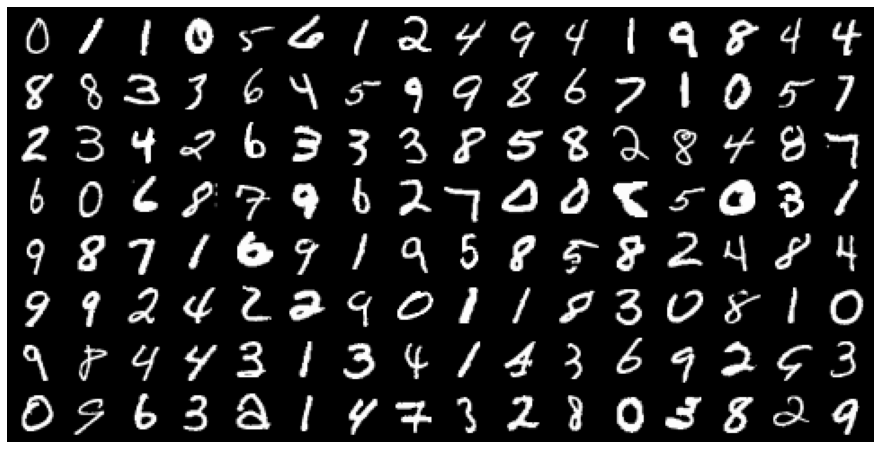

In [ ]:
for images, _ in train_loader:
    print('images.shape:', images.shape)
    plt.figure(figsize=(16,8))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=16).permute((1, 2, 0)))
    break

Now, we will create a simple fully connected Network with two Linear layers and a RELU nonlinear activation:

In [ ]:
class Net(nn.Module):
  def __init__(self, input_size, hidden_size, num_classes):
    super().__init__()
    self.fc1 = nn.Linear(input_size, hidden_size)
    self.fc2 = nn.Linear(hidden_size, num_classes)

  def forward(self, x):
    x = x.view(x.size(0), -1)
    x = self.fc1(x)
    x = F.relu(x)
    x = self.fc2(x)
    return x

The model can now be initialized and a summary is printed below. We will create a model which has a width of 10, and it can be seen that the number of parameters is 7,960 so were in the under-parametrized regime. Since the number of parameters are less than the number of samples.

In [ ]:
model = Net(input_size=input_size, hidden_size=10, num_classes=num_classes).to(device)
summary(model, (1, input_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]           7,850
            Linear-2                   [-1, 10]             110
Total params: 7,960
Trainable params: 7,960
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.03
Estimated Total Size (MB): 0.03
----------------------------------------------------------------


We can now train our network in the fit function below doing the forward pass, backward pass, and the gradient descent step. The function also intializes the optimizer and loss function as well as computes the training loss and validation loss:

In [ ]:
def fit(epochs, lr, model, train_loader, criterion, opt, validation_loader):
  optimizer = opt
  train_losses = []
  training_loss = []
  validation_loss = []
  accuracy = []

  for epoch in range(epochs):
    training_loss = []
    for index, (data, labels) in enumerate(train_loader):
      # Giving data to cuda
      data = data.reshape(data.size(0), -1).to(device=device)
      labels = labels.to(device=device)
      # forward pass
      y_hat = model(data)
      loss = criterion(y_hat, labels)
      training_loss.append(loss)

      # backward pass
      loss.backward()

      # gradient descent
      optimizer.step()
      optimizer.zero_grad()
    avg_validation_loss = torch.stack(get_validation_loss(validation_loader, criterion, model)).mean().item()
    avg_training_loss = torch.stack(training_loss).mean().item()
    train_losses.append(avg_training_loss)
    validation_loss.append(avg_validation_loss)
    print (f'Epoch [{epoch+1}/{epochs}]: The training loss is {avg_training_loss:.4f} & validation loss is {avg_validation_loss:.4f}')
  return train_losses, validation_loss


We will also create a function which will compute the validation loss from the validation set:

In [ ]:
@torch.no_grad()
def get_validation_loss(validation_loader, criterion, model):
  validation_loss = []
  for index, (data, labels) in enumerate(validation_loader):
     # Giving data to cuda
      data = data.reshape(data.size(0), -1).to(device=device)
      labels = labels.to(device=device)
      # forward pass
      y_hat = model(data)
      loss = criterion(y_hat, labels)
      validation_loss.append(loss)
  return validation_loss

Below calls the fit function using our hyperparameters, model, the Cross Entropy Loss, and Adam as the optimizer:

In [ ]:
train_loss, val_loss = fit(num_epochs, eta, model, train_loader, 
                           nn.CrossEntropyLoss(), torch.optim.Adam(model.parameters(), lr=eta), 
                           validation_loader)

Epoch [1/20]: The training loss is 0.8123 & validation loss is 0.4225
Epoch [2/20]: The training loss is 0.3488 & validation loss is 0.3248
Epoch [3/20]: The training loss is 0.3009 & validation loss is 0.3004
Epoch [4/20]: The training loss is 0.2795 & validation loss is 0.2825
Epoch [5/20]: The training loss is 0.2662 & validation loss is 0.2849
Epoch [6/20]: The training loss is 0.2572 & validation loss is 0.2698


KeyboardInterrupt: ignored

Now, we can plot the training loss and the validation loss to see the results:

In [ ]:
plt.plot(train_loss, '-bx')
plt.plot(val_loss, '-rx')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Training', 'Validation'])
plt.title('Loss for epochs')

Finally, we can make an accuracy function which will compute the accuracy of our model:

In [ ]:
@torch.no_grad()
def attain_accuracy(loader, model):
  correct_pred = 0
  num_samples = 0
  model.eval()
  for data, labels in loader:
    data = data.reshape(-1, 28*28).to(device=device)
    labels = labels.to(device=device)

    scores = model(data)
    _, preds = scores.max(1)
    correct_pred += (preds == labels).sum().item()
    num_samples += labels.size(0)

  print(f'There were {correct_pred} correct predictions out of {num_samples} samples with and accuracy of {float(correct_pred)/float(num_samples)*100:.2f}')
  model.train()

attain_accuracy(train_loader, model)
attain_accuracy(test_loader, model)

Now, we will keep everything the same, but increase the number of parameters in the network. The number of parameters will now be greater than the number of samples putting us in the over-parametrized regime. Let's see how the accuracy is affected. We will increase the number of parameters in the model by changing the number of nuerons to 500 in each of the layers below. We see there are now 397,510 parameters, so we are in the over-parametrized regime.

In [ ]:
model = Net(input_size=input_size, hidden_size=500, num_classes=num_classes).to(device)
summary(model, (1, 28*28))

We will train our network again to check to see how the accuracy was affected:

In [ ]:
train_loss, val_loss = fit(num_epochs, eta, model, train_loader, 
                           nn.CrossEntropyLoss(), torch.optim.Adam(model.parameters(), lr=eta), 
                           validation_loader)

Once again, we will plot the training loss and validation loss of our model in the over-parametrized regime:

In [ ]:
plt.plot(train_loss, '-bx')
plt.plot(val_loss, '-rx')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Training', 'Validation'])
plt.title('Loss for epochs')

Let's check the accuracy of the over-parametrized regime model:

In [ ]:
attain_accuracy(train_loader, model)
attain_accuracy(test_loader, model)

We can see in this case when we are in the over-parametrized regime the accuracy is much better than in the case where we are in the under-parametrized regime. The question is if we have reached the sweet spot and if it's possible to do better? For the last model we will increase the width to 10,000 neurons giving us a total of 7,950,010 parameters.

In [ ]:
model = Net(input_size=input_size, hidden_size=10000, num_classes=num_classes).to(device)
summary(model, (1, 28*28))

We are certainly in a over-parametrized regime we will train our network again to check to see how the accuracy was affected:

In [ ]:
train_loss, val_loss = fit(num_epochs, eta, model, train_loader, 
                           nn.CrossEntropyLoss(), torch.optim.Adam(model.parameters(), lr=eta), 
                           validation_loader)

Plotting the training loss and validation loss of our model in the over-parametrized regime:

In [ ]:
plt.plot(train_loss, '-bx')
plt.plot(val_loss, '-rx')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Training', 'Validation'])
plt.title('Loss for epochs')

Checking the accuracy of the over-parametrized regime model:

In [ ]:
attain_accuracy(train_loader, model)
attain_accuracy(test_loader, model)

We see that we get an even better accuracy on our test set!

## Verifying the equivalence between the non-negative eigenvalues of the inner and outer products of a matrix and its transpose

In [ ]:
import numpy as np
import torch

n, m = 30, 200
A = torch.rand((n, m))
# Transpose of A
AT = torch.transpose(A, 0, 1)

# Matrix multiplications of A and AT
AAT = torch.matmul(A, AT)
ATA = torch.matmul(AT, A)

# Computing the (complex) eigenvalues of both matrices
_v1 = torch.linalg.eigvals(AAT)
_v2 = torch.linalg.eigvals(ATA)

# Since both matrices `AAT` & `ATA` are PSD, their eigenvalues are real. Sort them
eigenvals = [[], []]
eigenvals[0], _ = torch.sort(_v1.real, descending=True, stable=True)
eigenvals[1], _ = torch.sort(_v2.real, descending=True, stable=True)

idx_min, idx_max = (0, 1) if len(eigenvals[0]) < len(eigenvals[1]) else (1, 0)
len_min, len_max = len(eigenvals[idx_min]), len(eigenvals[idx_max])

# Because of floating point errors, the values mightnot be exactly same. Using allclose
assert torch.allclose(eigenvals[idx_min], eigenvals[idx_max][:len_min]), f'Non-negative eigenvalues are not the same'
assert torch.allclose(torch.zeros(len_max-len_min), eigenvals[idx_max][len_min:], atol=1e-4), f'Remaining eigenvalues are not close to 0'

# Lecture 4: Implicit Bias in Deep Learning

In [ ]:
import numpy
import matplotlib.pyplot as plt
import torch
import torch.nn as nn

### Create a dataset

In [ ]:
x_1 = torch.normal(1.5,1.0, (150, 2))
x_2 = torch.normal(5.0,0.5, (150, 2))
x = torch.cat((x_1,x_2))
y = torch.cat((torch.ones(150),-torch.ones(150))).unsqueeze(-1)
shuffle = torch.randperm(300)
x = x[shuffle]
y = y[shuffle]

Here, we generate the training example by two gaussian distributions in $R^2$. 

In [ ]:
plt.scatter(x_1[:,0], x_1[:,1], c='r')
plt.scatter(x_2[:,0], x_2[:,1], c='g')

### Define Linear Classifier and optimizer

In [ ]:
### Linear Classifier and optimizer for hinge loss
linear_classifier_hinge = nn.Sequential(nn.Linear(2,1))
optimizer_hinge = torch.optim.Adam(linear_classifier_hinge.parameters(), lr=0.1)

### Linear Classifier and optimizer for logistic loss
linear_classifier_log = nn.Sequential(nn.Linear(2,1))
optimizer_log = torch.optim.Adam(linear_classifier_log.parameters(), lr=0.1)

### Linear Classifier and optimizer for exponential loss
linear_classifier_exp = nn.Sequential(nn.Linear(2,1))
optimizer_exp = torch.optim.Adam(linear_classifier_exp.parameters(), lr=0.1)

### Define Loss Function

In [ ]:
def hinge_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.max(torch.zeros_like(u), 1-u))
def exponential_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.exp(-u))
def logistic_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.log(1+torch.exp(-u)))

### A helper function to compute the slope and intercept
def compute_line(state_dict):
    w = state_dict['0.weight'][0,0]/(-state_dict['0.weight'][0,1])
    b = state_dict['0.bias']/(-state_dict['0.weight'][0,1])
    return w,b 

Now let's train the linear classifier

In [ ]:
epochs = 1000
for i in range(epochs):
    loss = hinge_loss(linear_classifier_hinge(x), y)
    optimizer_hinge.zero_grad()
    loss.backward()
    optimizer_hinge.step()
w_hinge, b_hinge = compute_line(linear_classifier_hinge.state_dict())

for i in range(epochs):
    loss = exponential_loss(linear_classifier_exp(x), y)
    optimizer_exp.zero_grad()
    loss.backward()
    optimizer_exp.step()
w_exp, b_exp = compute_line(linear_classifier_exp.state_dict())

for i in range(epochs):
    loss = logistic_loss(linear_classifier_log(x), y)
    optimizer_log.zero_grad()
    loss.backward()
    optimizer_log.step()
w_log, b_log = compute_line(linear_classifier_log.state_dict())

After finishing the training, let's plot the decision boundary generated by each loss.

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(x_1[:,0], x_1[:,1], c='r')
plt.scatter(x_2[:,0], x_2[:,1], c='g')
line_1,_ = plt.plot(x, w_exp*x+b_exp, label='exponential loss', c='coral')
line_2,_ = plt.plot(x, w_log*x+b_log, label='logistic loss',c='y')
line_3,_ = plt.plot(x, w_hinge*x+b_hinge, label='hinge loss', c='k')
plt.legend(handles=[line_1, line_2, line_3])

As we can see from the plot, hinge loss indeed gives a decision margin with the maximum margin. However, for logistic loss and exponential loss, even though both of them achieves 100% training accuracy, they don't produce decision boundary that has the maximum margin to keep the points on both sides away from the boundary. In fact, these two loss functions produce very similar decision boundaries in our case.

Let's see how decision boundary changes during training for hinge loss. We will run gradient descent for 3000 steps and compute the decision boundary at epoch 500, 1000, 2000, and 3000.

In [ ]:
linear_classifier_exp = nn.Sequential(nn.Linear(2,1))
optimizer_exp = torch.optim.Adam(linear_classifier_exp.parameters(), lr=0.1)
epochs = 3000
cut_off = [499,1000, 1999,2999]
w, b = [], []
for i in range(epochs):
    loss = exponential_loss(linear_classifier_exp(x), y)
    optimizer_exp.zero_grad()
    loss.backward()
    optimizer_exp.step()
    if i in cut_off:
        w_exp, b_exp = compute_line(linear_classifier_exp.state_dict())
        w.append(w_exp)
        b.append(b_exp)

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(x_1[:,0], x_1[:,1], c='r')
plt.scatter(x_2[:,0], x_2[:,1], c='g')
line_1,_ = plt.plot(x, w[0]*x+b[0], label='epoch 500', c='coral')
line_2,_ = plt.plot(x, w[1]*x+b[1], label='epoch 1000', c='y')
line_3,_ = plt.plot(x, w[2]*x+b[2], label='epoch 2000', c='c')
line_4,_ = plt.plot(x, w[3]*x+b[3], label='epoch 3000', c='k')
plt.legend(handles=[line_1, line_2, line_3, line_4])

As we observe here, as training goes on, the margin of the linear classifier trained with exponential loss function in fact increases, even though the training accuracy remains at 100%.

We can see particuarly how margin changes vs. the number of training iterations. We calculate margin using the point to line formula, and plot how it changes over 5000 epochs

In [ ]:
linear_classifier_exp = nn.Sequential(nn.Linear(2,1))
optimizer_exp = torch.optim.Adam(linear_classifier_exp.parameters(), lr=0.1)
epochs = 5000
w, b = [], []
for i in range(epochs):
    loss = exponential_loss(linear_classifier_exp(x), y)
    optimizer_exp.zero_grad()
    loss.backward()
    optimizer_exp.step()
    w_exp, b_exp = compute_line(linear_classifier_exp.state_dict())
    w.append(w_exp)
    b.append(b_exp)


In [ ]:
def distance(x,y,m,b):
  return abs(-m*x+1*y-b)/(m**2+1)**.5

min_dists = []
for i in range(len(w)):
  m_temp = float(w[i])
  b_temp = float(b[i])
  distances = distance(x[:,0],x[:,1],m_temp,b_temp)
  min_dists.append(min(distances))

In [ ]:
plt.figure(figsize=(10,7))
plt.plot(list(range(len(min_dists))),min_dists)
plt.xlabel("Epoch Number")
plt.ylabel("Distance to closest point")

We see that, initially, the margin fluctuates (as it's learning the correct boundary, and so it's passing through a point). 
However, past ~1500 epochs, the margin consistenly increases, showing that additional training iterations can lead to a larger margin. 

## Support Vector Machines (SVMs) Walkthrough

This notebook contains a walkthrough of SVMs and some of their properties credits is given to [1] in references.

Definition: A Support Vector Machine (SVM) is a very powerful and versatile Machine Learning model, capable of performing linear or nonlinear classification, regression, and even outlier detection.

First, import a few common modules.

In [ ]:
import sys
import sklearn
import numpy as np
import os
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.datasets import load_iris

### Large Margin Classification


Linear SVM classification is classifying two classes that can be seperated by a straight line (linearly seperable). Below the iris dataset is used the left plot shows the decision boundaries of three possible linear classifiers. Notice, the model whose decision boundary is represented by the dashed line is so bad that it does not even separate the classes properly. The other two models work perfectly on this training set, but their decision boundaries come so close to the instances that these models will probably not perform as well on new instances. Conversely, the solid line in the plot on the right represents the decision boundary of an SVM classifier; this line not only separates the two classes but also stays as far away from the closest training instances as possible which is called large margin classification.

In [ ]:
iris = load_iris() # loading the Iris data set
X = iris["data"][:, (2, 3)]  # Obtaining only petal length, petal width
y = iris["target"] # Obtaining all label data

# Selecting only setosa or versicolor iris species
setosa_or_versicolor = (y == 0) | (y == 1) 
X = X[setosa_or_versicolor]
y = y[setosa_or_versicolor]

# SVM Classifier model
svm_clf = SVC(kernel="linear", C=float("inf"))
svm_clf.fit(X, y) # fitting the model

In [ ]:
# Bad models
x0 = np.linspace(0, 5.5, 200)
pred_1 = 5*x0 - 20
pred_2 = x0 - 1.8
pred_3 = 0.1 * x0 + 0.5

def plot_svc_decision_boundary(svm_clf, xmin, xmax):
    w = svm_clf.coef_[0]
    b = svm_clf.intercept_[0]

    # At the decision boundary, w0*x0 + w1*x1 + b = 0
    # => x1 = -w0/w1 * x0 - b/w1
    x0 = np.linspace(xmin, xmax, 200)
    decision_boundary = -w[0]/w[1] * x0 - b/w[1]

    margin = 1/w[1]
    gutter_up = decision_boundary + margin
    gutter_down = decision_boundary - margin

    svs = svm_clf.support_vectors_
    plt.scatter(svs[:, 0], svs[:, 1], s=180, facecolors='#FFAAAA')
    plt.plot(x0, decision_boundary, "k-", linewidth=2)
    plt.plot(x0, gutter_up, "k--", linewidth=2)
    plt.plot(x0, gutter_down, "k--", linewidth=2)

fig, axes = plt.subplots(ncols=2, figsize=(10,2.7), sharey=True)

plt.sca(axes[0])
plt.plot(x0, pred_1, "g--", linewidth=2)
plt.plot(x0, pred_2, "m-", linewidth=2)
plt.plot(x0, pred_3, "r-", linewidth=2)
plt.plot(X[:, 0][y==1], X[:, 1][y==1], "bs", label="Iris versicolor")
plt.plot(X[:, 0][y==0], X[:, 1][y==0], "yo", label="Iris setosa")
plt.xlabel("Petal length", fontsize=14)
plt.ylabel("Petal width", fontsize=14)
plt.legend(loc="upper left", fontsize=14)
plt.axis([0, 5.5, 0, 2])

plt.sca(axes[1])
plot_svc_decision_boundary(svm_clf, 0, 5.5)
plt.plot(X[:, 0][y==1], X[:, 1][y==1], "bs")
plt.plot(X[:, 0][y==0], X[:, 1][y==0], "yo")
plt.xlabel("Petal length", fontsize=14)
plt.axis([0, 5.5, 0, 2])
plt.show()

### Sensitivity to feature scales

SVMs are sensitive to the feature scales, in the left plot, the vertical scale is much larger than the horizontal scale, so the widest possible street is close to horizontal. After feature scaling (e.g., using Scikit-Learn’s StandardScaler), the decision boundary looks much better (on the right plot).

In [ ]:
Xs = np.array([[1, 50], [5, 20], [3, 80], [5, 60]]).astype(np.float64)
ys = np.array([0, 0, 1, 1])
svm_clf = SVC(kernel="linear", C=100)
svm_clf.fit(Xs, ys)

plt.figure(figsize=(9,2.7))
plt.subplot(121)
plt.plot(Xs[:, 0][ys==1], Xs[:, 1][ys==1], "bo")
plt.plot(Xs[:, 0][ys==0], Xs[:, 1][ys==0], "ms")
plot_svc_decision_boundary(svm_clf, 0, 6)
plt.xlabel("$x_0$", fontsize=20)
plt.ylabel("$x_1$    ", fontsize=20, rotation=0)
plt.title("Unscaled", fontsize=16)
plt.axis([0, 6, 0, 90])

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(Xs)
svm_clf.fit(X_scaled, ys)

plt.subplot(122)
plt.plot(X_scaled[:, 0][ys==1], X_scaled[:, 1][ys==1], "bo")
plt.plot(X_scaled[:, 0][ys==0], X_scaled[:, 1][ys==0], "ms")
plot_svc_decision_boundary(svm_clf, -2, 2)
plt.xlabel("$x'_0$", fontsize=20)
plt.ylabel("$x'_1$  ", fontsize=20, rotation=0)
plt.title("Scaled", fontsize=16)
plt.axis([-2, 2, -2, 2])

### Sensitivity to outliers

A hard margin classification is when we strictly impose that all instances be off the street and on the right side. There are two main issues with hard margin classification. First, it only works if the data is linearly separable, and second it is quite sensitive to outliers. Below only one additional outlier was added to the previous data: on the left, it is impossible to find a hard margin, and on the right the decision boundary ends up very different from the one we saw in figure above without the outlier, and it will probably not generalize as well.

In [ ]:
X_outliers = np.array([[3.4, 1.3], [3.2, 0.8]])
y_outliers = np.array([0, 0])
Xo1 = np.concatenate([X, X_outliers[:1]], axis=0)
yo1 = np.concatenate([y, y_outliers[:1]], axis=0)
Xo2 = np.concatenate([X, X_outliers[1:]], axis=0)
yo2 = np.concatenate([y, y_outliers[1:]], axis=0)

svm_clf2 = SVC(kernel="linear", C=10**9)
svm_clf2.fit(Xo2, yo2)

fig, axes = plt.subplots(ncols=2, figsize=(10,2.7), sharey=True)

plt.sca(axes[0])
plt.plot(Xo1[:, 0][yo1==1], Xo1[:, 1][yo1==1], "bs")
plt.plot(Xo1[:, 0][yo1==0], Xo1[:, 1][yo1==0], "yo")
plt.text(0.3, .7, "Impossible!", fontsize=24, color="red")
plt.xlabel("Petal length", fontsize=14)
plt.ylabel("Petal width", fontsize=14)
plt.annotate("Outlier",
             xy=(X_outliers[0][0], X_outliers[0][1]),
             xytext=(2.5, 1.7),
             ha="center",
             arrowprops=dict(facecolor='black', shrink=0.1),
             fontsize=16,
            )
plt.axis([0, 5.5, 0, 2])

plt.sca(axes[1])
plt.plot(Xo2[:, 0][yo2==1], Xo2[:, 1][yo2==1], "bs")
plt.plot(Xo2[:, 0][yo2==0], Xo2[:, 1][yo2==0], "yo")
plot_svc_decision_boundary(svm_clf2, 0, 5.5)
plt.xlabel("Petal length", fontsize=14)
plt.annotate("Outlier",
             xy=(X_outliers[1][0], X_outliers[1][1]),
             xytext=(3.2, 0.08),
             ha="center",
             arrowprops=dict(facecolor='black', shrink=0.1),
             fontsize=16,
            )
plt.axis([0, 5.5, 0, 2])
plt.show()

### Large margin *vs* margin violations

This is why it's better to use a soft margin classification which will find a good balance between keeping the street as large as possible and limiting the
margin violations (i.e., instances that end up in the middle of the street or even on the wrong side). In Scikit-Learn’s SVM classes, you can control this balance using the C hyperparameter: a smaller C value leads to a wider street but more margin violations. Below it shows the decision boundaries and margins of two soft margin SVM classifiers on a nonlinearly separable dataset. On the left, using a low C value the margin is quite large, but many instances end up on the street. On the right, using a high C value the classifier makes fewer margin violations but ends up with a smaller margin. However, it seems likely that the first classifier will generalize better: in fact even on this training set it makes fewer prediction errors, since most of the margin violations are
actually on the correct side of the decision boundary.

The code below  loads the iris dataset, scales the features, and then
trains a linear SVM model (using the LinearSVC class with C = 1 and the hinge loss function) to detect Iris-Virginica flowers.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC

iris = sklearn.datasets.load_iris()
X = iris["data"][:, (2, 3)]  # petal length, petal width
y = (iris["target"] == 2).astype(np.float64)  # Iris virginica

svm_clf = Pipeline([
        ("scaler", StandardScaler()),
        ("linear_svc", LinearSVC(C=1, loss="hinge", random_state=42)),
    ])

svm_clf.fit(X, y)

scaler = StandardScaler()
svm_clf1 = LinearSVC(C=1, loss="hinge", random_state=42)
svm_clf2 = LinearSVC(C=100, loss="hinge", random_state=42)

scaled_svm_clf1 = Pipeline([
        ("scaler", scaler),
        ("linear_svc", svm_clf1),
    ])
scaled_svm_clf2 = Pipeline([
        ("scaler", scaler),
        ("linear_svc", svm_clf2),
    ])

scaled_svm_clf1.fit(X, y)
scaled_svm_clf2.fit(X, y)

# Convert to unscaled parameters
b1 = svm_clf1.decision_function([-scaler.mean_ / scaler.scale_])
b2 = svm_clf2.decision_function([-scaler.mean_ / scaler.scale_])
w1 = svm_clf1.coef_[0] / scaler.scale_
w2 = svm_clf2.coef_[0] / scaler.scale_
svm_clf1.intercept_ = np.array([b1])
svm_clf2.intercept_ = np.array([b2])
svm_clf1.coef_ = np.array([w1])
svm_clf2.coef_ = np.array([w2])

# Find support vectors (LinearSVC does not do this automatically)
t = y * 2 - 1
support_vectors_idx1 = (t * (X.dot(w1) + b1) < 1).ravel()
support_vectors_idx2 = (t * (X.dot(w2) + b2) < 1).ravel()
svm_clf1.support_vectors_ = X[support_vectors_idx1]
svm_clf2.support_vectors_ = X[support_vectors_idx2]

fig, axes = plt.subplots(ncols=2, figsize=(10,2.7), sharey=True)

plt.sca(axes[0])
plt.plot(X[:, 0][y==1], X[:, 1][y==1], "g^", label="Iris virginica")
plt.plot(X[:, 0][y==0], X[:, 1][y==0], "bs", label="Iris versicolor")
plot_svc_decision_boundary(svm_clf1, 4, 5.9)
plt.xlabel("Petal length", fontsize=14)
plt.ylabel("Petal width", fontsize=14)
plt.legend(loc="upper left", fontsize=14)
plt.title("$C = {}$".format(svm_clf1.C), fontsize=16)
plt.axis([4, 5.9, 0.8, 2.8])

plt.sca(axes[1])
plt.plot(X[:, 0][y==1], X[:, 1][y==1], "g^")
plt.plot(X[:, 0][y==0], X[:, 1][y==0], "bs")
plot_svc_decision_boundary(svm_clf2, 4, 5.99)
plt.xlabel("Petal length", fontsize=14)
plt.title("$C = {}$".format(svm_clf2.C), fontsize=16)
plt.axis([4, 5.9, 0.8, 2.8])

### References

1. Géron, A. (2019). Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems (2nd ed.). O’Reilly Media.

## Comparing LinearSVC, SVC, and SGDClassifier on linearly seperable data

This section test the robustness of Stochastic Gradient Descent on a randomly generated data set which is linearly seperable. We'll start by importing the necessary libraries.

In [ ]:
from sklearn.svm import SVC, LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

Now, we will generate the random data set and label them based on if the data point lies above or below the line $y = -x$, so if the point lies above this line it is labeled 1.

In [ ]:
# Generating 50 random x, y points between range [-20, -1] and generating 50 random x, y points between range [1, 20]
X = np.concatenate((np.random.uniform(low=-20, high=-1, size=(50, 2)), np.random.uniform(low=1, high=20, size=(50, 2))), axis=0)
# Making label np array will all zeros
y = np.zeros(shape=(100, ))
# Labeling all points where x + y > 0, so all points above or on y = x will be labeled as 1
y = np.array([1 if pt[0] + pt[1] > 0 else 0 for pt in X])

The following calls LinearSVC, SVC, and SGDClassifier to get the fitted predictors feel free to change max_iter parameter to see how the performance of SGD changes on the problem.

In [ ]:
# Calling LinearSVC, SVC, and SGDClassifier to get fitted predictors
lin_clf = LinearSVC(loss="hinge")
svm_clf = SVC(kernel="linear")
sgd_clf = SGDClassifier(loss="hinge", eta0=0.001, alpha=.002, max_iter=100000)

The code below scales the feature data using StandardScaler.

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Here, we are fitting the models using the scaled features.

In [ ]:
lin_clf.fit(X_scaled, y)
svm_clf.fit(X_scaled, y)
sgd_clf.fit(X_scaled, y)

We then compute the slope and bias of each of the following decision boundaries.

In [ ]:
w1 = -lin_clf.coef_[0, 0] / lin_clf.coef_[0, 1]
b1 = -lin_clf.intercept_[0] / lin_clf.coef_[0, 1]
w2 = -svm_clf.coef_[0, 0] / svm_clf.coef_[0, 1]
b2 = -svm_clf.intercept_[0] / svm_clf.coef_[0, 1]
w3 = -sgd_clf.coef_[0, 0] / sgd_clf.coef_[0, 1]
b3 = -sgd_clf.intercept_[0] / sgd_clf.coef_[0, 1]

Finally, we invert the transformation of the boundary lines so the original scale is obtained.

In [ ]:
line1 = scaler.inverse_transform([[-10, -10 * w1 + b1], [10, 10 * w1 + b1]])
line2 = scaler.inverse_transform([[-10, -10 * w2 + b2], [10, 10 * w2 + b2]])
line3 = scaler.inverse_transform([[-10, -10 * w3 + b3], [10, 10 * w3 + b3]])

Below all the decision lines for each model is plotted and it can be seen that the performance of SGD is quite similar to the LinearSVC and SVC.

In [ ]:
plt.figure(figsize=(11, 4))
plt.plot(line1[:, 0], line1[:, 1], "k:", label="LinearSVC")
plt.plot(line2[:, 0], line2[:, 1], "b--", linewidth=2, label="SVC")
plt.plot(line3[:, 0], line3[:, 1], "r-", label="SGDClassifier")
plt.plot(X[:, 0][y == 1], X[:, 1][y == 1], "bs")  # label="Iris versicolor"
plt.plot(X[:, 0][y == 0], X[:, 1][y == 0], "yo")  # label="Iris setosa"
plt.xlabel("X coordinates")
plt.ylabel("Y coordinates")
plt.legend(loc="lower center")
plt.axis([-20, 20, -20, 20])
plt.show()

# Lecture 5: Implicit Bias in Deep Learning (Part 2)

## Analysis on Linearly Separable data

### Dataset generation and SVM implementation

We import required libraries and define loss functions which will be used in our analysis. These loss functions were defined before in the programming examples for lecture 4. We copy that code again here for ease of use.

In [ ]:
## Importing required libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import imageio
import os
from IPython.display import Image

In [ ]:
## Redefining losses from the previous section
def hinge_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.max(torch.zeros_like(u), 1-u))
def exponential_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.exp(-u))
def logistic_loss(logits, labels):
    u = logits*labels
    return torch.mean(torch.log(1+torch.exp(-u)))

We generate linearly separable data similar to the Lecture 4 programming examples.

In [ ]:
## We generate linearly separable data
x_1 = torch.normal(-5.0,1.0, (1500, 2))
x_2 = torch.normal(5.0,1.0, (1500, 2))
x = torch.cat((x_1,x_2))
y = torch.cat((torch.ones(1500),-torch.ones(1500))).unsqueeze(-1)
shuffle = torch.randperm(3000)
x = x[shuffle]
y = y[shuffle]

We plot the data and the SVM max-margin hyperplane below. We calculate the SVM solution and store it in  𝑤𝑠𝑣𝑚  as it is needed for the convergence analysis.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


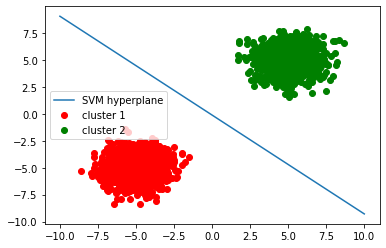

In [ ]:
# We obtain the SVM solution (w_svm) and plot it
from sklearn import svm
svm_model = svm.SVC(kernel='linear')
svm_model.fit(x, y)

w = -svm_model.coef_[0, 0] / svm_model.coef_[0, 1]
b = -svm_model.intercept_[0] / svm_model.coef_[0, 1]
x_temp = np.linspace(-10,10,1000)
y_temp = w*x_temp + b

w_svm = svm_model.coef_[0]
w_svm_norm = w_svm/np.linalg.norm(w_svm)

plt.scatter(x_1[:,0], x_1[:,1], c='r', label="cluster 1")
plt.scatter(x_2[:,0], x_2[:,1], c='g', label="cluster 2")
plt.plot(x_temp, y_temp, label="SVM hyperplane")
plt.legend()
plt.show()

### Gradient Descent code and helper functions

We define a function that performs gradient descent given a specified loss function (exponential or logistic or hinge loss), a model and an optimizer (SGD or ADAM). This allows us to check convergence behaviour on a wide range of scenarios.

In [ ]:
## We define gradient descent for a specific loss function, model and optimizer.
## We will call the same function defined below to check convergence behavior for different settings.

import copy

def gradient_descent_step(loss_func, model, optimizer, x, y):
  w_t = copy.deepcopy(model[0].weight.detach().numpy())
  loss = loss_func(model(x), y)
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()
  return loss.detach().numpy(), w_t

def gradient_descent(num_iterations, loss_func, model, optimizer, x, y, batch_size=None):
  loss_list = []
  list_w_t = []
  if batch_size is None:
    batch_size = len(x)
  for i in range(num_iterations):
    shuffle = torch.randperm(3000)[:batch_size]
    loss, w_t = gradient_descent_step(loss_func, model, optimizer, x[shuffle], y[shuffle])
    loss_list.append(loss)
    list_w_t.append(w_t)
  return loss_list, list_w_t

We define some helper functions below to plot the convergence behaviour of various parameters of interest.

In [ ]:
## Code to plot graphs

def plot_loss(loss_list):
  '''Function plots loss (L(w_t)) as t tends to infinity'''
  plt.plot(loss_list)
  plt.title("Convergence of $L(w_t)$ as $t \longrightarrow \infty$")
  plt.xlabel("$t$")
  plt.ylabel("$L(w_t)$")
  plt.show()

def plot_wt_convergence(w_t_list):
  '''Function plots (|| w_t/||w_t|| - w_{svm}/||w_{svm}|| ||) as t tends to infinity'''
  w_t_list_norm = [w_t/np.linalg.norm(w_t) for w_t in w_t_list]
  w_t_diff_w_svm = [np.linalg.norm(w_t_norm - w_svm_norm) for w_t_norm in w_t_list_norm]
  plt.plot(w_t_diff_w_svm)
  plt.title("Convergence of $||{w_t}/||w_t|| - w_{svm}/||w_{svm}||||$ as $t \longrightarrow \infty$")
  plt.xlabel("$t$")
  #plt.ylabel("$|| w_t/||w_t|| - w_{svm}/||w_{svm}|| ||$")
  plt.show()

def plot_wt_norm(w_t_list):
  '''Function plots the ||w_t|| as t tends to infinity'''
  w_t_list_norm = [np.linalg.norm(w_t) for w_t in w_t_list]
  plt.plot(w_t_list_norm)
  plt.title("$||w_t||$ as $t \longrightarrow \infty$")
  plt.xlabel("$t$")
  plt.ylabel("$||w_t||$")
  plt.show()

def generate_plots(loss_list, w_t_list):
  '''Function to plot all the above graphs'''
  plot_loss(loss_list)
  plot_wt_convergence(w_t_list)
  plot_wt_norm(w_t_list)

In [ ]:
def animate_wt(w_t_list, w_svm_norm, x_1, x_2, descriptor):
    try:
        os.mkdir('./model_snapshots'+descriptor)
    except:
        pass
    filenames = []
    x_temp = np.linspace(-10,10,10)
    y_svm = w_svm_norm*x_temp
    for i in range(0, len(w_t_list), 200):
        w = w_t_list[i]
        w = -w[0, 0]/w[0, 1]
        y_temp = w*x_temp
        
        plt.scatter(x_1[:,0], x_1[:,1], c='r', label="cluster 1")
        plt.scatter(x_2[:,0], x_2[:,1], c='g', label="cluster 2")
        plt.plot(x_temp, y_temp, label="Model plane")
        plt.plot(x_temp, y_svm, label="SVM plane")
        plt.title("Iteration: "+str(i))
        plt.legend()
        plt.savefig('./model_snapshots'+descriptor+'/'+str(i//100)+'.png')
        plt.clf()
        filenames.append('./model_snapshots'+descriptor+'/'+str(i//100)+'.png')
    
    with imageio.get_writer('./change_in_w'+descriptor+'.gif', mode='I') as writer:
        for filename in filenames:
            writer.append_data(imageio.imread(filename))

### Convergence plots for Gradient Descent

In the code block below, we define a one layer NN and optimize it with gradient descent. We use the exponential loss ($f(u) = e^{-u}$) in this case. Gradient descent is not stochastic, i.e. gradient is computed on the entire dataset for each update. We show that as the number of iterations goes to infinity, $L(w_t)$ asymptotically reaches $0$. This is only possible if $||w_t|| \to \infty$ as $t \to \infty$. From the third plot, we see that this is indeed the case. However, $||w_t||$ approaches infinity very slowly. After 20,000 updates, $||w_t||$ only has a value of ~$1.8$. In the second plot, we see that SGD converges to the max-margin hyperplane obtained by SVM. It is quite evident that the loss value converges to zero faster than $w_t$ converges to $w_{svm}$. This is discussed in greater detail in the next section where we empirically quantify the convergence rate.

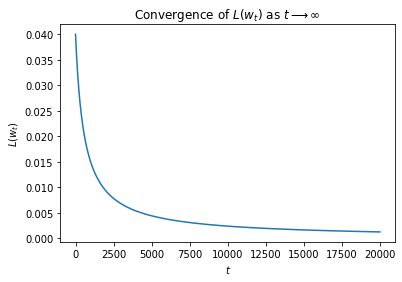

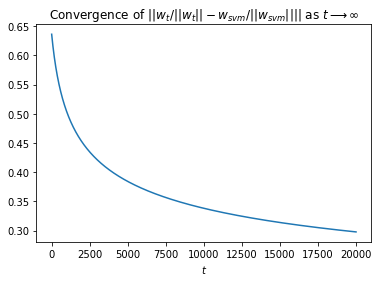

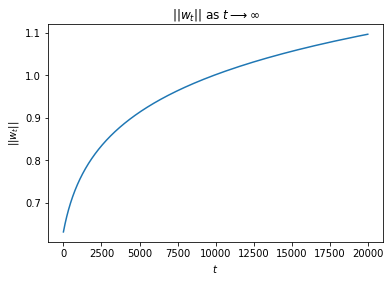

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 20000
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y)
generate_plots(loss_list, w_t_list)

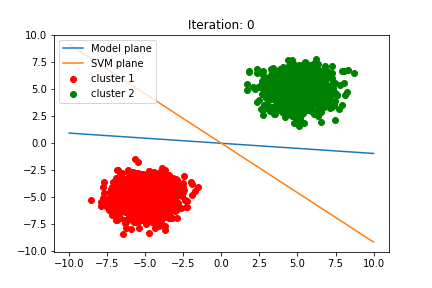

<Figure size 432x288 with 0 Axes>

In [ ]:
w_svm_norm = -svm_model.coef_[0, 0] / svm_model.coef_[0, 1]
animate_wt(w_t_list, w_svm_norm, x_1, x_2, '_linearly_seperable')
Image(open("./change_in_w_linearly_seperable.gif",'rb').read())

### Experimenting with different initializations of $\textbf{w}$

Let's try the same thing but with weights already initialized to a separating hyperplane, just not the max margin one

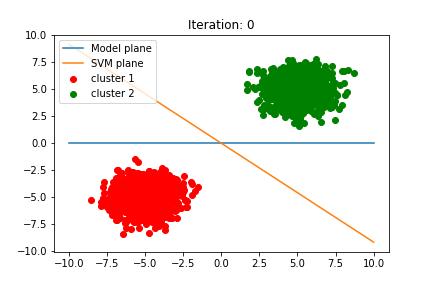

<Figure size 432x288 with 0 Axes>

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
with torch.no_grad():
    linear_classifier[0].weight.copy_(torch.Tensor([[0, 1]]))

sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=1e-3)
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y)

w_svm_norm = -svm_model.coef_[0, 0] / svm_model.coef_[0, 1]
animate_wt(w_t_list, w_svm_norm, x_1, x_2, '_linearly_seperable_init_0_1')

Image(open("./change_in_w_linearly_seperable_init_0_1.gif", "rb").read())

Repeating the same experiment with weights initialized to a non-separating hyperplane

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
with torch.no_grad():
    linear_classifier[0].weight.copy_(torch.Tensor([[-1, 1]]))

sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=1e-4)
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y)
w_svm_norm = -svm_model.coef_[0, 0] / svm_model.coef_[0, 1]
animate_wt(w_t_list, w_svm_norm, x_1, x_2, '_linearly_seperable_init_-1_1')
Image(open("./change_in_w_linearly_seperable_init_-1_1.gif", 'rb').read())

Here, the model plane DOES NOT converge to the SVM solution. We are still investigating why this is the case.

### Experimenting with different loss functions

We can repeat the above experiments with different kinds of losses too. Lets try logistic loss:

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 20000
loss_list, w_t_list = gradient_descent(num_iterations, logistic_loss, linear_classifier, sgd_optimizer, x, y)
generate_plots(loss_list, w_t_list)

In [ ]:
animate_wt(w_t_list, w_svm_norm, x_1, x_2, '_linearly_seperable_logistic')
Image(open("./change_in_w_linearly_seperable_logistic.gif", 'rb').read())

As we can see, logistic loss works well with GD too and model plane converges to SVM plane

Now lets try hinge loss

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 20000
loss_list, w_t_list = gradient_descent(num_iterations, hinge_loss, linear_classifier, sgd_optimizer, x, y)
generate_plots(loss_list, w_t_list)

In [ ]:
animate_wt(w_t_list, w_svm_norm, x_1, x_2, '_linearly_seperable_hinge')
Image(open("./change_in_w_linearly_seperable_hinge.gif", 'rb').read())

As we can see, hinge loss doesn't necessarily work well with gradient descent. This is because once the loss hits 0, there is no gradient update possible. Thus, we ideally need an exponential loss function for GD to converge to max margin.

### Convergence properties of Stochastic Gradient Descent (SGD)

Now, we look at the convergence properties of stochastic gradient descent. We start with the lowest batch size possible (1) and increase batch size gradually to the largest possible value

#### Batch size 1

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 100000
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y, batch_size=1)
generate_plots(loss_list, w_t_list)

#### Batch size 100

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 100000
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y, batch_size=100)
generate_plots(loss_list, w_t_list)

#### Batch size 1000

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 100000
loss_list, w_t_list = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y, batch_size=1000)
generate_plots(loss_list, w_t_list)

For stochastic gradient descent, although the loss curve is noisy for low batch size, we see that the plane does smoothly converge without any issues. However, in some trials, SGD may converge to a non-SVM separating plane, although it is rare as far as we checked



### Convergence plots for Adam

In the code block below, we check the convergence properties of the Adam optimizer. Apart from the optimizer, we don't change anything else when compared to the previous code block. From the plots, it is clear that Adam also converges to the SVM solution. This is quite surprising as the paper discussed in the class did not give any theoretical guarantees for optimizers other than GD.

In [ ]:
# Convergence behaviour for full-batch Adam in linearly separable case.
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.Adam(linear_classifier.parameters(), lr=0.001)
num_iterations = 20000
loss_list_adam, w_t_list_adam = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x, y)
generate_plots(loss_list_adam, w_t_list_adam)

NameError: ignored

In [ ]:
animate_wt(w_t_list_adam, w_svm_norm, x_1, x_2, '_linearly_seperable_adam')
Image(open("./change_in_w_linearly_seperable_adam.gif", 'rb').read())

### Convergence Rate

In the next block we define the two curves.

In [ ]:
from scipy.optimize import curve_fit

def one_over_t(x, a, b):
	return (a/x) + b
def one_over_log_t(x, a, b):
	return (a/np.log(x)) + b

#### Convergence rate of Loss of weights

Theorically convergence rate of loss of $w$ i.e. $L(w_t)$ is $O(\frac{1}{t})$. We do curve fitting with the equation $y = a*\frac{1}{t} + b$, where $a$ and $b$ are the parameters and $y$ is $L(w_t)$ values, to empirically find the convergence rate.

In [ ]:
t = np.array(range(100,num_iterations+100))
popt, _ = curve_fit(one_over_t, t, np.array(loss_list))
a, b = popt
loss_list_new = one_over_t(t, a, b)
error = np.linalg.norm(loss_list_new - np.array(loss_list))


plt.plot(t, loss_list_new, label="Fitted curve")
plt.plot(t, np.array(loss_list), label="Actual value")
plt.legend(loc="upper right")
plt.title("Convergence of $L(w_t)$ as $t \longrightarrow \infty$")
plt.xlabel("$t$")
plt.show()

print("Mean Square Error: ", error/num_iterations)

As you can see, the MSE between the actual curve value and fitted curve value is very small and the two curves overlap in the graph above, we can conclude that the rate of convergent of $L(w_t)$ is $O(1/t)$.

#### Convergence rate of the function $|| \frac{w_t}{||w_t||} - \frac{w_{svm}}{||w_{svm}||} ||$
Theorically convergence rate of the function $|| \frac{w_t}{||w_t||} - \frac{w_{svm}}{||w_{svm}||} ||$ is $O(\frac{1}{log(t)})$. We do curve fitting with the equation $y = a*\frac{1}{log(t)} + b$, where $a$ and $b$ are the parameters and $y$ is the function values to empirically find the convergence rate.

In [ ]:
w_t_list_norm = [w_t/np.linalg.norm(w_t) for w_t in w_t_list]
norm_diff = [np.linalg.norm(w_t_norm - w_svm_norm) for w_t_norm in w_t_list_norm]

#curve fitting
popt, _ = curve_fit(one_over_log_t, t, np.array(norm_diff))
a, b = popt
norm_diff_new = one_over_log_t(t, a, b)



plt.plot(t, norm_diff_new, label="Fitted curve")
plt.plot(t, np.array(norm_diff), label="Actual value")
plt.legend(loc="upper right")
plt.title("Convergence of $||{w_t}/||w_t|| - w_{svm}/||w_{svm}||||$ as $t \longrightarrow \infty$")
plt.xlabel("$t$")
plt.show()

print("Mean Square Error: ", np.linalg.norm(np.array(norm_diff) - norm_diff_new)/num_iterations)

As you see the MSE between the actual curve value and fitted curve value is very small and the two curves overlap in the graph above, we can conclude that the rate of convergent of $||{w_t}/||w_t|| - w_{svm}/||w_{svm}||||$ is $O(1/log(t))$.

## Gradient descent on data which is not linearly separable

We generate data which is not linearly separable and plot it below

In [ ]:

x_1 = torch.normal(2.5,1.0, (1500, 2))
x_2 = torch.normal(5.0,0.5, (1500, 2))
x_non = torch.cat((x_1,x_2))
y_non = torch.cat((torch.ones(1500),-torch.ones(1500))).unsqueeze(-1)
shuffle = torch.randperm(3000)
x_non = x_non[shuffle]
y_non = y_non[shuffle]

svm_model = svm.SVC(kernel='linear')
svm_model.fit(x_non, y_non)

w = -svm_model.coef_[0, 0] / svm_model.coef_[0, 1]
b = -svm_model.intercept_[0] / svm_model.coef_[0, 1]
x_temp = np.linspace(-2,8,1000)
y_temp = w*x_temp + b

w_svm = svm_model.coef_[0]
w_svm_norm = w_svm/np.linalg.norm(w_svm)

plt.scatter(x_1[:,0], x_1[:,1], c='r', label="cluster 1")
plt.scatter(x_2[:,0], x_2[:,1], c='g', label="cluster 2")
plt.plot(x_temp, y_temp, label="SVM hyperplane")
plt.legend()
plt.show()

In [ ]:
linear_classifier = nn.Sequential(nn.Linear(2, 1, bias=False))
sgd_optimizer = torch.optim.SGD(linear_classifier.parameters(), lr=0.001)
num_iterations = 20000
loss_list_non, w_t_list_non = gradient_descent(num_iterations, exponential_loss, linear_classifier, sgd_optimizer, x_non, y_non)
generate_plots(loss_list_non, w_t_list_non)

From the second graph above, we clearly see that GD does not converge to the SVM solution for the case of data which is not linearly separable. We also see that the $||w_t||$ does not tend to infinity.

# Lecture 6: Deep Learning Generalization

### An Example of the Generalization Error Bounding Theorem

For this section, we will provide an example that hopes to build intution as to why machine learning models have better generalization as they gain access to larger training samples. In particular, recall from lecture the following theorem:  
$L_D(h) - L_S(h) \leq 2R(F \cdot S) + O(1/\sqrt{n}) $  
where $R(\cdot)$ is the Radamacher complexity and n is the size of our training set.  
Along with this theorem, we had an example of its application:  
Let $H = \{h(x) = w^{T}x, ||w|| \leq 1\}$, i.e. H is the set of all linear models with norm less than or equal to 1.   
Then, $R(H \cdot S) \leq O(1/\sqrt{n})$, and, in combination with the previous theorem, we can prove that the generalization error of linear models behaves as $O(1/\sqrt{n})$.  
We now provide an example to build further intuition as to why this is the case.

Consider the following experiment setup:

We have two classes of 1D data, that come from known distributions:
- Data labelled -1 comes from a uniform distribution on support [-2, -1]
- Data labelled 1 comes from a uniform distribution on support [1, 2]

Clearly, this data is linearly separable; thus, the max-margin separator found by SVM will perfectly classify the data and give us 0 training loss. 

We decide that our hypothesis class is the set of all linear models through the origin, as we can achieve perfect accuracy with such a model. Since our data is one-dimensional, our “linear” model (call it $w$) is really just a scalar by which we multiply our data by. While performing our analysis, our loss function will be 0-1 loss, taken as a proportion of the data for simplicity. 

Consider now what an SVM solution would look like if our sample consisted of only one point, x1, coming from either class. This point becomes our support vector (called $x^s$), and, in order to properly classify it, we choose $w$ such that $wx^s \geq 1$. Recall that SVM wants to minimize the norm of $w$, so we have $w = 1/x^s$.

What impact does this have on the population of our data? Consider some $x^k$ drawn from either class of our data. If $|x^k| > |x^s|$, then we have $wx^k > wx^s = 1$, and we correctly classify the point. Likewise, if $|x^k| < |x^s|$, then $wx^k < wx^s = 1$, and it falls within our margin (which, for argument’s sake, we consider incorrectly classified in our 0-1 loss scheme). 

This means that our population error is tied directly to the value of $x^s$; in fact, the population error is exactly $x^s - 1$. $x^s - 1$ is exactly the probability of getting a value (in absolute value) less than $x^s$ in a uniform distribution. Then, since $w = 1/x^s$, we have that the population error is exactly $1/w - 1$. Finally, as previously mentioned, our training error is 0, making our total generalization error $1/w - 1$.

Finally, all that’s left to figure out is how $x^s$ (and, equivalently, w) changes as our sample size increases. It should be evident that the support vector $x^s = min_i |x_i|$. As n increases, it becomes more likely that we get a small $x_i$ which becomes our $x^s$, and thus get smaller generalization error. 

In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVC
  
ws = []
xmins = []
for n in range(1, 1000):
    X = np.concatenate([np.random.uniform(1, 2, n), np.random.uniform(-2, -1, n)])
    X = X.reshape(-1, 1)
    y = [-1] * n + [1] * n
    svm_clf = LinearSVC(fit_intercept=False)
    svm_clf.fit(X, y) # fitting the model

    w = svm_clf.coef_[0]
    ws.append(w)
    xmin = min([abs(x) for x in X])
    xmins.append(xmin)

xs = range(1,1000)
# The SVM outputs negative w's, so we add a negative sign for clarity
plt.plot(xs, [1/(-w) - 1 for w in ws], 'g--')
plt.plot(xs, 1/np.sqrt(xs), 'r--')
plt.show()

In [ ]:
# Plotting the support vectors reveals a similar story
plt.plot(xs, [x-1 for x in xmins], 'g--')
plt.plot(xs, 1/np.sqrt(xs), 'r--')
plt.show()

These plots have $1/\sqrt{n}$ plotted in red, and $w$ and $x^s$ in green, respectively. We see that they, indeed, both follow the expected behavior.

The takeaway is how getting more data increases the quality of our model; as more data arrives, it becomes more likely that the "important" data is part of the training set, allowing the model to learn the boundary for the entire population, rather than just the sample.

For a formal proof of the $O(1/\sqrt{n})$ bound of generalization error, see the scribed notes.

### Randomized Label Example



In this section we provide a brief example (more like a teaser) of how neural networks are able to train on randomized lables (binary) and learn the outcome, thus resulting in a low training error $L_S(h)$. 

One expects at test time that our model would approximately predict half of the entries correctly (i.e. $L_D(h)$ = 0.5) and during training, we find that $L_S(h)$ approximately reaches 0. This results in a generalization error of 0.5, which is very high. 

This information allows us to answer the question: what is the Rademacher complexity of a deep model? To see the answer to this question, refer to the scribed notes. 


In the below code we use a subset of the MNIST dataset (only looking at labels 0 and 1) to replicate a binary classification setting. We then corrupt the labels of the training data by randomly assigning the label to 0 or 1 following a uniform distribution. 

In [ ]:
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from time import time
from torchvision import datasets, transforms
from torch import nn, optim
import torch.nn.functional as F
from torchsummary import summary

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.5,), (0.5,)),
                              ])

trainset = datasets.MNIST('./data', download=True, train=True, transform=transform)
valset = datasets.MNIST('./data', download=True, train=False, transform=transform)

# Select subset of labels to be 0 or 1 to create a binary classification scenario
t_idx = trainset.train_labels <= 1
v_idx = valset.train_labels <= 1

trainset.targets = trainset.targets[t_idx]
# Randomize training data labels with equal probability
trainset.targets = torch.randint(0, 2, trainset.targets.shape) 
trainset.data = trainset.data[t_idx]

valset.targets = valset.targets[v_idx]
valset.data = valset.data[v_idx]

train_loader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
val_loader = torch.utils.data.DataLoader(valset, batch_size=64, shuffle=True)

Here we create a simple fully connected model to train on our randomized label dataset.

In [ ]:
input_size = 784
hidden_sizes = [128, 64]
output_size = 2

class Net(nn.Module):
    def __init__(self, input_size, output_size):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_sizes[0])
        self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
        self.fc3 = nn.Linear(hidden_sizes[1], output_size)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
model = Net(input_size=input_size, output_size=output_size)
print(model)
summary(model, (1, 28*28))

Now we train our model on the dataset with randomized labels over 10000 epochs. It is good to note that Zhang et. al. 2017 used far more iterations to show that training loss decays in a 10-class classification setting. (note: colab kept timing me out so results below are only using appx. 2000 iterations) 

In [ ]:
criterion = nn.CrossEntropyLoss()
images, labels = next(iter(train_loader))
images = images.view(images.shape[0], -1)

logps = model(images) #log probabilities
loss = criterion(logps, labels) #calculate the loss

optimizer = optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)
time0 = time()
avg_loss = []
epochs = 2000
error = []
for e in range(epochs):
    running_loss = 0
    correct = 0
    total = 0
    for images, labels in train_loader:
        images = images.view(images.shape[0], -1)
        
        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)

        loss.backward()
        optimizer.step()
        
        # Store error and loss
        _, predicted = output.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        running_loss += loss.item()
    else:
        #if e%10 == 0: print("Epoch {} - Training loss: {}".format(e, running_loss/len(train_loader)))
        avg_loss.append(running_loss/len(train_loader)) # store loss
        error.append((total-correct)/total) # store train error
        
print("\n Minutes taken to train = ",(time()-time0)/60)

Plotting the train error over epochs we see a decreasing trend, and can assume it to eventually reach 0 with a more rich model and with more iterations.

In [ ]:
# Plotting train error over steps
plt.plot(error)
plt.show()

The below two graphs are using an the ADAM optimizer with around 1000 steps. They look nicer and also show the main point. 

In [ ]:
# Plotting train error over steps
plt.plot(error)
plt.show()

In [ ]:
# Plotting train loss over steps
plt.plot(avgLoss)
plt.show()

In [ ]:
with torch.no_grad():
    for data in val_loader:
        images, labels = data
        images = images.view(images.shape[0], -1)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

print('Test error: ', (total - correct)/total)


Here, we see that the loss is clearly decreasing as the number of iterations increase. This verifies the claims made in class (and in Zhang et. al. 2017) about how neural networks are able to achieve a low loss by learning the outcome and fitting random labels. However, when testing we see that our error is appx. 0.5, which we hypothesized. This information allows us to more easily approximate the Rademacher complexity of neural networks. More on this can be seen in the notes in Section 6.1. 

It is good to note that the model used here is a very basic one. More sophisticated models would yield a better result. In the aforementioned paper, their empirical result was on the full 10-class classification task using AlexNET and Inception. 


# Lecture 7: Double Descent and Lazy Training

## Double Descent

In Belkin et al., they found that the traditional understanding of bias-variance trade-off contradicts empirical results when the hypothesis class complexity increases. They found that as the complexity increases the model performs better, then worse, before performing even better than initially. This observation was coined as ***double descent***. And, the "region" of hypotheses that we observe this behavior is sometimes called the critical regime. Note that the critical regime overlaps with both the underparameterized regime and the overparameterized regime. Here, we will show a version of the double descent oberservation by fitting $𝑦=𝑥^3$ on a neural network. Although Belkin et al. uses a much larger training set like CIFAR-10 and MNIST with 6000 epochs with one hidden layer yielding really good/clean results, to get smaller runtimes, we will only use 200 samples with 2000 epochs with two hidden layers, where the layers are the same size in very case. To increase the complexity of hypothesis class, we increase by one both the hidden layers from 4 to 15 and then jump to 20, 24, and 32. Belkin et. al showed that the critical regime should lie where $Nc \approx m$ for simpler models (like Belkin's one hidden layer case). Here, we should see this around the layer width of 12, or $\approx 200$ parameters in the model. In addition, to help reduce stochasticity of different runs, especially in the under parameterized regime, we averaged the quadratic loss across 5 different runs and plot the average across the different layer sizes to see the underparameterized regime, critical regime, and overparameterized regime. (Note: Some results will be better than others, but the differentiation of the different regimes should be clear.)

### Prepare Data

The training data and test data is generated by creating $x$, $x_{test}$ to be evenly spaced points between -1 and 1. Then, plugging them into the function $f(x) = x^3$ and adding noise to each $y$ and $y_{test}$ value.


In [ ]:
import torch
import matplotlib.pyplot as plt
from torch import nn
import torch.utils.data as Data
from torchsummary import summary

In [ ]:
x = torch.reshape(torch.linspace(-1, 1,200),(200,1))
y = (x**3+.1*torch.reshape(torch.randn(200),(200,1))) #add noise to the data
x_test = torch.unsqueeze(torch.linspace(-1, 1, 50), dim = 1)

y_test = (x_test**3+.1*torch.reshape(torch.randn(50),(50,1)))

torch_dataset = Data.TensorDataset(x, y)
torch_dataset_test = Data.TensorDataset(x_test, y_test)
trainloader = torch.utils.data.DataLoader(torch_dataset, shuffle=True, batch_size=25)
testloader = torch.utils.data.DataLoader(torch_dataset_test, shuffle=True, batch_size=25)
plt.scatter(x,y, s = 10)
plt.scatter( x_test,y_test, c = 'red', s = 10)

### Create the Network and Train the Network

In [ ]:
class SinNeuralNetwork_DD_layerSize(nn.Module):
    def __init__(self, layer_size):
        super(SinNeuralNetwork_DD_layerSize, self).__init__()

        self.linear_relu_stack = nn.Sequential(
            nn.Linear(1, layer_size),
            nn.ReLU(),
            nn.Linear(layer_size, layer_size),
            nn.ReLU(),
            nn.Linear(layer_size, 1),
        )


    def forward(self, x):
        logits = self.linear_relu_stack(x)
        return logits

In [ ]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    correct, all_loss = 0, 0
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        all_loss += loss.item()

    all_loss /= size
    return all_loss

    
    
def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            pred = model(X)
            test_loss += loss_fn(pred, y).item()

    test_loss /= num_batches

    return test_loss

Note: this next cell does take time to run.

In [ ]:
layer_size = [4,5,6,7,8,9,10,11,12,13,14,15,20,24,32]
runs = 5
loss_all_tr = []
loss_all_test = []
epochs = 2000
for j in range(len(layer_size)):
    layersize = layer_size[j]
    loss_for_avg_train = 0
    loss_for_avg_test = 0
    acc_for_avg_train = 0
    acc_for_avg_test = 0
    for trial in range(runs):
        
        model = SinNeuralNetwork_DD_layerSize(layersize)
        mse_loss = nn.MSELoss()
        optimizer = torch.optim.SGD(model.parameters(), lr=1e-1)
        

        for t in range(epochs):
            train_loss = train(trainloader, model, mse_loss, optimizer)
            test_loss = test(testloader, model, mse_loss)

        loss_for_avg_train += train_loss/runs
        loss_for_avg_test += test_loss/runs


    loss_all_tr.append(loss_for_avg_train)
    loss_all_test.append(loss_for_avg_test)
"Done!"

### Double Descent

In [ ]:
fig, ax = plt.subplots()
ax.plot(layer_size, loss_all_tr)
ax.plot(layer_size, loss_all_test)
ax.set_xlim([2,32])
ax.axvspan(9, 15, alpha=0.2, color='red')
ax.text(10,max(loss_all_test)*0.9, "Critical \nRegime", bbox=dict(facecolor='salmon', alpha=1),fontsize = 9)
ax.text(3, max(loss_all_test)*0.9, "Underparam \nRegime", bbox=dict(facecolor='lavender', alpha=1),fontsize = 8)
ax.text(18, max(loss_all_test)*0.9, "Overparam \nRegime", bbox=dict(facecolor='lavender', alpha=1),fontsize = 9)
ax.set_xlabel('Width of Each Hidden Layer (Inceasing Complexity)')
ax.set_ylabel('MSE')
fig.show()

## Lazy Training Example
In this example, we will train a neural network with 1 hidden layer to classify CIFAR-10 images.  Afterwards, we will animate the heat maps of the hidden layer weight matrix to demonstrate the fact that patterns observed in the weight matrix look roughly static across epochs and will not deviate far from the initial values.  

In [ ]:
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

### Setting hyperparameters
Note that we limit to 10 epochs so that this example will not take too long to run, but the model will not have converged at that point.  You will ultimately acheive better accuracy if you decrease the batch size (e.g. set it to 10) and the changes in the weight matrix will also be slightly more evident, but they will still only show very small changes.

In [ ]:
batch_size = 128
lr = .01
epochs = 10

### Importing CIFAR-10 data

In [ ]:
# code from this cell was taken from https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
import torchvision.transforms as transforms
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


### Defining a neural network with a single hidden layer containing 256 nodes

In [ ]:
class Net(nn.Module):
    def __init__(self):
      super(Net, self).__init__()
      self.fc1 = nn.Linear(3072, 256)
      self.fc2 = nn.Linear(256, 10)

    def forward(self, x):
      x = x.view(x.size(0), -1)
      x = F.relu(self.fc1(x))
      x = F.softmax(self.fc2(x))
      return x

### Initializing the model, optimizer, and lists for storing evaluation metrics

In [ ]:
model = Net()
optimizer = optim.SGD(model.parameters(), lr=lr)

loss_tr = []
loss_tst = []
acc_tr = []
acc_tst = []
w1_tr = []

### Defining training and testing functions

In [ ]:
def train(epoch):
  model.train()
  train_loss = 0
  correct = 0
  for batch_idx, (x, y) in enumerate(train_loader):
    optimizer.zero_grad()
    output = model(x)
    loss = F.nll_loss(output, y)
    train_loss += loss.item()
    pred = output.data.max(1, keepdim=True)[1]
    correct += pred.eq(y.data.view_as(pred)).sum()
    loss.backward()
    optimizer.step()
  acc_tr.append(float(100. * correct / len(train_loader.dataset)))
  loss_tr.append(train_loss)
  print('Train accuracy:', float(100. * correct / len(train_loader.dataset)))

def test():
  model.eval()
  test_loss = 0
  correct = 0
  with torch.no_grad():
    for x, y in test_loader:
      output = model(x)
      test_loss += F.nll_loss(output, y, size_average=False).item()
      pred = output.data.max(1, keepdim=True)[1]
      correct += pred.eq(y.data.view_as(pred)).sum()
  test_loss /= len(test_loader.dataset)
  loss_tst.append(test_loss)
  acc_tst.append(float(100. * correct / len(test_loader.dataset)))
  print('Test accuracy:', float(100. * correct / len(test_loader.dataset)))

### Training the network

In [ ]:
for epoch in range(1, epochs + 1):
  print('EPOCH', epoch)
  w1_tr.append(np.array((list(model.parameters())[0]).data))
  train(epoch)
  test()

EPOCH 1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  # Remove the CWD from sys.path while we load stuff.


Train accuracy: 21.711999893188477


/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Test accuracy: 24.399999618530273
EPOCH 2
Train accuracy: 23.152000427246094
Test accuracy: 23.93000030517578
EPOCH 3
Train accuracy: 23.719999313354492
Test accuracy: 24.65999984741211
EPOCH 4
Train accuracy: 24.860000610351562
Test accuracy: 25.8799991607666
EPOCH 5
Train accuracy: 26.04800033569336
Test accuracy: 26.860000610351562
EPOCH 6
Train accuracy: 26.81399917602539
Test accuracy: 27.299999237060547
EPOCH 7
Train accuracy: 27.691999435424805
Test accuracy: 28.719999313354492
EPOCH 8
Train accuracy: 29.308000564575195
Test accuracy: 30.549999237060547
EPOCH 9
Train accuracy: 30.892000198364258
Test accuracy: 31.780000686645508
EPOCH 10
Train accuracy: 32.20800018310547
Test accuracy: 32.88999938964844


### Plotting the train and test accuracy to ensure that the network was learning

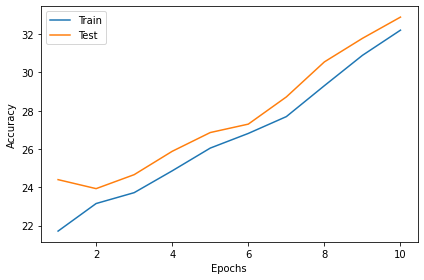

In [ ]:
fig, ax1 = plt.subplots()
labels = ['Train', 'Test']
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
rounds = np.arange(1, epochs + 1)
ax1.plot(rounds, acc_tr)
ax1.plot(rounds, acc_tst)
ax1.tick_params(axis='y')
ax1.legend(labels, loc='best')
fig.tight_layout()
plt.show()

### Visualizing the hidden layer's weight matrix changing across epochs
We will only visualize the heat map of the top 10x10 part of the matrix because it makes it easier to see the changes.  In the animation, each second correpsonds to one epoch.

In [ ]:
ims = []
fig = plt.figure(figsize=(4, 4))
for i in range(len(w1_tr)):
    im = plt.imshow(w1_tr[i][:10,:10], cmap='hot', interpolation='nearest', animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig=fig, artists=ims, interval=1000, repeat=True)
plt.close()

HTML(ani.to_html5_video())

## References

Nakkiran, P., Kaplun, G., Bansal, Y., Yang, T., Barak, B., & Sutskever, I. (2019). Deep double descent: Where bigger models and more data hurt. arXiv preprint arXiv:1912.02292.

Chizat, L., & Bach, F. (2019, February). A note on lazy training in supervised differentiable programming. In 32nd Conf. Neural Information Processing Systems (NeurIPS 2018).

# Lecture 8: Kernel Methods and Neural Tangent Kernels (NKT)

## Exercise on the effects of increasing a NN's width

The following example demonstrates empirically that a neural network with a large width (*m*) tends to not change its initial weights - i.e. increasing *m* towards infinity empirically converges to the kernel value (*$K_m$*).

The experiment below applies a simple network with 2 hidden layers followed by ReLU activations for predicting a cubic function, using Stochastic Gradient Descent (*SGD*) as optimizer and a Mean Squared Error loss function (*MSELoss*). The same network architecture is iteratively initialized with increasing widths (*m*), keeping the same learning ratios and number of training epochs across iterations. We can then observe the trends in training loss and changes in weights as *m* increases - notably the clear flattening of the weights across time for large *m*. 

Imports and function definitions:

In [ ]:
import torch
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# function for flattening a weight tensor - for cleaner code
def flat_weight(net, layer=0):
    return net[layer].weight.data.numpy().flatten().copy()

Create test variables:
- *x* is a random variable
- *y* is a function of *x* (cubic function in this example) + random noise

Run the experiment:

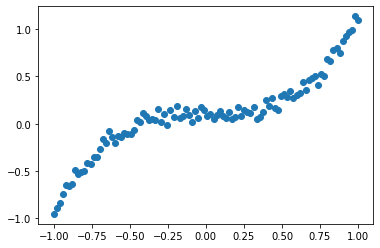

In [ ]:
x = torch.unsqueeze(torch.linspace(-1, 1, 100), dim=1)
y = x.pow(3) + 0.2*torch.rand(x.size())

plt.scatter(x,y)
plt.show()

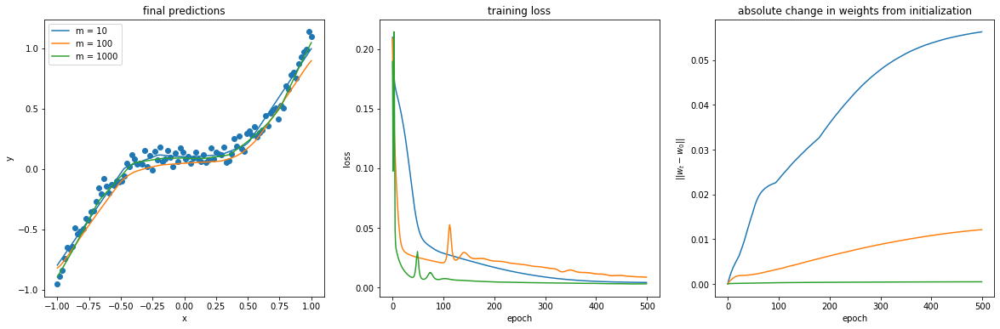

In [ ]:
# plot initial settings
f, (ax0, ax1, ax2) = plt.subplots(1,3)
f.set_figheight(6)
f.set_figwidth(20)

ax0.scatter(x,y)

# iterate over different widths for initializing and training the network
for m in [10,100,1000]:
    # our network
    net = torch.nn.Sequential(
            nn.Linear(1, m),
            nn.ReLU(),
            nn.Linear(m, m),
            nn.ReLU(),
            nn.Linear(m, m),
            nn.ReLU(),
            nn.Linear(m, 1)
        )
    
    # weights at initialization
    l1w0 = flat_weight(net, 0)
    
    # define optimizer and loss function
    optimizer = torch.optim.SGD(net.parameters(), lr=0.1)
    loss_func = nn.MSELoss()

    # empty lists to store loss + weight change information
    loss_change = []
    w_change = []
    
    # train the network and store its loss + weight change values for every iteration
    for t in range(500):    
        prediction = net(x)
        loss = loss_func(prediction, y)
        print(f"m = {m}, epoch {t+1}, loss: {loss.item()}", end='\r')

        loss_change.append(loss.item())
        w_change.append( np.mean(np.abs(flat_weight(net,0) - l1w0)) )
        
        # clear, compute and apply gradients between iterations
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    ax0.plot(x,prediction.data, label=f"m = {m}")
    ax1.plot(loss_change)
    ax2.plot(w_change)
    
ax0.set_xlabel("x")
ax0.set_ylabel("y")
ax0.set_title("final predictions")

ax1.set_xlabel("epoch")    
ax1.set_ylabel("loss")    
ax1.set_title("training loss")

ax2.set_xlabel("epoch")
ax2.set_ylabel("$||w_t - w_0||$")    
ax2.set_title("absolute change in weights from initialization")

ax0.legend()    
plt.show()

# Lecture 9: Adversarial Robustness

In [ ]:
! git clone https://github.com/tkabir1/CMSC828W
! unzip CMSC828W/data.zip

epsilons - List of epsilon values to use for the run. It is important to keep $0$ in the list because it represents the model performance on the original test set. Also, intuitively we would expect the larger the epsilon, the more noticeable the perturbations but the more effective the attack in terms of degrading model accuracy. Since the data range here is $[0,1]$, no epsilon value should exceed $1$. \\
pretrained_model - path to the pretrained MNIST model which was trained with pytorch/examples/mnist.

In [ ]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

# NOTE: This is a hack to get around "User-agent" limitations when downloading MNIST datasets
#       see, https://github.com/pytorch/vision/issues/3497 for more information
from six.moves import urllib
opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

In [ ]:
epsilons = [0, .05, .1, .15, .2, .25, .3]
pretrained_model = "data/lenet_mnist_model.pth"
use_cuda=True

The Net definition and test dataloader here have been copied from the MNIST example. The purpose of this section is to define the model and dataloader, then initialize the model and load the pretrained weights.

In [ ]:
# LeNet Model definition
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

# MNIST Test dataset and dataloader declaration
test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('/data', train=False, download=True, transform=transforms.Compose([
            transforms.ToTensor(),
            ])),
        batch_size=1, shuffle=True)

# Define what device we are using
print("CUDA Available: ",torch.cuda.is_available())
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")

# Initialize the network
model = Net().to(device)

# Load the pretrained model
model.load_state_dict(torch.load(pretrained_model, map_location='cpu'))

# Set the model in evaluation mode. In this case this is for the Dropout layers
model.eval()

Now, we can define the function that creates the adversarial examples by perturbing the original inputs. The fgsm_attack function takes three inputs, image is the original clean image $x$, epsilon is the pixel-wise perturbation amount $\epsilon$, and data_grad is gradient of the loss w.r.t the input image $(\nabla_xJ(\theta,x,y))$. The function then creates perturbed image as

$perturbed\_image=image+epsilon∗sign(data\_grad)=x+\epsilon∗sign(\nabla_xJ(\theta,x,y))$


Finally, in order to maintain the original range of the data, the perturbed image is clipped to range $[0,1]$.

In [ ]:
# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image
    

Finally, the central result of this tutorial comes from the test function. Each call to this test function performs a full test step on the MNIST test set and reports a final accuracy. However, we can notice that this function also takes an epsilon input. This is because the test function reports the accuracy of a model that is under attack from an adversary with strength $\epsilon$. More specifically, for each sample in the test set, the function computes the gradient of the loss w.r.t the $input\ data (data\_grad$), creates a perturbed image with $fgsm\_attack (perturbed\_data$), then checks to see if the perturbed example is adversarial. In addition to testing the accuracy of the model, the function also saves and returns some successful adversarial examples to be visualized later.

In [ ]:
def test( model, device, test_loader, epsilon ):

    # Accuracy counter
    correct = 0
    adv_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, dont bother attacking, just move on
        if init_pred.item() != target.item():
            continue

        # Calculate the loss
        loss = F.nll_loss(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect datagrad
        data_grad = data.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        if final_pred.item() == target.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

The last part of the implementation is to actually run the attack. Here, we run a full test step for each epsilon value in the epsilons input. For each epsilon we also save the final accuracy and some successful adversarial examples to be plotted in the coming sections. We can notice how the printed accuracies decrease as the epsilon value increases. Also, we can note the $\epsilon=0$ case represents the original test accuracy, with no attack.

In [ ]:
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model, device, test_loader, eps)
    accuracies.append(acc)
    examples.append(ex)

The first result is the accuracy versus epsilon plot. As alluded to earlier, as epsilon increases we expect the test accuracy to decrease. This is because larger epsilons mean we take a larger step in the direction that will maximize the loss. We can notice the trend in the curve is not linear even though the epsilon values are linearly spaced. For example, the accuracy at $\epsilon=0.05$ is only about $4\%$ lower than $\epsilon=0$, but the accuracy at $\epsilon=0.2$ is $25\%$ lower than $\epsilon=0.15$. Also, we can notice the accuracy of the model hits random accuracy for a $10$-class classifier between $\epsilon=0.25$ and $\epsilon=0.3$.

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(epsilons, accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, .35, step=0.05))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.show()

In this case, as epsilon increases the test accuracy decreases BUT the perturbations become more easily perceptible. In reality, there is a tradeoff between accuracy degredation and perceptibility that an attacker must consider. Here, we show some examples of successful adversarial examples at each epsilon value. Each row of the plot shows a different epsilon value. The first row is the $\epsilon=0$ examples which represent the original "clean" images with no perturbation. The title of each image shows the "original classification $\rightarrow$ adversarial classification." Notice, the perturbations start to become evident at $\epsilon=0.15$ and are quite evident at $\epsilon=0.3$. However, in all cases humans are still capable of identifying the correct class despite the added noise.

In [ ]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(epsilons)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(epsilons[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        plt.imshow(ex, cmap="gray")
plt.tight_layout()
plt.show()

Now that we have seen the most basic attack, we show an iterative version of it: Project Gradient Descent. We will see for the same budget epsilon, this more powerful attack can decrease the (adversarial) accuracy significantly more than that of FGSM.

In [ ]:
def pgd_attack(model, images, labels, eps=0.3, alpha=2/255, iters=40) :

    images = images.to(device)
    labels = labels.to(device)
    loss = nn.CrossEntropyLoss()
    
    if eps == 0:
        return images

    ori_images = images.data
        
    for i in range(iters) :    
        images.requires_grad = True
        outputs = model(images)

        model.zero_grad()
        cost = loss(outputs, labels).to(device)
        cost.backward()

        adv_images = images + alpha*images.grad.sign()
        eta = torch.clamp(adv_images - ori_images, min=-eps, max=eps)
        images = torch.clamp(ori_images + eta, min=0, max=1).detach_()
            
    return images

In [ ]:
import tqdm

accuracies2 = []

for eps in epsilons:
  total = 0
  correct = 0
  
  for data, labels in tqdm.notebook.tqdm(test_loader):
    data1 = pgd_attack(model, data, labels, eps=eps, iters=20, alpha=4/255)

    labels = labels.to(device)
    outputs1 = model(data1)
    
    _, pre = torch.max(outputs1.data, 1)

    total += (labels == labels).sum()
    correct += (pre == labels).sum()

  print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(eps, correct, total, correct/total))
  accuracies2.append(correct.item()/total.item())

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(epsilons, accuracies, "*-")
plt.plot(epsilons, accuracies2, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, .35, step=0.05))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.legend(["FGSM", "PGD"])
plt.show()

In [ ]:
!pip install torchattacks

In [ ]:
def imshow(img, title):
    npimg = img.numpy()
    fig = plt.figure(figsize = (5, 15))
    plt.imshow(np.transpose(npimg,(1,2,0)))
    plt.title(title)
    plt.show()
    
def image_folder_custom_label(root, transform, idx2label) :
    
    # custom_label
    # type : List
    # index -> label
    # ex) ['tench', 'goldfish', 'great_white_shark', 'tiger_shark']
    
    old_data = dsets.ImageFolder(root=root, transform=transform)
    old_classes = old_data.classes
    
    label2idx = {}
    
    for i, item in enumerate(idx2label) :
        label2idx[item] = i
    
    new_data = dsets.ImageFolder(root=root, transform=transform, 
                                 target_transform=lambda x : idx2label.index(old_classes[x]))
    new_data.classes = idx2label
    new_data.class_to_idx = label2idx

    return new_data


In [ ]:
import numpy as np
import json
import os
import sys
import time
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision.utils
from torchvision import models
import torchvision.datasets as dsets
import torchvision.transforms as transforms

import torchattacks


In [ ]:
print("PyTorch", torch.__version__)
print("Torchvision", torchvision.__version__)
print("Torchattacks", torchattacks.__version__)
print("Numpy", np.__version__)

Load Data

In [ ]:
class_idx = json.load(open("./data/imagenet_class_index.json"))
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]

In [ ]:
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(), # ToTensor : [0, 255] -> [0, 1]
    
# Using normalization for Inception v3.
# https://discuss.pytorch.org/t/how-to-preprocess-input-for-pre-trained-networks/683
#     transforms.Normalize(mean=[0.485, 0.456, 0.406],                     
#                          std=[0.229, 0.224, 0.225])
    
# However, DO NOT USE normalization transforms here.
# Torchattacks only supports images with a range between 0 and 1.
# Thus, please refer to the model construction section.
    
])

In [ ]:
imagnet_data = image_folder_custom_label(root='./data/imagenet', transform=transform, idx2label=idx2label)
data_loader = torch.utils.data.DataLoader(imagnet_data, batch_size=1, shuffle=False)

All images should be scaled to $[0, 1]$ with transform [to.Tensor()] before used in attacks. To make it easy to use adversarial attacks, a reverse-normalization is not included in the attack process. To apply an input normalization, we add a normalization layer to the model. \\
All models should return ONLY ONE vector of $(N, C)$ where $C = number\ of\ classes$. Most models in torchvision.models return one vector of $(N,C)$, where $N$ is the number of inputs and $C$ is the number of classes.

In [ ]:
images, labels = iter(data_loader).next()

print("True Image & True Label")
imshow(torchvision.utils.make_grid(images, normalize=True), [imagnet_data.classes[i] for i in labels])

Load Inception v3

In [ ]:

class Normalize(nn.Module) :
    def __init__(self, mean, std) :
        super(Normalize, self).__init__()
        self.register_buffer('mean', torch.Tensor(mean))
        self.register_buffer('std', torch.Tensor(std))
        
    def forward(self, input):
        # Broadcasting
        mean = self.mean.reshape(1, 3, 1, 1)
        std = self.std.reshape(1, 3, 1, 1)
        return (input - mean) / std

In [ ]:
use_cuda = True
device = torch.device("cuda" if use_cuda else "cpu")

In [ ]:
# Adding a normalization layer for Resnet18.
# We can't use torch.transforms because it supports only non-batch images.
norm_layer = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

model = nn.Sequential(
    norm_layer,
    models.resnet18(pretrained=True)
).to(device)

model = model.eval()

Adversarial Attack

In [ ]:
from torchattacks import *

Using torchattacks to make adversarial examples with the ImageNet dataset to fool ResNet-18.

In [ ]:
atks = [
    FGSM(model, eps=8/255),
    BIM(model, eps=8/255, alpha=2/255, steps=100),
    RFGSM(model, eps=8/255, alpha=2/255, steps=100),
    CW(model, c=1, lr=0.01, steps=100, kappa=0),
    PGD(model, eps=8/255, alpha=2/225, steps=100, random_start=True),
    PGDL2(model, eps=1, alpha=0.2, steps=100),
    EOTPGD(model, eps=8/255, alpha=2/255, steps=100, eot_iter=2),
    FFGSM(model, eps=8/255, alpha=10/255),
    TPGD(model, eps=8/255, alpha=2/255, steps=100),
    MIFGSM(model, eps=8/255, alpha=2/255, steps=100, decay=0.1),
    VANILA(model),
    GN(model, sigma=0.1),
    APGD(model, eps=8/255, steps=100, eot_iter=1, n_restarts=1, loss='ce'),
    APGD(model, eps=8/255, steps=100, eot_iter=1, n_restarts=1, loss='dlr'),
    APGDT(model, eps=8/255, steps=100, eot_iter=1, n_restarts=1),
    FAB(model, eps=8/255, steps=100, n_classes=10, n_restarts=1, targeted=False),
    FAB(model, eps=8/255, steps=100, n_classes=10, n_restarts=1, targeted=True),
    Square(model, eps=8/255, n_queries=5000, n_restarts=1, loss='ce'),
    AutoAttack(model, eps=8/255, n_classes=10, version='standard'),
    OnePixel(model, pixels=5, inf_batch=50),
    DeepFool(model, steps=100),
    DIFGSM(model, eps=8/255, alpha=2/255, steps=100, diversity_prob=0.5, resize_rate=0.9)
]

In [ ]:
print("Adversarial Image & Predicted Label")

for atk in atks :
    
    print("-"*70)
    print(atk)
    
    correct = 0
    total = 0
    
    for images, labels in data_loader:
        
        start = time.time()
        adv_images = atk(images, labels)
        labels = labels.to(device)
        outputs = model(adv_images)

        _, pre = torch.max(outputs.data, 1)

        total += 1
        correct += (pre == labels).sum()

        imshow(torchvision.utils.make_grid(adv_images.cpu().data, normalize=True), [imagnet_data.classes[i] for i in pre])

    print('Total elapsed time (sec): %.2f' % (time.time() - start))
    print('Robust accuracy: %.2f %%' % (100 * float(correct) / total))

Finally, instead of the classical Lp attacks, we show code for patch attacks, in which an adversary can add a patch on the image to cause a label change. This is more "practical," since we can for example buy one of these patches on Amazon and place it on a stop sign. "Don't do it though" - Soheil Feizi, 2020.

In [ ]:
import random
import numpy as np

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torch.nn.functional as F
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
from torch.utils.data.sampler import SubsetRandomSampler

In [ ]:
def init_patch_square(image_size, patch_size):
    # get mask
    image_size = image_size**2
    noise_size = image_size*patch_size
    noise_dim = int(noise_size**(0.5))
    patch = np.random.rand(1,3,noise_dim,noise_dim)
    return patch, patch.shape

def square_transform(patch, data_shape, patch_shape, image_size):
    # get dummy image 
    x = np.zeros(data_shape)
    
    # get shape
    m_size = patch_shape[-1]
    
    for i in range(x.shape[0]):

        # random rotation
        rot = np.random.choice(4)
        for j in range(patch[i].shape[0]):
            patch[i][j] = np.rot90(patch[i][j], rot)
        
        # random location
        random_x = np.random.choice(image_size)
        if random_x + m_size > x.shape[-1]:
            while random_x + m_size > x.shape[-1]:
                random_x = np.random.choice(image_size)
        random_y = np.random.choice(image_size)
        if random_y + m_size > x.shape[-1]:
            while random_y + m_size > x.shape[-1]:
                random_y = np.random.choice(image_size)
       
        # apply patch to dummy image  
        x[i][0][random_x:random_x+patch_shape[-1], random_y:random_y+patch_shape[-1]] = patch[i][0]
        x[i][1][random_x:random_x+patch_shape[-1], random_y:random_y+patch_shape[-1]] = patch[i][1]
        x[i][2][random_x:random_x+patch_shape[-1], random_y:random_y+patch_shape[-1]] = patch[i][2]
    
    mask = np.copy(x)
    mask[mask != 0] = 1.0
    
    return x, mask

def attack(x, patch, mask):
    model.eval()

    x_out = F.softmax(model(x))
    target_prob = x_out.data[0][target]

    adv_x = torch.mul((1-mask),x) + torch.mul(mask,patch)
    
    count = 0 
   
    while conf_target > target_prob:
        count += 1
        adv_x = Variable(adv_x.data, requires_grad=True)
        adv_out = F.log_softmax(model(adv_x))
       
        adv_out_probs, adv_out_labels = adv_out.max(1)
        
        Loss = -adv_out[0][target]
        Loss.backward()
     
        adv_grad = adv_x.grad.clone()
        
        adv_x.grad.data.zero_()
       
        patch -= adv_grad 
        
        adv_x = torch.mul((1-mask),x) + torch.mul(mask,patch)
        adv_x = torch.clamp(adv_x, min_out, max_out)
 
        out = F.softmax(model(adv_x))
        target_prob = out.data[0][target]
        #y_argmax_prob = out.data.max(1)[0][0]
        
        #print(count, conf_target, target_prob, y_argmax_prob)  

        if count >= 1000:
            break


    return adv_x, mask, patch 


In [ ]:
patch_size = 0.05
image_size = 299
target = 859 #toaster
conf_target = 0.9

min_in, max_in = 0, 1
min_in, max_in = np.array([min_in, min_in, min_in]), np.array([max_in, max_in, max_in])
mean, std = np.array([0.5, 0.5, 0.5]), np.array([0.5, 0.5, 0.5]) 
min_out, max_out = np.min((min_in-mean)/std), np.max((max_in-mean)/std)

patch, patch_shape = init_patch_square(image_size, patch_size)


for data, labels in data_loader:
    data = data.to(device)
    labels = labels.to(device)

    prediction = model(data)

    if prediction.data.max(1)[1][0] != labels.data[0]:
        continue

    data_shape = data.data.cpu().numpy().shape

    patch, mask = square_transform(patch, data_shape, patch_shape, image_size)

    patch, mask = torch.FloatTensor(patch), torch.FloatTensor(mask)
    patch, mask = patch.cuda(), mask.cuda()
    patch, mask = Variable(patch), Variable(mask)

    adv_x, mask, patch = attack(data, patch, mask)

    adv_x = torch.mul((1-mask),data) + torch.mul(mask,patch)
    adv_x = torch.clamp(adv_x, min_out, max_out)
    
    adv_label = model(adv_x).data.max(1)[1][0]
    ori_label = labels.data[0]
    
    imshow(torchvision.utils.make_grid(images, normalize=True), [imagnet_data.classes[ori_label.cpu().item()]])
    imshow(torchvision.utils.make_grid(adv_x.cpu(), normalize=True), [imagnet_data.classes[adv_label.cpu().item()]])

    if adv_label == target:
        print("Success")

References: \\
[1] https://pytorch.org/tutorials/beginner/fgsm_tutorial.html \\
[2] https://github.com/Harry24k/adversarial-attacks-pytorch \\
[3] https://github.com/Harry24k/PGD-pytorch \\
[4] https://github.com/jhayes14/adversarial-patch

# Lecture 10: DL Robustness Part 2 

##10.1 Gradient Masking

This subsection looks at a ipython notebook example taken from the github repo for the **Obfuscated Gradients** paper (*Athalye et al. (2018)*) discussed in class, with some added explainations ([paper](https://arxiv.org/abs/1802.00420), [code](https://github.com/anishathalye/obfuscated-gradients)).

This example demonstrates how a stochastic gradient based adversarial defence can be defeated!

[*Xie et al. (2018)*](https://arxiv.org/abs/1711.01991) propose to defend against adversarial examples by adding a randomization layer before the input to the classifier.

*Athalye et al.* observe that this ensemble attack overfits to the ensemble with fixed randomization. They bypass this defense by applying (a method known as) [Expectation over Transformation](https://arxiv.org/abs/1707.07397) (EOT), optimizing over the (in this case, discrete) distribution of transformations. The scribe notes also contain some discussion on EOT.


###Setup

In [ ]:
! git clone https://github.com/anishathalye/obfuscated-gradients.git


In [ ]:
cd obfuscated-gradients/randomization

In [ ]:
! sh setup.sh

In [ ]:
%tensorflow_version 1.x

In [ ]:
import tensorflow as tf
import numpy as np
import inceptionv3
from utils import *
from defense import *

In [ ]:
sess = tf.Session()

### Input and Target

Defining Image and Target Class (Targetted Attack). You can test with a custom image or target class

In [ ]:
orig = load_image('cat.jpg')
TARGET = 924 # guacamole
EPSILON = 8.0/255.0

In [ ]:
lower = np.clip(orig-EPSILON, 0, 1)
upper = np.clip(orig+EPSILON, 0, 1)

### Classifier

As introduced by, [*Xie et al. (2018)*](https://arxiv.org/abs/1711.01991)

Defends against adversarial attacks by using a randomization layer before the input to the classifier.

In [ ]:
x = tf.placeholder(tf.float32, (299, 299, 3))
x_expanded = tf.expand_dims(x, axis=0)
logits, preds = inceptionv3.model(sess, x_expanded)

In [ ]:
probs = tf.nn.softmax(logits)
classify = make_classify(sess, x, probs)

In [ ]:
classify(orig, target_class=TARGET)

### Failed attack

Demonstrating that a standard PGD based attack fails for this model (It sometimes narrowly succeeds but fails to achieve the target prediction)

*PGD update Equation (Refresher):*

$ \; x^{t+1} = \prod_{x+S}(x^{t} + \eta \;  \max_{\|\delta\|_\infty \leq \epsilon}(\nabla L(f_{\theta}(x),y),\delta))$

$\equiv x^{t+1} = \prod_{x+S}(x^{t} - \eta \;  g^{(t)})$

$\equiv x^{t+1} = \prod_{x+S}(x^{t+1'})$

*for distance defined by $L_{\infty}$, projecting with budget $\epsilon$,*

$x^{t+1} = \text{clip}(x^{t+1'}, \; x_0 - \epsilon, \; x_0 + \epsilon)$


In [ ]:
loss = tf.nn.softmax_cross_entropy_with_logits_v2(logits=logits, labels=one_hot(TARGET, 1000))
grad, = tf.gradients(loss, x)

In [ ]:
# PGD

LR = 0.1

adv = np.copy(orig)
for i in range(10):
    g, p = sess.run([grad, preds], {x: adv})
    print('step %d, pred=%d' % (i, p))
    # step
    adv -= LR * g
    # project
    adv = np.clip(adv, lower, upper)

In [ ]:
cropped_x = defend(x_expanded)
cropped_logits, cropped_preds = inceptionv3.model(sess, cropped_x)

In [ ]:
cropped_probs = tf.nn.softmax(cropped_logits)
cropped_classify = make_classify(sess, x, cropped_probs)

In [ ]:
cropped_classify(adv, target_class=TARGET)

### Adaptive Attack

Using [Expectation over Transformation](https://arxiv.org/abs/1707.07397) (EOT).

 In EOT, we assume randomness of the transformation and take the expectation,
    
\begin{gather*}
\mathop{\mathbb{E}}_{t \sim T} [ f(t(x))]
\end{gather*}
    
Therefore the gradient will be,
    
\begin{gather*}
\triangledown \mathop{\mathbb{E}}_{t \sim T} [ f(t(x))]
\end{gather*}
    
since gradient is a linear operator,
    
\begin{gather*}
= \mathop{\mathbb{E}}_{t \sim T} [\triangledown f(t(x))]
\end{gather*}
    
The key idea is to compute gradients of many realizations and get the average.

In [ ]:
ENSEMBLE_SIZE = 30 # larger sample size -> better gradient estimate

In [ ]:
ensemble_xs = tf.concat([defend(x_expanded) for _ in range(ENSEMBLE_SIZE)], axis=0)
ensemble_logits, ensemble_preds = inceptionv3.model(sess, ensemble_xs)

In [ ]:
ensemble_labels = tf.tile(tf.expand_dims(tf.one_hot(TARGET, 1000), axis=0), (ensemble_logits.shape[0], 1))
ensemble_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=ensemble_logits, labels=ensemble_labels))
ensemble_grad, = tf.gradients(ensemble_loss, x)

In [ ]:
# PGD

LR = 0.1

adv = np.copy(orig)
for i in range(50):
    g, p = sess.run([ensemble_grad, ensemble_preds], {x: adv})
    if i % 10 == 0:
        print('step %d, preds=%s' % (i, p))
    # step
    adv -= LR * g
    # project
    adv = np.clip(adv, lower, upper)

In [ ]:
plt.imshow(adv)

In [ ]:
cropped_classify(adv, target_class=TARGET)

Please look at the original [repo](https://github.com/anishathalye/obfuscated-gradients) for more examples of attacks that are successful against other obfuscated gradient based defences. 

##10.2 Are adversarial examples inevitable? [1]

The following examples help visualize the geodesic epsilon expasion of a set on the the surface of a unit sphere in 3D. Later, we explore the code for high dimensions.

First, a simple function to compute the geodesic distance and comparing it with the L-2 norm (a simple sanity check).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import math

def geodesic(a, b, r):
  d = r * np.arccos(np.dot(a, b)/(r**2))
  return d

fig = plt.figure()

numPoints = 2000
points = np.random.uniform(low=-1.0, high=1.0, size=[numPoints, 3])

# Normalization 
for i in range(numPoints):
  points[i,:] = points[i,:] / np.linalg.norm(points[i,:])

# dist_geo = geodesic(points[0,:], points[1,:], 1)

# The Euclidean vs Geodesic distance of points from a point (Sanity Check: Geodesic distance >= Euclidean distance)
pt = points[0,:]
d_2 = np.zeros(numPoints)
d_geo = np.zeros(numPoints)
for i in range(1, numPoints):
  d_2[i] = np.linalg.norm(pt - points[i, :])
  d_geo[i] = geodesic(pt, points[i, :], 1)

plt.scatter(d_2, d_geo, marker='x', color='g')
plt.axis([0, 2.5, 0, 3.25])
plt.xlabel("Distance based on L-2 Norm")
plt.ylabel("Distance based on geodesic formula")
plt.show()

The following example to visualize the geodesic epsilon expansion of a set on a 3D unit sphere. Feel free to change the number of points (set to 2000) in the example above for a continuous plot.

In [ ]:
# Epsilon Expansion of a set on a unit 3-D sphere
# import scipy.spatial as sp 
import sys 

epsilon = 0.4
A = points[(points[:,0]>-0.5) & (points[:,1]<-0.5) & (points[:,2]>0.3)]
print('Number of points in set A = ', A.shape[0])

A_eps = A.tolist()

for i in range(len(A)):
  for j in range(numPoints):
    # if A_eps == []:
    #     A_eps.append(points[j,:])

    # elif (geodesic(A[i,:], points[j,:], 1) <= epsilon):
    #   if not np.any(A_eps == points[j, :]):
    #     A_eps.append(points[j,:])
    if (geodesic(A[i,:], points[j,:], 1) <= epsilon):
      if not np.any(A_eps == points[j,:]):
        
        A_eps.append(points[j,:])

A_eps = np.array(A_eps)
print('Number of points in the geodesic epsilon expansion of set A = ',A_eps.shape[0])


fig3 = plt.figure()
ax = plt.axes(projection='3d')
ax.set_title('Set A (red points).')
ax.scatter3D(points[:,0], points[:,1], points[:,2]);
ax.scatter3D(A[:,0], A[:,1], A[:,2], color='r');

fig4 = plt.figure()
ax = plt.axes(projection='3d')
# ax.set(xlim=(-1, 1), ylim=(-2, 2))
ax.scatter3D(points[:,0], points[:,1], points[:,2]);
ax.set_title('The geodesic epsilon expansion of A (green points)')
ax.scatter3D(A_eps[:,0], A_eps[:,1], A_eps[:,2], color='g');


In the following example, we observe the isoperimetric inequality (Lemma 1 in Lecture 9) [2,3] in 3D observed for a subset A and Half-sphere H. The sizes of the sets are measured by the number of points in them. 

In [ ]:
# Isoperimetric Inequality for 3D can be empirically observed for a subset A and Half-sphere H in 3-D

def epsilonExpansion(A, epsilon, numPoints):
  A_eps = A.tolist()

  for i in range(len(A)):
    for j in range(numPoints):
      if (geodesic(A[i,:], points[j,:], 1) <= epsilon):
        # print(not np.any(A == points[j, :]))
        if not np.any(A_eps == points[j, :]):
          A_eps.append(points[j,:])
         
  
  A_eps = np.array(A_eps)
  return A_eps


epsilon = 0.4
A = points[(points[:,0]>0) | (points[:,1] > 0)]
print('Number of points in set A = ', A.shape[0])

# Half sphere
H = points[(points[:,0]>0)]
print('Number of points in the half-sphere H = ', H.shape[0]) # Will have approximately numPoints/2 number of points

A_eps = epsilonExpansion(A, epsilon, numPoints)
print('Number of points in the epsilon expansion of A', A_eps.shape[0])


H_eps = epsilonExpansion(H, epsilon, numPoints)
print('Number of points in the epsilon expansion of the half-sphere H', H_eps.shape[0])

The following example highlights that the normalized measure of the geodesic epsilon expansion of a half-sphere has a lower bound given by Lemma 2 in Lecture 9.

In high dimensions, the lower bound converges to 1 and the normalized measure (0 <= mu_1 <= 1) of the epsilon expansion of a set A must therefore converge to 1. The example uses a dimension of 100 and epsilon of 1.5 and we observe that mu_1[A(epsilon, d_g)] converges to 1. This implies that the entire surface of the sphere is covered by set A.

Note: Due to high dimensionality, the number of points were restricted to 2000, and epsilon was given a "higher" value in this example to restrict execution time.

In [ ]:
# Lemma 2 as dimensionality -> infty
import numpy as np
import math

epsilon = 1.50

dim = 100
numPoints = 2000
counter = 0
points = np.random.uniform(low=-1.0, high=1.0, size=[numPoints, dim])

val = 1 - math.sqrt(math.pi/8) * math.exp(-(dim-1)/2 * epsilon**2)
print('The lower limit for Mu_1[A(epsilon, d_g)] = ', val)

# Normalization 
for i in range(numPoints):
  points[i,:] = points[i,:] / np.linalg.norm(points[i,:])

A = points[(points[:,0] > 0)] # A half-sphere in n-dimensions
#print(len(A))

A_eps = A.tolist()

for i in range(len(A)):
  for j in range(numPoints):
    if (geodesic(A[i,:], points[j,:], 1) <= epsilon):
      if((len(A) + counter)/numPoints == 1):
        print('The whole n-dimensional sphere is covered by the geodesic epsilon expansion.')
        break
      if not np.any(A_eps == points[j,:]):
        A_eps.append(points[j,:])
        counter = counter + 1
        print('Mu_1[A(epsilon, d_g)] = ', (len(A) + counter)/numPoints)
        

A_eps = np.array(A_eps)
# print(A_eps.shape)

mu_1 = len(A_eps)/numPoints
val = 1 - math.sqrt(math.pi/8) * math.exp(-(dim-1)/2 * epsilon**2)

## References
References: \\
[1] https://github.com/anishathalye/obfuscated-gradients

[2] https://github.com/cihangxie/NIPS2017_adv_challenge_defense

[3] Shafahi, A., Ronny Huang, W., Studer, C., Feizi, S., and Goldstein, T., “Are adversarial examples inevitable?”, *arXiv e-prints*, 2018.

[4] Paul L´evy and Franco Pellegrino. Probl´emes concrets d’analyse fonctionnelle. Gauthier-Villars, Paris, 1951.

[5] Michel Talagrand. Concentration of measure and isoperimetric inequalities in product spaces. Publications
Math´ematiques de l’Institut des Hautes Etudes Scientifiques, 81(1):73–205, 1995.

# Lecture 11: DL Robustness Part 3 

### 11.1 Randomized Smoothing

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import math
from statsmodels.stats.proportion import proportion_confint  #finds confidence based on Two-sided hypothesis test
from scipy.stats import norm        #used to compute inverse Normal CDF after Gaussian smoothing

plt.rcParams["font.size"] = 17

In [ ]:
# Create Dataset
x_min, y_min = -2,-2
x_max, y_max =  2, 2
sample_freq = 200    #density of points within domain

#generate 2D points with uniform gradation
X = torch.linspace(x_min, x_max, sample_freq).cuda()
Y = torch.linspace(y_min, y_max, sample_freq).cuda()  

In [ ]:
def base_classifier(x,y,freq=3):
    #assume logits of the binary base-classfier is given by a sinusoid
    logit = y - torch.sin(2*math.pi*freq*x)  

    prediction_score = torch.nn.Sigmoid()(logit)   #compute score using Sigmoid function
    label = (prediction_score >= 0.5)              #threshold about 0.5 to predict binary label of 0/1
    return label

In [ ]:
#find base classfier predictions on data
predictions = torch.tensor([base_classifier(x,y) for x in X for y in Y]).cuda()   
prediction_matrix = predictions.reshape(sample_freq,sample_freq).transpose(1,0)

#visualise decision boundaries induced by base classifier
plt.pcolor(Y.cpu().numpy(),X.cpu().numpy(),prediction_matrix.cpu().numpy())     
plt.title("Decision Boundary of Base Classifier")
plt.text(-0.35,1.5,"Class 1")
plt.text(-0.35,-1.5,"Class 0",color="w")
plt.show()

In [ ]:
#define smoothened classifier using Gaussian random noise
def smooth_classifier(x,y,sigma,num_samples = 5000):
    
    #sample IID Gaussian Noise, and run on GPU to parallelize operations
    x_new = x + sigma * torch.randn(num_samples).cuda()   
    y_new = y + sigma * torch.randn(num_samples).cuda()

    #find average of predictions over different samplings of random noise
    pred_smooth = base_classifier(x_new,y_new)
    pred_label = pred_smooth.float().mean() > 0.5   #find majority label for mean-prediction by thresholding about 0.5
    
    pred_count = (pred_smooth == pred_label).sum()  #count how many samples had same prediction as "pred_label"

    #(1 - alpha) lower confidence bound on bernoulli proportion in two-sided hypothesis test using Clopper-Pearson method
    confidence = proportion_confint( pred_count.cpu(), num_samples,alpha=2*(0.001), method="beta")[0]    #set alpha=0.001

    if confidence < 0.5:
        cert_radius = 0.0   #do not certify if prediction confidence for label is low
    else:
        cert_radius = sigma * norm.ppf(confidence) #use Gaussian inverse CDF to compute certification radius
    
    return pred_label,cert_radius  

In [ ]:
#iterate through data to find predictions and certified radii of smoothed classifier
smooth_output = torch.tensor([smooth_classifier(x,y,sigma=0.1) for x in X for y in Y]).cpu().numpy() 

#extract smooth predictions and certified radii
smooth_pred,cert_radii = smooth_output[range(sample_freq**2),0], np.nan_to_num(smooth_output[range(sample_freq**2),1])

In [ ]:
#visualise smoothed classifier predictions with new decision boundary
smooth_pred_matrix = smooth_pred.reshape(sample_freq,sample_freq)           
plt.pcolor(Y.cpu().numpy(),X.cpu().numpy(),np.transpose(smooth_pred_matrix))
plt.title(r"Smooth Classifier for $\sigma$=0.1")
plt.show()

In [ ]:
#visualise certified radius for data by encoding with colour assigned at each point

radius_matrix = cert_radii.reshape(sample_freq,sample_freq)
img = plt.contourf(Y.cpu().numpy(),X.cpu().numpy(),np.transpose(radius_matrix),1000)
plt.colorbar(img)
plt.title(r"Certified Radii for $\sigma$=0.1")
plt.show()

In [ ]:
#Generate smoothed classifiers using Gaussian noise with different standard deviations
Sigma_list = [0.05,0.1,0.25]  

Pred_array, Radii_array = [], []   

for sigma in Sigma_list:
    smooth_output = torch.tensor([smooth_classifier(x,y,sigma) for x in X for y in Y])
    smooth_pred,cert_radii = smooth_output[range(sample_freq**2),0], np.nan_to_num(smooth_output[range(sample_freq**2),1])
    
    smooth_pred_matrix = smooth_pred.reshape(sample_freq,sample_freq).cpu().numpy()
    Pred_array.append(smooth_pred_matrix)       #collect predictions
    radius_matrix = cert_radii.reshape(sample_freq,sample_freq)
    Radii_array.append(radius_matrix)           #collect certification radii

In [ ]:
fig,ax = plt.subplots(1,3, figsize=(20,5))

#visualise new decision boundaries
for i,sigma in enumerate(Sigma_list):
    ax[i].pcolor(Y.cpu().numpy(),X.cpu().numpy(),np.transpose(Pred_array[i]))  
    ax[i].set_title(r"Smooth Classifier for $\sigma$="+str(sigma))

plt.show()

In [ ]:
fig,ax = plt.subplots(1,3, figsize=(20,7))

#visualise certified radii
for i,sigma in enumerate(Sigma_list):
    contour = ax[i].contourf(Y.cpu().numpy(),X.cpu().numpy(),np.transpose(Radii_array[i]),1000)  #Generate color plot with 1000 gradations of radii
    ax[i].set_title(r"Certified Radii for $\sigma$="+str(sigma))
    
    ticks = np.linspace(Radii_array[i].min(), Radii_array[i].max(), 6, endpoint=True)   #find good limits for color legend for each case separately
    color_bar = fig.colorbar(contour,ax=[ax[i]],location='bottom',ticks=ticks)          #harder to visualise with one common color-scale 
    color_bar.ax.set_xticklabels(["{:.2f}".format(i) for i in ticks])

plt.show()

### 11.2 Perceptual Adversarial Attack





#### Setup

In [ ]:
!git clone https://github.com/cassidylaidlaw/perceptual-advex.git
# Code from https://github.com/cassidylaidlaw/perceptual-advex/

In [ ]:
cd perceptual-advex/

In [ ]:
!pip install -r requirements.txt

In [ ]:
!mkdir -p data/checkpoints
!curl -o data/checkpoints/cifar_pgd_l2_1.pt https://perceptual-advex.s3.us-east-2.amazonaws.com/cifar_pgd_l2_1_cpu.pt

#### Dataset and model

In [ ]:
import perceptual_advex
from perceptual_advex.utilities import get_dataset_model

In [ ]:
dataset, model = get_dataset_model(
    dataset='cifar',
    arch='resnet50',
    checkpoint_fname='data/checkpoints/cifar_pgd_l2_1.pt',
)

In [ ]:
import torchvision
import numpy as np
import matplotlib.pyplot as plt

# We'll use this helper function to show images in the Jupyter notebook.
%matplotlib inline
def show(img, title=''):
    if len(img.size()) == 4:
        img = torchvision.utils.make_grid(img, nrow=10, padding=0)
    npimg = img.detach().cpu().numpy()
    plt.figure(figsize=(18,16), dpi=80, facecolor='w', edgecolor='k')
    plt.title(title)
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

In [ ]:
import torch
from perceptual_advex.distances import LPIPSDistance, L2Distance, LinfDistance
from perceptual_advex.perceptual_attacks import get_lpips_model

# LPIPS is based on the activations of a classifier, so we need to first
# load the classifier we'll use.
lpips_model = get_lpips_model('alexnet_cifar')
if torch.cuda.is_available():
    lpips_model.cuda()

# Now we can define a distance based on the model we loaded.
# We could also do LPIPSDistance(model) for self-bounded LPIPS.
lpips_distance = LPIPSDistance(lpips_model)
l2_distance, linf_distance = L2Distance(), LinfDistance()

# Finally, let's calculate the distance between the inputs and adversarial examples.
# print(lpips_distance(inputs, adv_inputs))

In [ ]:
import torch

# Create a validation set loader.
batch_size = 5
_, val_loader = dataset.make_loaders(1, batch_size, only_val=True)

# Get a batch from the validation set.
inputs, labels = next(iter(val_loader))

# If we have a GPU, let's convert everything to CUDA so it's quicker.
if torch.cuda.is_available():
    inputs = inputs.cuda()
    labels = labels.cuda()
    model.cuda()

# Show the batch!
show(inputs)

#### Lagrange Perceptual Attack

In [ ]:
from perceptual_advex.perceptual_attacks import LagrangePerceptualAttack

bounds = [0.1*5**i for i in range(5)]

for bound in bounds:

    attack = LagrangePerceptualAttack(
        model,
        num_iterations=10,
        # The LPIPS distance bound on the adversarial examples.
        bound=bound,
        # The model to use for calculate LPIPS; here we use AlexNet.
        # You can also use 'self' to perform a self-bounded attack.
        lpips_model='alexnet_cifar',
    )

    adv_inputs = attack(inputs, labels)

    l2 = l2_distance(adv_inputs[0], inputs[0])
    linf = linf_distance(adv_inputs[0], inputs[0])
    lpips = lpips_distance(adv_inputs[0], inputs[0])

    adv_pred_labels = model(adv_inputs).argmax(1)

    title = "LPIPS distance bound: {}\n LPIPS: {}\n L2: {}\n L-inf: {}".format(bound,\
                                                lpips.cpu().detach().numpy().tolist(),\
                                                l2.cpu().numpy().tolist(), linf.cpu().numpy().tolist())

    # Show the adversarial examples.
    show(inputs, title)
    show(adv_inputs)

    # Show the magnified difference between the adversarial examples and unperturbed inputs.
    noise = (adv_inputs - inputs)
    noise = noise - noise.min()
    noise = noise/noise.max()
    show(noise)

# Lecture 12: DL Robustness Part 4: Poisoning 

## A toy example illustrating backdoor attacks

The task here is a binary classification, 
where class 0 corresponds to black background with small gaussian noise and
class 1 corresponds to white background with small gaussian noise.
The pixels are considered to be in range [-1, 1].

We will see with this task a toy example illustrating backdoor attacks

In [ ]:
#just setups and util functions
import torch
import torch.nn as nn
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F

torch.set_printoptions(sci_mode=False)

def gen_data(n, resolution, noise_scale):
    labels = torch.randint(0, 2, (n,))
    noise = noise_scale * torch.randn((n, 1, resolution[0], resolution[1]))
    imgs = (noise + 2 * labels.view(n, 1, 1, 1) - 1 ).clamp(-1, 1)
    
    return imgs, labels

plt.rcParams["savefig.bbox"] = 'tight'

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

def train(X_train, Y_train):
    n=X_train.size(0)
    d = X_train[0].view(-1).size(0)
    model = nn.Linear(d, 2)
    criterion = nn.CrossEntropyLoss()
    model.train()
    optimizer = torch.optim.SGD(model.parameters(), lr=10)
    
    for i in range(100):
        loss = criterion(model(X_train.view(n, -1)), Y_train)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    print ('Train_loss:', loss.item())
    
    model.eval()
    return model

Now let us build the training set and the test set!

In [ ]:
n = 100
n_test = 10
m = 16 # resolution: m*m
noise_scale = 0.1 #

torch.manual_seed(999999999+208) #for reproducibility
X_train, Y_train = gen_data(n, (m, m), noise_scale)
X_test, Y_test = gen_data(n_test, (m, m), noise_scale)

# visualization of some samples
grid=make_grid(X_train[0:4], padding=1, pad_value=0.5, nrow=2, value_range=(-1, 1), normalize=True)
show(grid)

print ('These are how normal samples look like!')

As a sanity check, let us see how a clean, linear classifier behaves on the generated training&test sets.

In [ ]:
# Let us first see how a clean model behaves!

print ('Let us first see how a clean model behaves!')
torch.manual_seed(999999999+208)
model_clean = train(X_train, Y_train)

grid=make_grid(X_test[0:10], padding=1, pad_value=0.5, nrow=10, value_range=(-1, 1), normalize=True)
show(grid)

print ('predictions:', model_clean(X_test.view(n_test, -1)).argmax(dim=1))

Now we backdoor some samples from the training set and create a backdoored version of the test set for evaluation.

The backdoor pattern/trigger is simply a gray box located in the left upper corner.

In [ ]:
#Now we introduce some backdoored samples to the training data!
n_backdoor = 10
X_backdoor = X_train.clone()
Y_backdoor  =Y_train.clone()
X_backdoor[:n_backdoor, 0, 1:4, 1:4] = 0
Y_backdoor[:n_backdoor] = 1 - Y_backdoor[:n_backdoor]


# visualization of some backdoored samples
grid=make_grid(X_backdoor[0:4], padding=1, pad_value=0.5, nrow=2, value_range=(-1, 1), normalize=True)
show(grid)

X_backdoor_test = X_test.clone()
Y_backdoor_test  =Y_test.clone()
X_backdoor_test[:, 0, 1:4, 1:4] = 0
Y_backdoor_test = 1 - Y_backdoor_test
print ('These are how backdoored samples are like!')

When the model is trained from the backdoored training set, its behavior on the test set may change subtlely!

As presented here, while the backdoored model still offers correct predictions to the clean test set, one a sample is backdoored, the prediction will be flipped, which can be exploited by attackers.

In [ ]:
# Let us now see how a backdoored model behaves!

print ('Let us now see how a backdoored model behaves!')
torch.manual_seed(999999999+208)
model_backdoor = train(X_backdoor, Y_backdoor)

grid=make_grid(X_test[0:10], padding=1, pad_value=0.5, nrow=10, value_range=(-1, 1), normalize=True)
show(grid)

print ('predictions on clean test set:', model_backdoor(X_test.view(n_test, -1)).argmax(dim=1))

grid=make_grid(X_backdoor_test[0:10], padding=1, pad_value=0.5, nrow=10, value_range=(-1, 1), normalize=True)
show(grid)

print ('predictions on backdoored test set:', model_backdoor(X_backdoor_test.view(n_test, -1)).argmax(dim=1))

## Deep Partition Aggregation

Here, we demonstrate DPA on a small hand-written images dataset with SVM as the classifier

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, svm, metrics
from sklearn.model_selection import train_test_split
import collections
import operator
import matplotlib.pyplot as plt

np.random.seed(0)


In [ ]:
def split_dataset(X_train, y_train, k):
    split_dataset = {}
    for i in range(k):
        split_dataset[i] = [[], []]
    for i in range(len(y_train)):
        x_sample = X_train[i]
        y_sample = y_train[i]
        partition_index = x_sample.sum() % k
        split_dataset[partition_index][0].append(x_sample)
        split_dataset[partition_index][1].append(y_sample)
    for i in range(k):
        split_dataset[i][0] = np.array(split_dataset[i][0])
        split_dataset[i][1] = np.array(split_dataset[i][1])
    return split_dataset


In [ ]:
def certify_delta(clf_list, input):
    predict_label_list = []
    for i in range(len(clf_list)):
        clf_i = clf_list[i]
        prediction = clf_i.predict(input.reshape(1, -1))[0]
        predict_label_list.append(prediction)
    frequency = collections.Counter(predict_label_list)
    values = list(frequency.values())
    values.sort(reverse=True)
    if len(values) == 1:
        return values[0] / 2
    return (values[0] - values[1]) / 2


In [ ]:
def ensemble_prediction(clf_list, X_train):
    prediction_list = []
    for input in X_train:
        predict_label_list = []
        for i in range(len(clf_list)):
            clf_i = clf_list[i]
            prediction = clf_i.predict(input.reshape(1, -1))[0]
            predict_label_list.append(prediction)
        frequency = collections.Counter(predict_label_list)
        prediction = max(frequency.items(), key=operator.itemgetter(1))[0]
        prediction_list.append(prediction)
    return np.array(prediction_list)


In [ ]:
def no_ensemble():
    digits = datasets.load_digits()

    _, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 3))
    for ax, image, label in zip(axes, digits.images, digits.target):
        ax.set_axis_off()
        ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
        ax.set_title('Training: %i' % label)
    # flatten the images
    n_samples = len(digits.images)
    data = digits.images.reshape((n_samples, -1))

    # Create a classifier: a support vector classifier
    clf = svm.SVC(gamma=0.001)

    # Split data into 50% train and 50% test subsets
    X_train, X_test, y_train, y_test = train_test_split(
        data, digits.target, test_size=0.5, shuffle=False)

    # Learn the digits on the train subset
    clf.fit(X_train, y_train)

    # Predict the value of the digit on the test subset
    predicted = clf.predict(X_test)
    _, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 3))
    for ax, image, prediction in zip(axes, X_test, predicted):
        ax.set_axis_off()
        image = image.reshape(8, 8)
        ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
        ax.set_title(f'Prediction: {prediction}')
    print(f"Classification report for classifier {clf}:\n"
          f"{metrics.classification_report(y_test, predicted)}\n")


Here is the main codes to compute the test acc and certificate for each image

In [ ]:
def main(partition_num):
    # partition_num = 30
    digits = datasets.load_digits()

    # flatten the images
    n_samples = len(digits.images)
    data = digits.images.reshape((n_samples, -1))
    # X, y = fetch_openml('mnist_784', version=1, return_X_y=True, as_frame=False)
    # X = X.reshape((X.shape[0], -1))

    # Split data into 50% train and 50% test subsets
    X_train, X_test, y_train, y_test = train_test_split(
        data, digits.target, test_size=0.3, shuffle=False)
    splitted_dataset = split_dataset(X_train, y_train, partition_num)
    # Learn the digits on the train subset

    clf_list = [svm.SVC(gamma=0.001) for _ in range(partition_num)]
    for i in range(partition_num):
        clf_i = clf_list[i]
        clf_i.fit(splitted_dataset[i][0], splitted_dataset[i][1])
    predicted = ensemble_prediction(clf_list, X_test)
    print(f"Classification report for ensembled classifier:\n"
          f"{metrics.classification_report(y_test, predicted)}\n")

    cert_list = []
    for i in range(len(y_test)):
        x_test_sample = X_test[i]
        certificate = certify_delta(clf_list, x_test_sample)
        cert_list.append(certificate)
        # print(f"for test sample {i} delta/2 = {certificate}")
    print(f"avg cert is {sum(cert_list) / len(cert_list)}")
    acc = (sum(y_test == predicted)/len(y_test))
    print(f"acc is {acc}\n###\n")
    return sum(cert_list) / len(cert_list), acc


Firstly, we show the accuracy for the single-model classifier

In [ ]:
no_ensemble()

Here we output two things with varied partition number:
- the accuray of the ensemble-model classifier
- the certifier for each image in the test set 

In [ ]:
partition_list = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
avg_cert_list = []
acc_list = []
for partition_num in partition_list:
    avg_cert, acc = main(partition_num)
    avg_cert_list.append(avg_cert)
    acc_list.append(acc)
print(f"average certificate list is {avg_cert_list} accuracy list is {acc}")


Next, we show the relationship between the average certificate and the partition number

In [ ]:
plt.plot(partition_list, avg_cert_list)
plt.xlabel("Partition Number")
plt.ylabel("Average Certificate")
plt.show()

Next, we show the tradeoff between the accuray and the partition number

In [ ]:
plt.plot(partition_list, acc_list)
plt.xlabel("Partition Number")
plt.ylabel("Test Accuracy")
plt.show()

# Lecture 13: VAE 

 

## Thought Experiment: mapping random vectors to images
This section of the notebook will illustrate the thought experiment that we went over in class. In class, we talked about training a NN to map random vectors to images of cats (see LATEX for more details). Here, I include an example of mapping 128 random vectors to 128 images of "9"s in the MNIST dataset. We will see that the the NN (here a convolutional decoder) can be trained to generate "9"s given a new vector unseen to the training data. 

In [ ]:
# Code for the decoder modified from a convolutional AE in 
# https://github.com/L1aoXingyu/pytorch-beginner/tree/master/08-AutoEncoder by Sherlock Liao

import numpy as np

import torch
import torchvision
from torch import nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.utils import save_image
from torchvision.datasets import MNIST
from IPython.display import Image
import os

if not os.path.exists('./dc_img'):
    os.mkdir('./dc_img')


def to_img(x):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    x = x.view(x.size(0), 1, 28, 28)
    return x


num_epochs = 100
batch_size = 128
learning_rate = 1e-3

img_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))
])


class autoencoder(nn.Module):
    def __init__(self):
        super(autoencoder, self).__init__()

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(8, 16, 3, stride=2),  # b, 16, 5, 5
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 5, stride=3, padding=1),  # b, 8, 15, 15
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 2, stride=2, padding=1),  # b, 1, 28, 28
            nn.Tanh()
        )

    def forward(self, x):
        # x = self.encoder(x)
        y = self.decoder(x)
        return y

Load Training Dataset


In [ ]:
trainset = datasets.MNIST(
    root="data",
    train=True,
    download=True,
    transform=ToTensor()
)
sample_size = 128

nines = [n for n in range(len(trainset)) if trainset[n][1]==9]
nines = nines[:sample_size]

dataset = torch.utils.data.Subset(trainset, nines)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Generate random vectors for training

In [ ]:
zs = torch.rand(sample_size, 8,2,2).cuda()

Train the neural network

In [ ]:
model = autoencoder().cuda()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                             weight_decay=1e-5)
total_loss = 0
for epoch in range(num_epochs):
    for data in dataloader:
        img, _ = data
        img = Variable(img).cuda()
        # ===================forward=====================
        output = model(zs)
        loss = criterion(output, img)
        # ===================backward====================
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    # ===================log========================
    total_loss += loss.data
    print('epoch [{}/{}], loss:{:.4f}'
          .format(epoch+1, num_epochs, total_loss))
    if epoch % 10 == 0:
        pic = to_img(output.cpu().data)
        save_image(pic, './dc_img/image_{}.png'.format(epoch))

Looking at the images saved from training, we can see that the neural network learns to generate "9"s from random vectors $z$. Now, if we feed a new vector, will it generate a random vector as well? 

In [ ]:
# Now, feed a new vector: 
z_new = torch.rand(1,8,2,2).cuda()
yhat = model(z_new).cpu().detach()

pic = to_img(yhat)
save_image(pic, './dc_img/image_newsample.png')

Image(filename='./dc_img/image_newsample.png') 

Although it's vague, we can see a "9" in the image. The network learns to generate "9"s (although without much variation, since we didn't use a VAE or even the full architecture of an AE). This is the very high level idea of deep generative models. 

## $\beta$-VAE programming example
John Kirchenbauer | jkirchen@umd.edu

The VAE network code comes from some great example at https://github.com/L1aoXingyu/pytorch-beginner/tree/master/08-AutoEncoder by Sherlock Liao

Got inspiration a few snippets to help explore the latent space from the VAE section of https://github.com/smartgeometry-ucl/dl4g

Primary papers that provide the theoretical foundation and present the practical setting for how to optimize the ELBO of a VAE constructed using deep neural networks

[1] https://arxiv.org/pdf/1312.6114.pdf Auto-Encoding Variational Bayes

[2] https://arxiv.org/pdf/1804.03599.pdf Understanding Disentangling in β-VAE

#### Imports

In [ ]:
import numpy as np
import os
import math

import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms
from torchvision.utils import save_image
from torchvision.datasets import MNIST

from IPython.display import Image, display

#### Create scratch/model directory

In [ ]:
vae_base_pth = './vae_examples'
if not os.path.exists(vae_base_pth):
    os.mkdir(vae_base_pth)

#### Collection of parameters used for training and setting Beta schedule

In [ ]:
params = dict(
    latent_dim = 2, # latent dimension of 2 is chosen to allow for grid sampling
    num_epochs = 25, # undertrained for practical purposes
    batch_size = 128,
    learning_rate = 1e-3
)

parameter_sets = [
    dict(
        annealing = False,
        beta = 0.0,
        beta_str = 0.0
    ),
    dict(
        annealing = False,
        beta = 1.0,
        beta_str = 1.0
    ),
    dict(
        annealing = False,
        beta = 25.0,
        beta_str = 25.0
    ),
    dict(
        annealing = True,
        beta_min = 1.0, 
        beta_max = 25.0,
        anneal_start = 0,
        anneal_stop = 15
    ),
]

#### VAE model and training utils

In [ ]:
def cosine_anneal(t_curr, t_max=10, param_min=0.0,param_max=1.0,incr=False):
    # if incr:
    #     return param_max + (param_min - param_max) * (1 + math.cos(math.pi * t_curr / t_max)) / 2
    #standard "annealing" i.e. decreasing
    return param_min + (param_max - param_min) * (1 + math.cos(math.pi * t_curr / t_max)) / 2

def to_img(x):
    x = x.clamp(0, 1)
    x = x.view(x.size(0), 1, 28, 28)
    return x

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()

        self.fc1 = nn.Linear(784, 400)
        self.fc21 = nn.Linear(400, params['latent_dim'])
        self.fc22 = nn.Linear(400, params['latent_dim'])
        self.fc3 = nn.Linear(params['latent_dim'], 400)
        self.fc4 = nn.Linear(400, 784)
        
        # can use BCE or MSE, BCE is the Bernoulli distribution framing
        # of pixel probabilities and MSE is the gaussian framing
        self.reconstructive_loss = nn.BCELoss(size_average=False) 

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparametrize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        if torch.cuda.is_available():
            eps = torch.cuda.FloatTensor(std.size()).normal_()
        else:
            eps = torch.FloatTensor(std.size()).normal_()
        eps = Variable(eps)
        return eps.mul(std).add_(mu)

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return F.sigmoid(self.fc4(h3))

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar
    
    def loss_function(self, recon_x, x, mu, logvar, beta=1.0):
        """
        recon_x: generating images
        x: origin images
        mu: latent mean
        logvar: latent log variance
        """
        BCE = self.reconstructive_loss(recon_x, x)  
        
        # Closed form/integrated over samples of the KLD term
        # loss = 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
        KLD_element = mu.pow(2).add_(logvar.exp()).mul_(-1).add_(1).add_(logvar)
        KLD = torch.sum(KLD_element).mul_(-0.5)
        
        return BCE + beta*KLD

def train(params):
    
    model = VAE().cuda()
    optimizer = optim.Adam(model.parameters(), lr=params['learning_rate'])
    
    if params['annealing']:
        params['beta_str'] = f"{params['anneal_start']}-{params['anneal_stop']}-{params['beta_max']}-{params['beta_min']}"
    
    print(params)
    
    for epoch in range(params['num_epochs']):
        model.train()
        train_loss = 0

        if params['annealing']:
            if epoch >= params['anneal_start'] and epoch < params['anneal_stop']:
                beta = cosine_anneal(epoch, 
                                     t_max=params['anneal_stop'], 
                                     param_min=params['beta_min'], 
                                     param_max=params['beta_max'])
            elif epoch < params['anneal_start']:  
                beta = params['beta_max']
            elif epoch >= params['anneal_stop']:  
                beta = params['beta_min']
                
        else:
            beta = params['beta']

        print(f"Beta this epoch: {beta}")
        
        for batch_idx, data in enumerate(dataloader):
            img, _ = data
            img = img.view(img.size(0), -1)
            img = Variable(img)
            if torch.cuda.is_available():
                img = img.cuda()
            optimizer.zero_grad()
            recon_batch, mu, logvar = model(img)
            loss = model.loss_function(recon_batch, img, mu, logvar, beta=beta)
            loss.backward()
            train_loss += loss.data.item()
            optimizer.step()
            if batch_idx % 100 == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch,
                    batch_idx * len(img),
                    len(dataloader.dataset), 100. * batch_idx / len(dataloader),
                    loss.data.item()/ len(img)))

        print('====> Epoch: {} Average loss: {:.4f}'.format(
            epoch, train_loss / len(dataloader.dataset)))
            
    torch.save(model.state_dict(), f"{vae_base_pth}/vae_{params['beta_str']}.pth")

#### Load MNIST dataset

In [ ]:
img_transform = transforms.Compose([
    transforms.ToTensor()
])

dataset = MNIST('./data', transform=img_transform, download=True)
dataloader = DataLoader(dataset, batch_size=params['batch_size'], shuffle=True)

#### Train $\beta$-VAE's with a few parameter settings
Commented as saved models can be used (training, isn't instantaneous even for small network/inputs)

Saved models can be downloaded here.
https://drive.google.com/drive/folders/1dLkgfhqk5Hh0_fHhtxg43jYTbHWhmuaK

Upload saved models '.pth' files to /content/vae_examples

(email jkirchen@umd.edu if unable to download or upload)

Otherwise uncomment the next cell and train new ones - approx 5-10 mins

In [ ]:
# for param_set in parameter_sets:
#     params.update(param_set) 
#     train(params)

#### Functions for exploring the latent space via sampling

In [ ]:
def get_model(beta_str):
    model = VAE().cuda()
    model_pth = f"{vae_base_pth}/vae_{beta_str}.pth"
    model.load_state_dict(torch.load(model_pth))
    model.eval()
    return model


def sample_latent(model, means = [0.0,0.0], std=1.0, num_samples = 25, latent_dim = 2):
    with torch.no_grad():
        mean_vec = torch.Tensor(means)
        latent = torch.normal(mean=mean_vec,std=std, out=torch.empty((num_samples,latent_dim)))
        x_prime = model.decode(latent.cuda())
        
    pic = to_img(x_prime)
    return pic


# only configured for 2-D
def sample_latent_grid(model, sample_width = 1.5, grid_size = 20):
    
    with torch.no_grad():
        # create a sample grid in 2d latent space
        latent_x = np.linspace(-sample_width,sample_width,grid_size)
        latent_y = np.linspace(-sample_width,sample_width,grid_size)

        latents = torch.FloatTensor(len(latent_y), len(latent_x), 2)
        for i, lx in enumerate(latent_x):
            for j, ly in enumerate(latent_y):
                latents[j, i, 0] = lx
                latents[j, i, 1] = ly
        latents = latents.view(-1, 2) # flatten grid into a batch

        # reconstruct images from the latent vectors
        latents = latents.cuda()
        image_recon = model.decode(latents)
        image_recon = image_recon.cpu()

    pic = to_img(image_recon)
    return pic


def get_images(num_images = 25, A=7,B=2):

    specA = [n for n in range(len(dataset)) if dataset[n][1]==A]
    specB = [n for n in range(len(dataset)) if dataset[n][1]==B]

    sub_datasetA = torch.utils.data.Subset(dataset, specA)
    subset_dataloaderA = DataLoader(sub_datasetA, batch_size=num_images, shuffle=True)

    sub_datasetB = torch.utils.data.Subset(dataset, specB)
    subset_dataloaderB = DataLoader(sub_datasetB, batch_size=num_images, shuffle=True)

    imgsA = torch.Tensor(next(iter(subset_dataloaderA))[0].numpy())
    imgsB = torch.Tensor(next(iter(subset_dataloaderB))[0].numpy())

    save_image(imgsA, f'{vae_base_pth}/sample_imagesA.png', nrow=int(math.sqrt(num_images)))
    save_image(imgsB, f'{vae_base_pth}/sample_imagesB.png', nrow=int(math.sqrt(num_images)))

    display(Image(filename=f'{vae_base_pth}/sample_imagesA.png'))
    display(Image(filename=f'{vae_base_pth}/sample_imagesB.png'))

    imgsA = imgsA.view(imgsA.size(0), -1)
    imgsB = imgsB.view(imgsB.size(0), -1)
    
    return imgsA,imgsB


def sample_local_latent_means(model,imgsA,imgsB,num_samples=25, std=0.3):

    with torch.no_grad():
        encoded_imgsA = model.encode(imgsA.cuda())[0]
        encoded_imgsB = model.encode(imgsB.cuda())[0]

    latent_meansA = encoded_imgsA.mean(dim=0)
    latent_meansB = encoded_imgsB.mean(dim=0)
    # exemplar_idx = 4
    # latent_meansA = encoded_imgsA[exemplar_idx]
    # latent_meansB = encoded_imgsB[exemplar_idx]

    with torch.no_grad():
        bias_vecA = latent_meansA.cuda()
        latentA = torch.normal(mean=bias_vecA,std=std, out=torch.empty((num_samples,2)).cuda())
        x_primeA = model.decode(latentA.cuda())
        bias_vecB = latent_meansB.cuda()
        latentB = torch.normal(mean=bias_vecB,std=std, out=torch.empty((num_samples,2)).cuda())
        x_primeB = model.decode(latentB.cuda())
        x_prime = torch.cat((x_primeA,x_primeB),dim=0)

    pic = to_img(x_prime)
    return pic
        

#### For each of our trained models, sample the latent space in a few ways

In [ ]:
# either same MNIST train set or pull from test set
dataset = MNIST(
    root="data",
    train=False, # True
    download=True,
    transform=transforms.ToTensor()
)

class_sample = 25
A,B= 2,9 #3, 4 #0,1

print(f"{class_sample} original images from classes {A} and {B}")
imgsA,imgsB = get_images(num_images = class_sample, A=A,B=B)

beta_strings = ['0.0', '1.0', '25.0', '0-15-25.0-1.0']

In [ ]:
for beta_str in beta_strings:
    model = get_model(beta_str)
    print(f"{'#'*20} Model beta setting: {beta_str} {'#'*20}")
    
    num_samples = 25
    std=1.0
    sampled_imgs = sample_latent(model, means = [0.0,0.0], std=std,num_samples=num_samples)
    save_image(sampled_imgs, f"{vae_base_pth}/latentsample_{beta_str}.png", nrow=int(math.sqrt(num_samples)))
    print(f"{num_samples} centered (std={std}) samples from the latent space: ")
    display(Image(filename=f"{vae_base_pth}/latentsample_{beta_str}.png"))
    
    grid_size = 10
    sample_width=3.0
    sampled_grid = sample_latent_grid(model, sample_width=sample_width,grid_size=grid_size)
    save_image(sampled_grid, f"{vae_base_pth}/latentsamplegrid_{beta_str}.png", nrow=grid_size)
    print(f"+/- {sample_width} grid sample over the latent space: ")
    display(Image(filename=f"{vae_base_pth}/latentsamplegrid_{beta_str}.png"))
    
    locality=0.2
    print(f"{num_samples} reconstructions from sampling (std={locality}) on latent means of classes {A} and {B}")
    sampled_imgs = sample_local_latent_means(model, imgsA,imgsB,std=locality,num_samples=num_samples)
    save_image(sampled_imgs, f'{vae_base_pth}/isolatedsample_{beta_str}.png', nrow=int(math.sqrt(num_samples)))
    display(Image(filename=f'{vae_base_pth}/isolatedsample_{beta_str}.png'))

### Interpretations for the above visualizations
#### Beta = 0.0
There is no constraint on how linked the approximated gaussians are between latent dims. This allows the model to be expressive in latent space, but it means that the model isn't properly sensitive to sampling z as if it were isotropic gaussian - because it is far from that KL term grows large through training

#### Beta = 25.0
Super high constraint on not allowing KL term to grow. All conditional variation in z conditioned on x is relagated to a single dimension separating 0-ness from 1-ness because the capacity of the latent space is under maximum constraint. See paper [[2]](https://arxiv.org/pdf/1804.03599.pdf) Sec 4.3

#### Beta = 1.0
This standard setting balances expressivity in latent space with proper similarity to gaussian in latent space

#### Beta = '0-15-25.0-1.0'
This means the beta value is anneals from 25 to 1.0 during the first 15 epochs of training and then left at 1.0 for the remainder. This has the effect of forcing the expressivity in latent space to initial align more with the latent dimensions early on - i.e. gaussian sampling in latent space will more properly model/explore the diversity of samples - though the network is later allowed to entangle the latent dimensions in order to separate out classes in the available space (at 2 dims with 10 classes to represent, it needs to in order to lower the reconstruction loss term). 

Qualitatively, the '0-15-25.0-1.0' produces similar reconstructions to 0.0 and 1.0, but has more diversity and the layout and axis alignment of "shape" and "orientation" is better.  Continuous deformations seem a bit more interpretable spatially along the axes,0.0 is particularly bad in contrast. Again see [[2]](https://arxiv.org/pdf/1804.03599.pdf) 4.3 for a more in depth discussion of how increased beta forces the "disentanglement of features" along the latent dimensions available.

*italicized text*## Repositories containing code for other extensions to the VAE framework

Heirchical VAES - NVAE https://github.com/NVlabs/NVAE

VQ-VAE - original and 2 https://github.com/nadavbh12/VQ-VAE, https://github.com/rosinality/vq-vae-2-pytorch

# Lecture 14: GANs



## GAN training example


Below is a GAN training example on the MNIST dataset. The generator would generate digit images, and the discriminator would identify if the output comes from real data distribution or generated data distribution.

For training the discriminator:
- We first get the real data and real labels.
- Then we do a forward pass by feeding the real data to the discriminator neural network. This gives us the real outputs from the real data.
- Calculate the discriminator loss for the real outputs and labels and backpropagate it.
- Get the fake data using the noise vector and doing a forward pass through the generator. Get fake labels as well.
- Using the fake data, do a forward pass through the discriminator. Calculate the loss using the fake data outputs and the fake labels. Backpropagate the fake data loss. Then calculate the total discriminator loss by adding real data loss and fake data loss
- Update the discriminator optimizer parameters.

For training the generator:
- First, get the fake data by doing a forward pass through the generator.
- Then do a forward pass through the discriminator using the fake data and the labels.
- Calculate the loss and backpropagate them.
- But this time, update the generator optimizer parameters.

### Imports

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib

from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

matplotlib.style.use('ggplot')


!mkdir input
!mkdir outputs

# Training parameters
batch_size = 512
epochs = 200
sample_size = 64 # fixed sample size
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Dataset preparation

In [ ]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])

to_pil_image = transforms.ToPILImage()

train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

### Generator network

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),

            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),

            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),

            nn.Linear(1024, 784),
            nn.Tanh(),
        )

    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

### Discriminator network

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

### Initializations and optimizers

Below initializes generator and discriminator, and defines the optimizers.

In [ ]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)

print('##### GENERATOR #####')
print(generator)
print('######################')

print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

In [ ]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

# loss function
criterion = nn.BCELoss()

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

### Utility functions

In [ ]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)

# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

### Training functions

Below are functions to train the discriminator and generator.

In [ ]:
# function to train the discriminator network
def train_discriminator(optimizer, data_real, data_fake):
    b_size = data_real.size(0)
    real_label = label_real(b_size)
    fake_label = label_fake(b_size)

    optimizer.zero_grad()

    output_real = discriminator(data_real)
    loss_real = criterion(output_real, real_label)

    output_fake = discriminator(data_fake)
    loss_fake = criterion(output_fake, fake_label)


    loss_real.backward()
    loss_fake.backward()
    optimizer.step()

    return loss_real + loss_fake

# function to train the generator network
def train_generator(optimizer, data_fake):
    b_size = data_fake.size(0)
    real_label = label_real(b_size)

    optimizer.zero_grad()

    output = discriminator(data_fake)
    loss = criterion(output, real_label)

    loss.backward()
    optimizer.step()

    return loss    

### Training steps

We use a noise vector to generate fake data, and train the generator and discriminator networks for 200 epochs. 

In [ ]:
# create the noise vector
noise = create_noise(sample_size, nz)

generator.train()
discriminator.train()

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        image, _ = data
        image = image.to(device)
        b_size = len(image)
        # run the discriminator for k number of steps
        for step in range(k):
            data_fake = generator(create_noise(b_size, nz)).detach()
            data_real = image
            # train the discriminator network
            loss_d += train_discriminator(optim_d, data_real, data_fake)
        data_fake = generator(create_noise(b_size, nz))
        # train the generator network
        loss_g += train_generator(optim_g, data_fake)

    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    # make the images as grid
    generated_img = make_grid(generated_img)
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')

### Loss visualizations

The above codes also plotted loss of generator and discriminator. We can see that for the first few epochs the loss values of the generator are increasing and the discriminator losses are decreasing. This is because during the initial phases the generator does not create any good fake images. The discriminator easily classifies between the real images and the fake images. As the training progresses, the generator slowly starts to generate more believable images. At this time, the discriminator also starts to classify some of the fake images as real. Therefore, the generator loss begins to decrease and the discriminator loss begins to increase. 

In [ ]:
import matplotlib.image as mpimg

img = mpimg.imread('outputs/loss.png')
plt.imshow(img)
plt.show()

### Generator outputs at different epochs

Next, we examine the generator output at the end of the 1st, 50st, 100st, 150st and 200st epochs. Trainig with more epochs help generator to produce better fake images.

In [ ]:
gen_img = mpimg.imread('outputs/gen_img0.png')
plt.imshow(gen_img)
plt.show()

In [ ]:
gen_img = mpimg.imread('outputs/gen_img49.png')
plt.imshow(gen_img)
plt.show()

In [ ]:
gen_img = mpimg.imread('outputs/gen_img99.png')
plt.imshow(gen_img)
plt.show()

In [ ]:
gen_img = mpimg.imread('outputs/gen_img149.png')
plt.imshow(gen_img)
plt.show()

In [ ]:
gen_img = mpimg.imread('outputs/gen_img199.png')
plt.imshow(gen_img)
plt.show()

Reference: https://debuggercafe.com/generating-mnist-digit-images-using-vanilla-gan-with-pytorch/

# Lecture 17: Flow Based Deep Generative Models




## Imports and Data Loading (MNIST DB)

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib

from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm, trange

!mkdir input
!mkdir outputs

# Training parameters
batch_size = 512
epochs = 200
sample_size = 64 # fixed sample size
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
matplotlib.style.use('ggplot')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

mkdir: cannot create directory ‘input’: File exists
mkdir: cannot create directory ‘outputs’: File exists


In [ ]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])

to_pil_image = transforms.ToPILImage()

train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting input/data/MNIST/raw/train-images-idx3-ubyte.gz to input/data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting input/data/MNIST/raw/train-labels-idx1-ubyte.gz to input/data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting input/data/MNIST/raw/t10k-images-idx3-ubyte.gz to input/data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting input/data/MNIST/raw/t10k-labels-idx1-ubyte.gz to input/data/MNIST/raw



## NVP Networks

In [ ]:
# RealNVP code from 
# https://colab.research.google.com/github/senya-ashukha/real-nvp-pytorch/blob/master/real-nvp-pytorch.ipynb#scrollTo=6LNwdMH3OJfj
class RealNVP(nn.Module):
    def __init__(self, nets, nett, mask, prior):
        super(RealNVP, self).__init__()
        
        self.prior = prior
        self.mask = nn.Parameter(mask, requires_grad=False)
        self.t = torch.nn.ModuleList([nett() for _ in range(len(masks))])
        self.s = torch.nn.ModuleList([nets() for _ in range(len(masks))])
        
    def g(self, z):
        x = z
        for i in range(len(self.t)):
            x_ = x*self.mask[i]
            s = self.s[i](x_)*(1 - self.mask[i])
            t = self.t[i](x_)*(1 - self.mask[i])
            x = x_ + (1 - self.mask[i]) * (x * torch.exp(s) + t)
        return x

    def f(self, x):
        log_det_J, z = x.new_zeros(x.shape[0]), x
        for i in reversed(range(len(self.t))):
            z_ = self.mask[i] * z
            s = self.s[i](z_) * (1-self.mask[i])
            t = self.t[i](z_) * (1-self.mask[i])
            z = (1 - self.mask[i]) * (z - t) * torch.exp(-s) + z_
            log_det_J -= s.sum(dim=1)
        return z, log_det_J
    
    def log_prob(self,x):
        z, logp = self.f(x)
        return self.prior.log_prob(z) + logp
        
    def sample(self, batchSize): 
        z = self.prior.sample((batchSize, 1))
        logp = self.prior.log_prob(z)
        x = self.g(z)
        return x

## Top and Bottom Half Mask
As remarked in lecture, an obvious way to separate $x_1$ from $x_2$, would just be to split the image in half. The following binary mask operation accomplishes this. The RealNVP paper does *not* use this mask.

In [ ]:
from torch import distributions
nets = lambda: nn.Sequential(nn.Linear(28*28, 256), nn.LeakyReLU(), nn.Linear(256, 256), \
                             nn.LeakyReLU(), nn.Linear(256, 28*28), nn.Tanh())
nett = lambda: nn.Sequential(nn.Linear(28*28, 256), nn.LeakyReLU(), nn.Linear(256, 256), \
                             nn.LeakyReLU(), nn.Linear(256, 28*28))


# Topmask uses only the top half of the image
topmask = torch.tensor(np.vstack([np.ones((14,28)), np.zeros((14,28))]))
topmask2 = topmask.view(-1, 784).float();
# Botmask uses only the bottom half of the image
botmask = torch.tensor(np.vstack([np.zeros((14,28)), np.ones((14,28))]))
botmask2 = botmask.view(-1, 784).float();


masks = torch.stack([topmask2, botmask2])
prior = distributions.MultivariateNormal(torch.zeros(28*28), torch.eye(28*28))
flow = RealNVP(nets, nett, masks, prior)

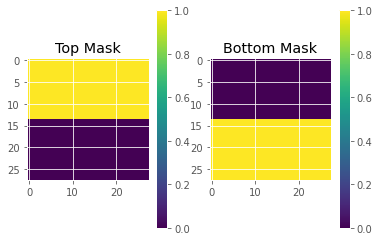

In [ ]:
plt.figure()
plt.subplot(121)
plt.imshow(topmask);
plt.colorbar()
plt.title('Top Mask')
plt.subplot(122)
plt.imshow(botmask);
plt.colorbar()
plt.title('Bottom Mask');

### Training


In [ ]:
optimizer = torch.optim.Adam([p for p in flow.parameters() if p.requires_grad==True], lr=1e-4)
losses=[]
for epoch in trange(epochs, position=0):
    for i, data in enumerate(train_loader):  
        loss = -flow.log_prob(data[0].view(-1, 784)).mean()

        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        optimizer.step()

    losses.append(loss)
            
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses, label='Training loss')
plt.legend()
plt.savefig('outputs/loss.png')

  8%|▊         | 17/200 [08:50<1:35:12, 31.22s/it]


KeyboardInterrupt: ignored

### Create Examples

In [ ]:
img=flow.sample(1).view(1, 28, 28).cpu().detach()
save_image(img, f"outputs/gen_img.png")
import matplotlib.image as mpimg
gen_img = mpimg.imread('outputs/gen_img.png')
plt.imshow(gen_img)
plt.show()

## Checkerboard Masking
Mask used in paper. In publications, this is also combined with a merging and channel based masking procedure.

### Mask Implementation

In [ ]:
def checkerboard_mask(d):
    '''Create a checkerboard binary mask of size dxd'''
    mask = torch.zeros((d,d))
    for i in range(d):
            mask[i][0] = i%2
            for j in range(d-1):
                mask[i][j+1] = not mask[i][j]
    return mask
            
mask1 = checkerboard_mask(28).view(-1, 784)
mask2 = checkerboard_mask(28).apply_(lambda x: not x).view(-1, 784)
masks = torch.stack([mask1, mask2, mask1, mask2])
prior = distributions.MultivariateNormal(torch.zeros(28*28), torch.eye(28*28))
flow_chk = RealNVP(nets, nett, masks, prior)

plt.imshow(checkerboard_mask(28)); plt.colorbar();
plt.title('Checkerboard Mask');

### Training

In [ ]:
optimizer = torch.optim.Adam([p for p in flow_chk.parameters() if p.requires_grad==True], lr=1e-4)
losses=[]
for epoch in trange(epochs, position=0):
    for i, data in enumerate(train_loader):  
        loss = -flow_chk.log_prob(data[0].view(-1, 784)).mean()

        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        optimizer.step()

    losses.append(loss)
            
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses, label='Training loss')
plt.legend()
plt.savefig('outputs/loss_checkerboard.png')

## Create Examples

In [ ]:
img=flow_chk.sample(1).view(1, 28, 28).cpu().detach()
save_image(img, f"outputs/gen_img.png")
import matplotlib.image as mpimg
gen_img = mpimg.imread('outputs/gen_img.png')
plt.imshow(gen_img)
plt.show()

## Visualization for dequantization

Imports

In [ ]:
from keras.datasets import cifar10
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Load data

In [ ]:
(x_train, _), (_, _) = cifar10.load_data()

In [ ]:
x_train.shape

Pixel values are integers between 0 and 255

In [ ]:
print(np.min(x_train), np.max(x_train))

Let's consider two adjacent pixel positions and for better visualization let's map the pixels to {0, 1, ..., 7}

(values from 32i to 32i+ 31 are mapped to i for all i in {0, 1, ..., 7}) 

In [ ]:
pixel1 = x_train[:, 14, 14, 0] // 32
pixel2 = x_train[:, 14, 15, 0] // 32

Check that the pixel values are indeed in {0, 1, ..., 7}

In [ ]:
print(np.min(pixel1), np.max(pixel1))
print(np.min(pixel2), np.max(pixel2))

Let's say we iterate 10 times through the training set and add noise from Unif(0, 1) to pixels

In [ ]:
iterate = 10
data1_with_noise = np.tile(pixel1, iterate) + np.random.uniform(0, 1, (pixel1.shape[0] * iterate, ))
data2_with_noise = np.tile(pixel2, iterate) + np.random.uniform(0, 1, (pixel2.shape[0] * iterate, ))
data1_without_noise = np.tile(pixel1, iterate)
data2_without_noise = np.tile(pixel2, iterate)

Check shapes

In [ ]:
print(data1_with_noise.shape)
print(data2_with_noise.shape)
print(data1_without_noise.shape)
print(data2_without_noise.shape)

Let's plot the histograms for the first pixel with and without noise

In [ ]:
plt.hist(data1_with_noise, bins = 64, density = True)
plt.show()

plt.hist(data1_without_noise, bins = 64, density = True)
plt.show()

Note that we want to have a continous distribution, so if we increase the number of bins in the histogram then the height of the bins will tend to infinity because the values of the pixels are discrete. Note that from some point forward the bins cannot be observed anymore because they are too thin. However, it can be observed that maximum values on y-axis continue to increase.

In [ ]:
fig = plt.figure()

#Animation code inspired from [1]
def frame(w):
    fig.clear()
    plt.title("Number of bins: {}".format(2**(5+w)))
    plot = plt.hist(data1_without_noise, bins = 2**(5+w), density = True)
    return  plot

anim = animation.FuncAnimation(fig, frame, frames=7, interval = 1000, blit=False, repeat=True)
HTML(anim.to_html5_video())

Let's consider the two adjacent pixels now and compare their histogram with and without added noise.

It can be observed that in the case without noise: the peaks appear immediately, while in the case with noise: the transition is smoother when the numbers of bins increase.

Also, the reason the joint distribution of two adjacent pixels is concentrated towards the main diagonal is because adjacent pixels usually have similar values in images.

In [ ]:
fig = plt.figure()

#Animation code inspired from [1]
def frame(w):
    fig.clear()
    plt.title("Without Noise - Number of bins: {}".format(2**(3+w)))
    plot = plt.hist2d(data1_without_noise, data2_without_noise, bins = 2**(3+w), density = True)
    plt.colorbar()
    return  plot

anim = animation.FuncAnimation(fig, frame, frames=9, interval = 1000, blit=False, repeat=True)
HTML(anim.to_html5_video())

In [ ]:
fig = plt.figure()

#Animation code inspired from [1]
def frame(w):
    fig.clear()
    plt.title("With Uniform Noise - Number of bins: {}".format(2**(3+w)))
    plot = plt.hist2d(data1_with_noise, data2_with_noise, bins = 2**(3+w), density = True)
    plt.colorbar()
    return  plot

anim = animation.FuncAnimation(fig, frame, frames=9, interval = 1000, blit=False, repeat=True)
HTML(anim.to_html5_video())

Reference:
[1] https://stackoverflow.com/questions/61103994/embedding-matplotlib-animations-in-python-google-colab-notebook

# Lecture 18 : Unsupervised Domain Adaptation

We reproduce the model from Ganin et al (https://arxiv.org/pdf/1409.7495.pdf). Pytorch code is based off https://github.com/fungtion/DANN_py3

Task is image classification, adapt from SVHN to MNIST. Original 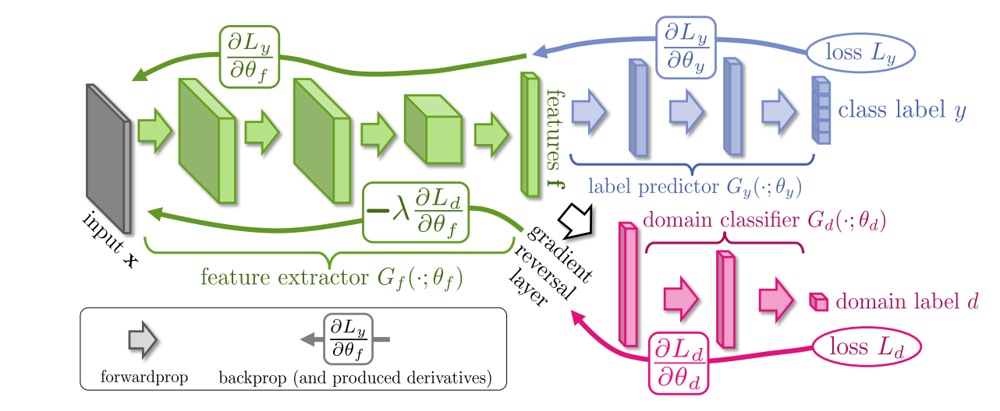

In [ ]:
import os
import torch.backends.cudnn as cudnn
import torch.utils.data
from torchvision import transforms
from torchvision import datasets
from torch.autograd import Function
import torch.nn as nn

import random
import torch.backends.cudnn as cudnn
import torch.optim as optim

from torchvision import transforms
import numpy as np

In [ ]:
"""
This class handles the gradient reversal layer utilized by the paper for the 
domain classification task, the alpha weights the gradient flowing to the 
upstream layers and acts as tradeoff between the two objectives. 
"""

class ReverseLayerF(Function):

    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha

        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        output = grad_output.neg() * ctx.alpha

        return output, None

In [ ]:

class CNNModel(nn.Module):

    def __init__(self):
        super(CNNModel, self).__init__()

        """ Standard Feedforward Network""" 
        self.feature = nn.Sequential()
        self.feature.add_module('f_conv1', nn.Conv2d(3, 64, kernel_size=5))
        self.feature.add_module('f_bn1', nn.BatchNorm2d(64))
        self.feature.add_module('f_pool1', nn.MaxPool2d(2))
        self.feature.add_module('f_relu1', nn.ReLU(True))
        self.feature.add_module('f_conv2', nn.Conv2d(64, 50, kernel_size=5))
        self.feature.add_module('f_bn2', nn.BatchNorm2d(50))
        self.feature.add_module('f_drop1', nn.Dropout2d())
        self.feature.add_module('f_pool2', nn.MaxPool2d(2))
        self.feature.add_module('f_relu2', nn.ReLU(True))

        """ Layers for Class Classification""" 
        self.class_classifier = nn.Sequential()
        self.class_classifier.add_module('c_fc1', nn.Linear(50 * 4 * 4, 100))
        self.class_classifier.add_module('c_bn1', nn.BatchNorm1d(100))
        self.class_classifier.add_module('c_relu1', nn.ReLU(True))
        self.class_classifier.add_module('c_drop1', nn.Dropout2d())
        self.class_classifier.add_module('c_fc2', nn.Linear(100, 100))
        self.class_classifier.add_module('c_bn2', nn.BatchNorm1d(100))
        self.class_classifier.add_module('c_relu2', nn.ReLU(True))
        self.class_classifier.add_module('c_fc3', nn.Linear(100, 10))
        self.class_classifier.add_module('c_softmax', nn.LogSoftmax())

        """ Layers for Domain Classification""" 
        self.domain_classifier = nn.Sequential()
        self.domain_classifier.add_module('d_fc1', nn.Linear(50 * 4 * 4, 100))
        self.domain_classifier.add_module('d_bn1', nn.BatchNorm1d(100))
        self.domain_classifier.add_module('d_relu1', nn.ReLU(True))
        self.domain_classifier.add_module('d_fc2', nn.Linear(100, 2))
        self.domain_classifier.add_module('d_softmax', nn.LogSoftmax(dim=1))

    def forward(self, input_data, alpha):
        input_data = input_data.expand(input_data.data.shape[0], 3, 28, 28)
        feature = self.feature(input_data)
        feature = feature.view(-1, 50 * 4 * 4)
        reverse_feature = ReverseLayerF.apply(feature, alpha) # in forward pass - acts as identity function 
        class_output = self.class_classifier(feature)
        domain_output = self.domain_classifier(reverse_feature) # in backpass - applies gradient from maximization function 

        return class_output, domain_output


In [ ]:

# test code

def test(dataset_name, epoch, my_net):

#     model_root = os.path.join('.', 'models')
#     image_root = os.path.join('.', 'dataset', dataset_name)

    cuda = True
    cudnn.benchmark = True
    batch_size = 128
    image_size = 28
    alpha = 0

    """load data"""

    img_transform_source = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.1307,), std=(0.3081,))
    ])

    img_transform_target = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ])

    if dataset_name == 'SVHN':
        dataset = dataset_source
#         test_list = os.path.join(image_root, 'mnist_m_test_labels.txt')

#         dataset = GetLoader(
#             data_root=os.path.join(image_root, 'mnist_m_test'),
#             data_list=test_list,
#             transform=img_transform_target
#         )
        
    elif dataset_name == 'MNIST':
        dataset = datasets.MNIST(
            root='./dataset',
            train=False,
            transform=img_transform_source,
        )

    dataloader = torch.utils.data.DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=8
    )

#     my_net = torch.load(os.path.join(
#         model_root, 'mnist_mnistm_model_epoch_' + str(epoch) + '.pth'
#     ))
    my_net = my_net.eval()

    if cuda:
        my_net = my_net.cuda()

    len_dataloader = len(dataloader)
    data_target_iter = iter(dataloader)

    i = 0
    n_total = 0
    n_correct = 0

    while i < len_dataloader:

        # test model using target data
        data_target = data_target_iter.next()
        t_img, t_label = data_target

        batch_size = len(t_label)

        input_img = torch.FloatTensor(batch_size, 3, image_size, image_size)
        class_label = torch.LongTensor(batch_size)

        if cuda:
            t_img = t_img.cuda()
            t_label = t_label.cuda()
            input_img = input_img.cuda()
            class_label = class_label.cuda()

        input_img.resize_as_(t_img).copy_(t_img)
        class_label.resize_as_(t_label).copy_(t_label)

        class_output, _ = my_net(input_data=input_img, alpha=alpha)
        pred = class_output.data.max(1, keepdim=True)[1]
        n_correct += pred.eq(class_label.data.view_as(pred)).cpu().sum()
        n_total += batch_size

        i += 1

    accu = n_correct.data.numpy() * 1.0 / n_total

    print('epoch: %d, accuracy of the %s dataset: %f' % (epoch, dataset_name, accu))
    
    return accu


## Config and Data

In [ ]:

source_dataset_name = 'SVHN'
target_dataset_name = 'MNIST'

cuda = True
cudnn.benchmark = True
lr = 1e-3
batch_size = 128
image_size = 28
n_epoch = 1

manual_seed = random.randint(1, 10000)
random.seed(manual_seed)
torch.manual_seed(manual_seed)


In [ ]:

# load data

img_transform_source = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
#     transforms.Normalize(mean=(0.1307,), std=(0.3081,))
])

img_transform_target = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
#     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])


# SVHN to MNIST
# TODO: change transform

dataset_source = datasets.SVHN(
    root='./dataset',
#     train=True,
    transform=img_transform_source,
    download=True
)
dataloader_source = torch.utils.data.DataLoader(
    dataset=dataset_source,
    batch_size=batch_size,
    shuffle=True,
    num_workers=8)

dataset_target = datasets.MNIST(
    root='./dataset',
    train=True,
    transform=img_transform_source,
    download=True
)
dataloader_target = torch.utils.data.DataLoader(
    dataset=dataset_target,
    batch_size=batch_size,
    shuffle=True,
    num_workers=8)


## Visualize Examples

In [ ]:
import matplotlib.pyplot as plt

def show_image(image):
    image = image.transpose(0, 1).transpose(1, 2)
    plt.imshow(image) 
    plt.show() 

for inputs,targets in dataloader_source:
    print(inputs.shape, targets.shape)
    
    ex_input = inputs[0]
    
    show_image(ex_input)
    
    break
    
for inputs,targets in dataloader_target:
    print(inputs.shape, targets.shape)
    
    ex_input = inputs[0]
    
    ex_input = ex_input.transpose(0, 1).transpose(1, 2).squeeze()
    plt.imshow(ex_input, cmap='gray') 
    plt.show()
    
    break

## Train and Test

TODO: The DANN isn't working well, diagnose

In [ ]:


def train(baseline=False):
    
    
    scores = {'source_acc':[],'target_acc':[]}
    
    # load model

    my_net = CNNModel()

    # setup optimizer

    optimizer = optim.Adam(my_net.parameters(), lr=lr)

    loss_class = torch.nn.NLLLoss()
    loss_domain = torch.nn.NLLLoss()

    if cuda:
        my_net = my_net.cuda()
        loss_class = loss_class.cuda()
        loss_domain = loss_domain.cuda()

    for p in my_net.parameters():
        p.requires_grad = True


    # for epoch in xrange(n_epoch):
    for epoch in range(n_epoch):

        len_dataloader = min(len(dataloader_source), len(dataloader_target))
        data_source_iter = iter(dataloader_source)
        data_target_iter = iter(dataloader_target)

        i = 0
        while i < len_dataloader:

            p = float(i + epoch * len_dataloader) / n_epoch / len_dataloader
            alpha = 2. / (1. + np.exp(-10 * p)) - 1

            # training model using source data
            data_source = data_source_iter.next()
            s_img, s_label = data_source

            my_net.zero_grad()
            batch_size = len(s_label)

            input_img = torch.FloatTensor(batch_size, 3, image_size, image_size)
            class_label = torch.LongTensor(batch_size)
            domain_label = torch.zeros(batch_size)
            domain_label = domain_label.long()

            if cuda:
                s_img = s_img.cuda()
                s_label = s_label.cuda()
                input_img = input_img.cuda()
                class_label = class_label.cuda()
                domain_label = domain_label.cuda()

            input_img.resize_as_(s_img).copy_(s_img)
            class_label.resize_as_(s_label).copy_(s_label)

            class_output, domain_output = my_net(input_data=input_img, alpha=alpha)
            err_s_label = loss_class(class_output, class_label)
            err_s_domain = loss_domain(domain_output, domain_label)

            # training model using target data
            data_target = data_target_iter.next()
            t_img, _ = data_target

            batch_size = len(t_img)

            input_img = torch.FloatTensor(batch_size, 3, image_size, image_size)
            domain_label = torch.ones(batch_size)
            domain_label = domain_label.long()

            if cuda:
                t_img = t_img.cuda()
                input_img = input_img.cuda()
                domain_label = domain_label.cuda()

            input_img.resize_as_(t_img).copy_(t_img)
            
            if baseline:
                domain_output = 0
                err_s_domain = 0
                err_t_domain = 0
            else:
                _, domain_output = my_net(input_data=input_img, alpha=alpha)
                err_t_domain = loss_domain(domain_output, domain_label)

                
            err = err_t_domain + err_s_domain + err_s_label

            err.backward()
            optimizer.step()

            

            i += 1
            if i % 100 == 0:
                source_acc = test(source_dataset_name, epoch, my_net)
                target_acc = test(target_dataset_name, epoch, my_net)
                
                scores['source_acc'].append(source_acc)
                scores['target_acc'].append(target_acc)
                
                if baseline:
                    print('epoch: %d, [iter: %d / all %d], err_s_label: %f' \
                          % (epoch, i, len_dataloader, err_s_label.cpu().data.numpy(),
                             ))
                else:
                    print('epoch: %d, [iter: %d / all %d], err_s_label: %f, err_s_domain: %f, err_t_domain: %f' \
                          % (epoch, i, len_dataloader, err_s_label.cpu().data.numpy(),
                             err_s_domain.cpu().data.numpy(), err_t_domain.cpu().data.numpy()))
            

            # if i>1000: 
            #     print('break')
            #     break

        # torch.save(my_net, '{0}/mnist_mnistm_model_epoch_{1}.pth'.format(model_root, epoch))

        print('scores',scores)
        plt.plot(scores['source_acc'])
        plt.plot(scores['target_acc'])
        plt.show()


    print('done')
    return my_net, scores


n_epoch = 10
print('epochs:', n_epoch)
baseline_model, baseline_scores = train(baseline=True)
dann_model, dann_scores = train(baseline=False)


In [ ]:
# Ran cell with bug 
baseline_model = baseline_scores[0].eval()
dann_model = dann_scores[0].eval()

In [ ]:
import random 
sidx = random.randint(0, len(dataset_source))
source_example, source_cls = dataset_source[sidx]

tidx = random.randint(0, len(dataset_target))
target_example, target_cls = dataset_target[tidx]

source_example = source_example.cuda()
target_example = target_example.cuda()

print(sidx, tidx)

with torch.no_grad():
  base_sout, _ = baseline_model(source_example, alpha=1)
  base_sout = base_sout.data.max(1, keepdim=True)[1].cpu()
  dann_sout, _ = dann_model(source_example, alpha=1)
  dann_sout = dann_sout.data.max(1, keepdim=True)[1].cpu()

  base_tout, _ = baseline_model(target_example, alpha=1)
  base_tout = base_tout.data.max(1, keepdim=True)[1].cpu()
  dann_tout, _ = dann_model(target_example, alpha=1)
  dann_tout = dann_sout.data.max(1, keepdim=True)[1].cpu()

print(base_sout, dann_sout, source_cls)
print(base_tout, dann_tout, target_cls)

fig, axes = plt.subplots(1, 2, figsize=(10, 3))
source_example = source_example.transpose(0, 1).transpose(1, 2).cpu()
target_example = target_example.transpose(0, 1).transpose(1, 2).cpu()
axes[0].imshow(source_example.squeeze())
axes[1].imshow(target_example.squeeze())

# Lecture 19 : Domain Adaptation and Domain Generalization



#**New Section**

##Example of Covariate shift
In the lectures we discussed that many domain adaptation algorithms rely on the assumption of covariate shift, that is although there are changes in p(x) and p(y) , p(y |x) remains constant between the domains.
There were some questions in class regarding the intuition behind this. So below is an example of domain shift that follows the covariate shift assumption.

the below example is a simple classification problem with two classes (y=1, y=0) and two features (x1, x2).  The classes are discriminated by the curve y=1 if x2 > x1^2, and y=0 if x2 < x1 ^2

We go over two examples of domains. The training and test set in the first domain are sampled from one set of p(x). We fit a simple  linear classifier to this and achieve good results. 
We then shift domains by sampling a new p(x), while keeping p(y|x) constant. We show that this covariate shift results in poor classification results.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import sklearn as sk
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [ ]:
# create  discrimination line p(y|x)
x = np.arange(-10,10,.01)
y = x**2
# p(y=1 | x) = x[1]**2 < x[2]
# p(y=0 | x) = x[1]**2 > x[2]
# create sampled training set ie p(x), p(y)
mean = (7,30)
cov = [[2,0],[0,7]]
x1_train = np.random.multivariate_normal(mean,cov,1000) # create 2d training data P(x)
# ensure that p(y1 |x1 ) = p(y|x), following above rule ie condition of covariate shift
y1_train = x1_train[:,1] > x1_train[:,0]**2 

x1_test = np.random.multivariate_normal(mean,cov,100) # create 2d training data P(x)
# ensure that p(y1 |x1 ) = p(y|x), following above rule ie condition of covariate shift
y1_test = x1_test[:,1] > x1_test[:,0]**2 
plt.figure()
plt.plot(x1_train[y1_train,0],x1_train[y1_train,1],'x',label='domain 1 class 1')
plt.plot(x1_train[~y1_train,0],x1_train[~y1_train,1],'.',label='domain 1 class 2)
plt.plot(x,y, label='True discrim curve  for p(y|x)')
plt.xlabel('feature 1')
plt.ylabel('feature 2')
plt.grid()
ax=plt.gca()
plt.legend()
# ax.set_xlim([-10,20])
ax.set_ylim([-5,50])

In [ ]:
clf = LinearDiscriminantAnalysis()
clf.fit(x1_train,y1_train)
x1 = np.array([-10,10])
y1_test_pred = clf.predict(x1_test)
acc = np.sum(y1_test_pred == y1_test)/len(y1_test)
print('domain 1 test accuracy: ',100*acc,'%')

b = clf.intercept_
w1 = clf.coef_[0][0]
w2 = clf.coef_[0][1]
y_line = -(b+x1*w1)/w2
plt.figure()
plt.plot(x1_train[y1_train,0],x1_train[y1_train,1],'x',label='domain 1 class 1')
plt.plot(x1_train[~y1_train,0],x1_train[~y1_train,1],'.',label='domain 1 class 2')
plt.plot(x,y, label='True discrim curve  for p(y|x)')
plt.plot(x1,y_line,'-.',label='classifier learned curve ')
plt.xlabel('feature 1')
plt.ylabel('feature 2')
plt.grid()
ax=plt.gca()
plt.legend()
# ax.set_xlim([-10,20])
ax.set_ylim([-50,50])

In [ ]:
 # create new set of p(x) data ie, new domain
 mean = (-5,30)
cov = [[2,0],[0,7]]
x2_data = np.random.multivariate_normal(mean,cov,100) # create 2d training data P(x)
# ensure that p(y1 |x1 ) = p(y|x), following above rule ie condition of covariate shift
y2_data = x2_data[:,1] > x2_data[:,0]**2 # use same p(y | x) following covariate shift

y2_pred = clf.predict(x2_data)
acc = np.sum(y2_pred == y2_data)/len(y2_data)
print('Accuracy on domain 2: ',acc*100,'%')


plt.figure()
plt.plot(x1_train[y1_train,0],x1_train[y1_train,1],'x',label='domain 1 class 1')
plt.plot(x1_train[~y1_train,0],x1_train[~y1_train,1],'.',label='domain 1 class 2')
plt.plot(x,y, label='True discrim curve for p(y|x)')
plt.plot(x1,y_line,'-.',label='classifier learned curve ')
plt.plot(x2_data[y2_data,0],x2_data[y2_data,1],'x',label='domain 2 class 1')
plt.plot(x2_data[~y2_data,0],x2_data[~y2_data,1],'.',label='domain 2 class 2')
plt.xlabel('feature 1')
plt.xlabel('feature 2')
plt.grid()
ax=plt.gca()
plt.legend()
# ax.set_xlim([-10,20])
ax.set_ylim([-50,50])

###Discussion
The above plot shows the danger of covariate shift. The function used to discriminate between class 1 and class 2 in p(y | x) is fairly simple. For the dataset of p(x) we achieved 99% accuracy on the test set!However once we sampled a new set of p(x) the accuracy dropped to 57% due to the covariate shift. The function p(y |x) remained constant between the two domains, the distribution shift between p(x) caused us to learn a function that failed with out of distribution generalization.

##Example of Invariant Risk Minimization
The below code is taken from the example github https://github.com/facebookresearch/InvariantRiskMinimization/blob/main/code/colored_mnist/reproduce_paper_results.sh which is an accompaniement to the paper on invariant risk minimization. https://arxiv.org/pdf/1907.02893v1.pdf
Here we insert their code as a function allowing us to perform multiple experiments and compare the results from the paper to the results in their codetheir classification results

In [ ]:

import argparse
import numpy as np
import torch
from torchvision import datasets
from torch import nn, optim, autograd


In [ ]:
# the code in this function was used from https://github.com/facebookresearch/InvariantRiskMinimization 
# used under creative commmons license
def test_RM(flags):
  final_train_accs = []
  final_test_accs = []
  for restart in range(flags.n_restarts):
    print("Restart", restart)

    # Load MNIST, make train/val splits, and shuffle train set examples

    mnist = datasets.MNIST('~/datasets/mnist', train=True, download=True)
    mnist_train = (mnist.data[:50000], mnist.targets[:50000])
    mnist_val = (mnist.data[50000:], mnist.targets[50000:])

    rng_state = np.random.get_state()
    np.random.shuffle(mnist_train[0].numpy())
    np.random.set_state(rng_state)
    np.random.shuffle(mnist_train[1].numpy())

    # Build environments

    def make_environment(images, labels, e):
      def torch_bernoulli(p, size):
        return (torch.rand(size) < p).float()
      def torch_xor(a, b):
        return (a-b).abs() # Assumes both inputs are either 0 or 1
      # 2x subsample for computational convenience
      images = images.reshape((-1, 28, 28))[:, ::2, ::2]
      # Assign a binary label based on the digit; flip label with probability 0.25
      labels = (labels < 5).float()
      labels = torch_xor(labels, torch_bernoulli(0.25, len(labels)))
      # Assign a color based on the label; flip the color with probability e
      colors = torch_xor(labels, torch_bernoulli(e, len(labels)))
      # Apply the color to the image by zeroing out the other color channel
      images = torch.stack([images, images], dim=1)
      images[torch.tensor(range(len(images))), (1-colors).long(), :, :] *= 0
      return {
        'images': (images.float() / 255.).cuda(),
        'labels': labels[:, None].cuda()
      }

    envs = [
      make_environment(mnist_train[0][::2], mnist_train[1][::2], 0.2),
      make_environment(mnist_train[0][1::2], mnist_train[1][1::2], 0.1),
      make_environment(mnist_val[0], mnist_val[1], 0.9)
    ]

    # Define and instantiate the model

    class MLP(nn.Module):
      def __init__(self):
        super(MLP, self).__init__()
        if flags.grayscale_model:
          lin1 = nn.Linear(14 * 14, flags.hidden_dim)
        else:
          lin1 = nn.Linear(2 * 14 * 14, flags.hidden_dim)
        lin2 = nn.Linear(flags.hidden_dim, flags.hidden_dim)
        lin3 = nn.Linear(flags.hidden_dim, 1)
        for lin in [lin1, lin2, lin3]:
          nn.init.xavier_uniform_(lin.weight)
          nn.init.zeros_(lin.bias)
        self._main = nn.Sequential(lin1, nn.ReLU(True), lin2, nn.ReLU(True), lin3)
      def forward(self, input):
        if flags.grayscale_model:
          out = input.view(input.shape[0], 2, 14 * 14).sum(dim=1)
        else:
          out = input.view(input.shape[0], 2 * 14 * 14)
        out = self._main(out)
        return out

    mlp = MLP().cuda()

    # Define loss function helpers

    def mean_nll(logits, y):
      return nn.functional.binary_cross_entropy_with_logits(logits, y)

    def mean_accuracy(logits, y):
      preds = (logits > 0.).float()
      return ((preds - y).abs() < 1e-2).float().mean()

    def penalty(logits, y):
      scale = torch.tensor(1.).cuda().requires_grad_()
      loss = mean_nll(logits * scale, y)
      grad = autograd.grad(loss, [scale], create_graph=True)[0]
      return torch.sum(grad**2)

    # Train loop

    def pretty_print(*values):
      col_width = 13
      def format_val(v):
        if not isinstance(v, str):
          v = np.array2string(v, precision=5, floatmode='fixed')
        return v.ljust(col_width)
      str_values = [format_val(v) for v in values]
      print("   ".join(str_values))

    optimizer = optim.Adam(mlp.parameters(), lr=flags.lr)

    pretty_print('step', 'train nll', 'train acc', 'train penalty', 'test acc')

    for step in range(flags.steps):
      for env in envs:
        logits = mlp(env['images'])
        env['nll'] = mean_nll(logits, env['labels'])
        env['acc'] = mean_accuracy(logits, env['labels'])
        env['penalty'] = penalty(logits, env['labels'])

      train_nll = torch.stack([envs[0]['nll'], envs[1]['nll']]).mean()
      train_acc = torch.stack([envs[0]['acc'], envs[1]['acc']]).mean()
      train_penalty = torch.stack([envs[0]['penalty'], envs[1]['penalty']]).mean()

      weight_norm = torch.tensor(0.).cuda()
      for w in mlp.parameters():
        weight_norm += w.norm().pow(2)

      loss = train_nll.clone()
      loss += flags.l2_regularizer_weight * weight_norm
      penalty_weight = (flags.penalty_weight 
          if step >= flags.penalty_anneal_iters else 1.0)
      loss += penalty_weight * train_penalty
      if penalty_weight > 1.0:
        # Rescale the entire loss to keep gradients in a reasonable range
        loss /= penalty_weight

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      
      test_acc = envs[2]['acc']
      if step % 100 == 0:
        pretty_print(
          np.int32(step),
          train_nll.detach().cpu().numpy(),
          train_acc.detach().cpu().numpy(),
          train_penalty.detach().cpu().numpy(),
          test_acc.detach().cpu().numpy()
        )

    final_train_accs.append(train_acc.detach().cpu().numpy())
    final_test_accs.append(test_acc.detach().cpu().numpy())
    print('Final train acc (mean/std across restarts so far):')
    print(np.mean(final_train_accs), np.std(final_train_accs))
    print('Final test acc (mean/std across restarts so far):')
    print(np.mean(final_test_accs), np.std(final_test_accs))

In [ ]:
 # Testing IRM parameters from IRM paper
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=390)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.00110794568)
parser.add_argument('--lr', type=float, default=0.0004898536566546834)
parser.add_argument('--n_restarts', type=int, default=10)
parser.add_argument('--penalty_anneal_iters', type=int, default=190)
parser.add_argument('--penalty_weight', type=float, default=91257.18613115903)
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

In [ ]:
 # Testing ERM parameters used in from IRM paper
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=256)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.0014)
parser.add_argument('--lr', type=float, default=0.001)
parser.add_argument('--n_restarts', type=int, default=10)
parser.add_argument('--penalty_anneal_iters', type=int, default=0) # no penalty for ERM
parser.add_argument('--penalty_weight', type=float, default=0.0) # setting penalty weight to 0 results in ERM
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

In [ ]:
 # Experiment 3 Trying new ERM parameters 
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=390)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.001)
parser.add_argument('--lr', type=float, default=0.001)
parser.add_argument('--n_restarts', type=int, default=10)
parser.add_argument('--penalty_anneal_iters', type=int, default=0) # no penalty for ERM
parser.add_argument('--penalty_weight', type=float, default=0.0) # setting penalty weight to 0 results in ERM
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

In [ ]:
 # Experiment 4 Trying new ERM parameters 
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=390)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.00086)
parser.add_argument('--lr', type=float, default=0.001)
parser.add_argument('--n_restarts', type=int, default=2)
parser.add_argument('--penalty_anneal_iters', type=int, default=0) # no penalty for ERM
parser.add_argument('--penalty_weight', type=float, default=0.0) # setting penalty weight to 0 results in ERM
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

The two above tests were attempts to use hyperparameter tuning to improve teh ERM results. The results remain poor at 20% where random selection is 50%

In [ ]:
 # Experiment 5 testing robustness of iRM to new hyperparameters
 # here we use the same hyperparameters that were used with ERM
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=256)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.001)
parser.add_argument('--lr', type=float, default=0.001)
parser.add_argument('--n_restarts', type=int, default=5)
# decreased penalty anneal iters to 100 (from 190)
parser.add_argument('--penalty_anneal_iters', type=int, default=190)
# decreased penaly weight 
parser.add_argument('--penalty_weight', type=float, default=91257.18613115903)
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

The above results seem to show that IRM is robust to some hyperparameter variation lett's try changing the penalty weight more.

In [ ]:
 # Experiment 5 testing robustness of iRM to new hyperparameters
 # here we use the same hyperparameters that were used with ERM
 # here we greatly decrease the penalty weight
parser = argparse.ArgumentParser(description='Colored MNIST')
parser.add_argument('-f')
parser.add_argument('--hidden_dim', type=int, default=256)
parser.add_argument('--l2_regularizer_weight', type=float,default=0.001)
parser.add_argument('--lr', type=float, default=0.001)
parser.add_argument('--n_restarts', type=int, default=5)
# decreased penalty anneal iters to 100 (from 190)
parser.add_argument('--penalty_anneal_iters', type=int, default=100)
# decreased penaly weight from 9000 to 1000
parser.add_argument('--penalty_weight', type=float, default=1000)
parser.add_argument('--steps', type=int, default=501)
parser.add_argument('--grayscale_model', action='store_true')
flags = parser.parse_args()

print('Flags:')
for k,v in sorted(vars(flags).items()):
  print("\t{}: {}".format(k, v))

test_RM(flags)

### Discussion
Important things to note.
The IRM paper used MLPs and no data augmentation
We make several observations:
1. In contrast with the comparison paper *in Search of Lost Domain Generalization* [2] an MLP is used as the function approximator. In [2], they use a CNN which may be partly why ERM outperformed in [2], whereas with this code we are still seeing poor performance with ERM even with hyperparameter tuning.
2. This code does not use data augmentation. [2] used data augmentation to great effect getting good results on ERM.
3. Despite some hyperparameter tuning ERM seems to perform poorly, at least without data augmentation and with an MLP. Across several above experiments the best results ERM achieved was 20% (where 50% is random selection).
4. IRM still performs much better than ERM even when changing the hyperparameters. So it seems to be more robust to model selection/hyperparameter tuning, at least for an MLP. It's accuracy didn't drop below 60%.
These experiments make me wonder if IRM is the better algorithm when there is less time for model selection and hyperparameter tuning. 

:# Lecture 18 and 19: Domain Adaptation and Domain Generalization

In this lecture, we discussed a cycle GAN based approach for domain adaptation. Under the assumptions of covariate shift, a cycle GAN can be used to translate images from the source domain (for which large amounts of labeled data is available) to a target domain (for which we dont have large amounts of labeled data).  A cycle GAN trains two separate GAN architectures, one for translating images from the source to the target distribution $(G_{S\rightarrow T}, D_{T})$ and the other for translating images from the target to the source distribution $(G_{T\rightarrow S}, D_{S})$. Apart from the normal GAN losses for each GAN it minimises something called the cycle consistency loss defined as 
$$L_{cyclic} = \mathop{\mathbb{E}}_{x \sim x^{S}}||G_{T\rightarrow S}(G_{S\rightarrow T}(x)) - x||  + \mathop{\mathbb{E}}_{x \sim x^{T}}||G_{S\rightarrow T}(G_{T\rightarrow S}(x)) - x|| $$ 

This ensures that the semantic contents of a image are preserved during translation across distributions. We now look at an example for training a cycle GAN largely adopted from https://colab.research.google.com/github/EliShayGH/cycle-gan-image2image-translation/blob/master/CycleGAN_Image2Image_Translation.ipynb#scrollTo=WY9KBHa9YWjG. 

In [ ]:
# download dependencies, restart the runtime after installation for the installed packages to be imported
!git clone https://github.com/EliShayGH/cycle-gan-image2image-translation.git
!cp ./cycle-gan-image2image-translation/helpers.py ./
!cp -r ./cycle-gan-image2image-translation/samples_cyclegan ./
!pip install pillow==6.1.0
!pip3 install scipy==0.17.0

## Dataset
We will not download the dataset. This dataset contains images of the Yosemite National Park in the two seasons - summer and winter. Our cycle GAN will try to translate images across the two distributions for each season. 

In [ ]:
# Download data 

!wget https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be66e78_summer2winter-yosemite/summer2winter-yosemite.zip
!unzip -q summer2winter-yosemite.zip
!rm summer2winter-yosemite.zip
!mv ./summer2winter_yosemite ./summer2winter-yosemite

In [ ]:
# loading in and transforming data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

In [ ]:
def get_data_loader(image_type, image_dir='summer2winter-yosemite', 
                    image_size=128, batch_size=16, num_workers=0):
    """Returns training and test data loaders for a given image type, either 'summer' or 'winter'. 
       These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    """
    
    # resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size), # resize to 128x128
                                    transforms.ToTensor()])

    # get training and test directories
    image_path = './' + image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [ ]:
# Create train and test dataloaders for images from the two domains X and Y
# image_type = directory names for our data
dataloader_X, test_dataloader_X = get_data_loader(image_type='summer')
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='winter')

We now visualize some images from the two datasets. First the summer dataset

In [ ]:
# helper imshow function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    

# get some images from X
dataiter = iter(dataloader_X)
# the "_" is a placeholder for no labels
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

Then the winter dataset - 

In [ ]:
# get some images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

In [ ]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    
    # scale from 0-1 to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

## Neural Architectures
This section contains pytorch code for the two generators and discriminators

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

# helper conv function
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, 
                           kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    
    layers.append(conv_layer)

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

## Discriminator

In [ ]:
class Discriminator(nn.Module):
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()

        # Define all convolutional layers
        # Should accept an RGB image as input and output a single value
        
        # 1st Conv layer has no batch_norm. dim = [64, 64, 64]
        self.conv1 = conv(3, conv_dim, 4, batch_norm=False)
        # 2nd Conv layer. dim = [32, 32, 128]
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        # 3rd Conv layer. dim = [16, 16, 256]
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        # 4th Conv layer. dim = [8, 8, 512]
        self.conv4 = conv(conv_dim*4, conv_dim*8, 4)
        # 5th Last Conv layer, Classification Layer has no batch_norm and stride is 1. dim = [1, 1, 1]
        self.conv5 = conv(conv_dim*8, 1, 8, stride=1, padding=0, batch_norm=False)
        self.act = nn.Tanh()

    def forward(self, x):
        # feedforward behavior - relu to all but last layer
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.act(self.conv5(x))
        return x

## Generator

In [ ]:
# residual block class
class ResidualBlock(nn.Module):
    """Defines a residual block.
       This adds an input x to a convolutional layer (applied to x) with the same size input and output.
       These blocks allow a model to learn an effective transformation from one domain to another.
    """
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        # conv_dim = number of inputs  
        
        # define two convolutional layers + batch normalization that will act as our residual function, F(x)
        # layers should have the same shape input as output; I suggest a kernel_size of 3
        self.conv1 = conv(conv_dim, conv_dim, 3, 1, batch_norm=True)
        self.conv2 = conv(conv_dim, conv_dim, 3, 1, batch_norm=True)
        
    def forward(self, x):
        # apply a ReLu activation the outputs of the first layer
        # return a summed output, x + resnet_block(x)
        output = F.relu(self.conv1(x))
        output = x + self.conv2(output)
        
        return output

In [ ]:
# helper deconv function
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a transpose convolutional layer, with optional batch normalization.
    """
    layers = []
    # append transpose conv layer
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    # optional batch norm layer
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

In [ ]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()

        # 1. Define the encoder part of the generator
        self.conv1 = conv(3, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)

        # 2. Define the resnet part of the generator
        res_layers = []
        for layer in range(n_res_blocks):
          res_layers.append(ResidualBlock(conv_dim*4))

        self.resblocks = nn.Sequential(*res_layers)

        # 3. Define the decoder part of the generator
        self.deconv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.deconv2 = deconv(conv_dim*2, conv_dim, 4)
        self.deconv3 = deconv(conv_dim, 3, 4, batch_norm=False)

    def forward(self, x):
        """Given an image x, returns a transformed image."""
        # define feedforward behavior, applying activations as necessary
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        x = self.resblocks.forward(x)

        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = F.tanh(self.deconv3(x))

        return x

## Creating the full cycle GAN

In [ ]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """Builds the generators and discriminators."""
    
    # Instantiate generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    # Instantiate discriminators
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)

    # move models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [ ]:
# call the function to get models
G_XtoY, G_YtoX, D_X, D_Y = create_model()

## Loss functions for CycleGAN

In [ ]:
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean(torch.max(input = 1-D_out, other=torch.zeros_like(D_out)))
    #return torch.mean((D_out-1)**2)
    
def fake_mse_loss(D_out):
    return torch.mean(torch.max(input = 1+D_out, other=torch.zeros_like(D_out)))

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    reconstr_loss = torch.mean(torch.abs(real_im - reconstructed_im))
    # return weighted loss
    return lambda_weight*reconstr_loss

## Optimizers

In [ ]:
import torch.optim as optim

# hyperparams for Adam optimizers
lr=0.0001
beta1=0.9
beta2=0.999

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters

# Create optimizers for the generators and discriminators
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

## Training

In [ ]:
# import save code
from helpers import save_samples, checkpoint

In [ ]:
# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  n_epochs=1000):
    
    print_every=10
    
    # keep track of losses over time
    losses = []

    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = scale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = scale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()
        images_X = scale(images_X) # make sure to scale to a range -1 to 1

        images_Y, _ = iter_Y.next()
        images_Y = scale(images_Y)
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        ##   First: D_X, real and fake loss components   ##
        d_x_optimizer.zero_grad()
        # 1. Compute the discriminator losses on real images
        out_x = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x)

        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_x = G_YtoX(images_Y)

        # 3. Compute the fake loss for D_X
        out_x = D_X(fake_x)
        D_X_fake_loss = fake_mse_loss(out_x)

        # 4. Compute the total loss and perform backprop
        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward(retain_graph=True)
        d_x_optimizer.step()
        
        ##   Second: D_Y, real and fake loss components   ##
        d_y_optimizer.zero_grad()

        # 1. Compute the discriminator losses on real images
        out_y = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y)

        # 2. Generate fake images that look like domain Y based on real images in domain X
        fake_y = G_XtoY(images_X)

        # 3. Compute the fake loss for D_Y
        out_y = D_Y(fake_y)
        D_Y_fake_loss = fake_mse_loss(out_y)

        # 4. Compute the total loss and perform backprop
        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward(retain_graph=True)
        d_y_optimizer.step()
        

        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        ##    First: generate fake X images and reconstructed Y images    ##
        g_optimizer.zero_grad()
        
        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # 2. Compute the generator loss based on domain X
        out_x = D_X(fake_X)
        
        g_YtoX_loss = real_mse_loss(out_x)

        # 3. Create a reconstructed y
        reconstructed_Y = G_XtoY(fake_X)

        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=10)

        ##    Second: generate fake Y images and reconstructed X images    ##
         
        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_Y = G_XtoY(images_X)

        # 2. Compute the generator loss based on domain X
        out_y = D_Y(fake_Y)
        g_XtoY_loss = real_mse_loss(out_y)

        # 3. Create a reconstructed y
        reconstructed_X = G_YtoX(fake_Y)

        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=10)


        # 5. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss
        #g_YtoX_loss.backward()
        #g_XtoY_loss.backward()
        #reconstructed_y_loss.backward()
        #reconstructed_x_loss.backward()
        g_total_loss.backward(retain_graph=True)
        g_optimizer.step()
        
        # Print the log info
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=100
        # Save the generated samples
        if epoch % sample_every == 0:
            G_YtoX.eval() # set generators to eval mode for sample generation
            G_XtoY.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)
            G_YtoX.train()
            G_XtoY.train()

    return losses


In [ ]:
n_epochs = 1000 
losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

In [ ]:
import matplotlib.image as mpimg

# helper visualization code
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('X (summer) to Y (winter)')
    ax2.imshow(y2x)
    ax2.set_title('Y (winter) to X(summer)')

In [ ]:
# view samples at iteration 100
view_samples(100, 'samples_cyclegan')

In [ ]:
# view samples at iteration 1000
view_samples(1000, 'samples_cyclegan')

# **Lecture 20 - Self-Supervised Learning**

The goal of self supervised learning is to find good embeddings or powerful representations of data samples. It is a form of representation learning, where the representations are expected to help solve a downstream task more efficiently.

We implement Self-Supervised Learning on a Clothing Dataset. The aim is to learn representations of different types of clothes, using SimCLR [1]. We visualize the outputs with KNN to see the performance of the model. 

[1] Chen, Ting, et al. "A simple framework for contrastive learning of visual representations." International conference on machine learning. PMLR, 2020.

## Setup

In [ ]:
!pip install lightly

In [ ]:
import os
import glob
import torch
import torch.nn as nn
import torchvision
import pytorch_lightning as pl
import lightly
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from PIL import Image
import numpy as np

In [ ]:
num_workers = 2
batch_size = 64
seed = 1
max_epochs = 20
input_size = 128
num_ftrs = 32
pl.seed_everything(seed)

## Dataset

In [ ]:
!git clone https://github.com/alexeygrigorev/clothing-dataset

In [ ]:
path_to_data = '/content/clothing-dataset/images'

## Setup data augmentations and loaders

---
We augment the data, so that the model learns about the structure of the clothing, and stays invariant to rotations and flips, as described in the SimCLR paper.



In [ ]:
# Implements transformations as described in the SimCLR paper. 
# Some of these include Crop and Resize, Color Distortions and Gaussian Noise.

# According to the paper, "The random crop (with resize) is always followed by a
# random horizontal/left-to-right flip with 50% probability".

# The collate function takes an input image set, transforms each image into
# two different augmentations, and then returns a concatenated batch.
collate_fn = lightly.data.SimCLRCollateFunction(
    input_size=input_size,
    vf_prob=0.5,
    rr_prob=0.5
)

# We create a torchvision transformation for embedding the dataset after training
test_transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=lightly.data.collate.imagenet_normalize['mean'],
        std=lightly.data.collate.imagenet_normalize['std'],
    )
])

# Wrapping the train dataset with the Lightly abstraction
dataset_train_simclr = lightly.data.LightlyDataset(
    input_dir=path_to_data
)

# Wrapping the test dataset and the test transforms with the Lightly abstraction.
dataset_test = lightly.data.LightlyDataset(
    input_dir=path_to_data,
    transform=test_transforms
)

# Preparing the dataloader for the trainset
dataloader_train_simclr = torch.utils.data.DataLoader(
    dataset_train_simclr,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    drop_last=True,
    num_workers=num_workers
)

# Preparing the dataloader for the testset
dataloader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size=batch_size,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers
)

In [ ]:
# Building the Resnet backbone
resnet = torchvision.models.resnet18()
last_conv_channels = list(resnet.children())[-1].in_features
backbone = nn.Sequential(
    *list(resnet.children())[:-1],
    nn.Conv2d(last_conv_channels, num_ftrs, 1),
)

# Creating a SimCLR model using the Resnet backbone
model = lightly.models.SimCLR(backbone, num_ftrs=num_ftrs)


In [ ]:
# Setting loss criteria and optimizer as described in the SimCLR paper
criterion = lightly.loss.NTXentLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9)
encoder = lightly.embedding.SelfSupervisedEmbedding(
    model,
    criterion,
    optimizer,
    dataloader_train_simclr
)

In [ ]:
gpus = 1 if torch.cuda.is_available() else 0

In [ ]:
# Training the embedding for 20 epochs
encoder.train_embedding(gpus=gpus,
                        progress_bar_refresh_rate=100,
                        max_epochs=max_epochs)


In [ ]:
# Transferring model to device for inference
device = 'cuda' if gpus==1 else 'cpu'
encoder = encoder.to(device)

In [ ]:
# Loading the test dataloader and normalizing the embeddings
embeddings, _, fnames = encoder.embed(dataloader_test, device=device)
embeddings = normalize(embeddings)

In [ ]:
def get_image_as_np_array(filename: str):
    """Returns an image as an numpy array
    """
    img = Image.open(filename)
    return np.asarray(img)

def plot_knn_examples(embeddings, n_neighbors=3, num_examples=6):
    """Plots multiple rows of random images with their nearest neighbors
    """
    # For vieweing the nearest neighbours of some samples in the test dataset
    nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(embeddings)
    distances, indices = nbrs.kneighbors(embeddings)

    # get 5 random samples
    samples_idx = np.random.choice(len(indices), size=num_examples, replace=False)

    # loop through our randomly picked samples
    for idx in samples_idx:
        fig = plt.figure()
        # loop through their nearest neighbors
        for plot_x_offset, neighbor_idx in enumerate(indices[idx]):
            # add the subplot
            ax = fig.add_subplot(1, len(indices[idx]), plot_x_offset + 1)
            # get the correponding filename for the current index
            fname = os.path.join(path_to_data, fnames[neighbor_idx])
            # plot the image
            plt.imshow(get_image_as_np_array(fname))
            # set title to the distance of the neighbor
            ax.set_title(f'd={distances[idx][plot_x_offset]:.3f}')
            # disable the axis
            plt.axis('off')


In [ ]:
# Plotting the k nearest neighbors.
# Observe that closer samples are more similar and further ones are different.
plot_knn_examples(embeddings)


In [ ]:
# While the samples produced above show that the model learns the structure of the clothes,
# it also learns the variance in colour.
# To tackle this and make the model colour invariant, we set train again without colour augmentation.

# Set color jitter and gray scale probability to 0
new_collate_fn = lightly.data.SimCLRCollateFunction(
    input_size=input_size,
    vf_prob=0.5,
    rr_prob=0.5,
    cj_prob=0.0,
    random_gray_scale=0.0
)

# Update collate method and reuse our dataloader
dataloader_train_simclr.collate_fn=new_collate_fn

# create a ResNet backbone and remove the classification head.
# Train the SimCLR model as described above.
resnet = torchvision.models.resnet18()
last_conv_channels = list(resnet.children())[-1].in_features
backbone = nn.Sequential(
    *list(resnet.children())[:-1],
    nn.Conv2d(last_conv_channels, num_ftrs, 1),
)
model = lightly.models.SimCLR(backbone, num_ftrs=num_ftrs)
optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9)
encoder = lightly.embedding.SelfSupervisedEmbedding(
    model,
    criterion,
    optimizer,
    dataloader_train_simclr
)

encoder.train_embedding(gpus=gpus,
                        progress_bar_refresh_rate=100,
                        max_epochs=max_epochs)
encoder = encoder.to(device)

embeddings, _, fnames = encoder.embed(dataloader_test, device=device)
embeddings = normalize(embeddings)

In [ ]:
plot_knn_examples(embeddings)


Observe that the model respects the variance in colour now.

## Self supervised representation learning
## Goal
To show that a self supervised feature extraction using artificially generated angle lables learns meaningfull features

## Setup and procedure
1) We augment the cifar10 dataset with all images randomly rotated 0,90,180 or 270 degrees. Using this rotated dataset we train a ResNet based neural network to classify images into their appropriate levels of rotation. 

2) We use this pre-trained self-supervised model to solve our downstream task of image classification. We do this by replacing the the last layer of the model with a new task specific layer of 10 nodes(as we are now predicting one in 10 image classes)

3) Then we proceed to train ResNet models with and without the self-supervised feature extractor on different portions of the data and compare the performance improvements depend on the amount of labeled data available.

Note: For testing puspose, the training is done only for 10 epochs. However, forbetter results, higher number of epochs are recommended.


##Imports

In [ ]:
from __future__ import print_function
import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Activation
from keras.layers import AveragePooling2D, Input, Flatten
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from keras.regularizers import l2
from keras import backend as K
from keras.models import Model
from keras.datasets import cifar10
import numpy as np
import os
from sklearn.model_selection import StratifiedKFold
import seaborn as sns
import pandas as pd
import random
import pickle
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.utils.np_utils import to_categorical

## Data preprocessing

In [ ]:
def preprocess_data(x_train,y_train,x_test,y_test,subtract_pixel_mean=True):
    # Normalize data.
    x_train = x_train.astype('float32') / 255
    x_test = x_test.astype('float32') / 255
    # If subtract pixel mean is enabled
    if subtract_pixel_mean:
        x_train_mean = np.mean(x_train, axis=0)
        x_train -= x_train_mean
        x_test -= x_train_mean
    return x_train,y_train,x_test,y_test

## Rotate images to generate artificial angle lables

In [ ]:
def rotate_image(im,iterations=None):
  if not iterations:
    iterations = random.randint(0,3)
  y = [0,0,0,0]
  y[iterations]=1
  for i in range(iterations):
    im = np.rot90(im)
  return im,y

def make_rotated_data(Train,Test,subtract_pixel_mean=True):
    model_name='cifar100SLL'
    xy_rot_train = list(zip(*[rotate_image(im) for im in Train[0]]))
    xy_rot_test = list(zip(*[rotate_image(im) for im in Test[0]]))
    
    
    x_rot_train=np.array(xy_rot_train[0][:]).astype('float32')/255
    y_rot_train=np.array(xy_rot_train[1][:])
    x_rot_test=np.array(xy_rot_test[0][:]).astype('float32')/255
    y_rot_test=np.array(xy_rot_test[1][:])
    
    if subtract_pixel_mean:
        x_rot_train_mean = np.mean(x_rot_train, axis=0)
        x_rot_train -= x_rot_train_mean
        x_rot_test -= x_rot_train_mean
    return x_rot_train,y_rot_train,x_rot_test,y_rot_test

## RESNET
### Resnet Implementation taken from David Yang

In [ ]:
def lr_schedule(epoch):
    """Learning Rate Schedule
    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.
    # Arguments
        epoch (int): The number of epochs
    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 180:
        lr *= 0.5e-3
    elif epoch > 160:
        lr *= 1e-3
    elif epoch > 120:
        lr *= 1e-2
    elif epoch > 80:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr
def resnet_layer(inputs,
                 num_filters=16,
                 kernel_size=3,
                 strides=1,
                 activation='relu',
                 batch_normalization=True,
                 conv_first=True):
    """2D Convolution-Batch Normalization-Activation stack builder
    # Arguments
        inputs (tensor): input tensor from input image or previous layer
        num_filters (int): Conv2D number of filters
        kernel_size (int): Conv2D square kernel dimensions
        strides (int): Conv2D square stride dimensions
        activation (string): activation name
        batch_normalization (bool): whether to include batch normalization
        conv_first (bool): conv-bn-activation (True) or
            bn-activation-conv (False)
    # Returns
        x (tensor): tensor as input to the next layer
    """
    conv = Conv2D(num_filters,
                  kernel_size=kernel_size,
                  strides=strides,
                  padding='same',
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2(1e-4))
    x = inputs
    if conv_first:
        x = conv(x)
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
    else:
        if batch_normalization:
            x = BatchNormalization()(x)
        if activation is not None:
            x = Activation(activation)(x)
        x = conv(x)
    return x

def resnet_v1(input_shape, depth, num_classes=10):
    """ResNet Version 1 Model builder [a]
    Stacks of 2 x (3 x 3) Conv2D-BN-ReLU
    Last ReLU is after the shortcut connection.
    At the beginning of each stage, the feature map size is halved (downsampled)
    by a convolutional layer with strides=2, while the number of filters is
    doubled. Within each stage, the layers have the same number filters and the
    same number of filters.
    Features maps sizes:
    stage 0: 32x32, 16
    stage 1: 16x16, 32
    stage 2:  8x8,  64
    The Number of parameters is approx the same as Table 6 of [a]:
    ResNet20 0.27M
    ResNet32 0.46M
    ResNet44 0.66M
    ResNet56 0.85M
    ResNet110 1.7M
    # Arguments
        input_shape (tensor): shape of input image tensor
        depth (int): number of core convolutional layers
        num_classes (int): number of classes (CIFAR10 has 10)
    # Returns
        model (Model): Keras model instance
    """
    if (depth - 2) % 6 != 0:
        raise ValueError('depth should be 6n+2 (eg 20, 32, 44 in [a])')
    # Start model definition.
    num_filters = 16
    num_res_blocks = int((depth - 2) / 6)
    inputs = Input(shape=input_shape)
    x = resnet_layer(inputs=inputs)
    # Instantiate the stack of residual units
    for stack in range(3):
        for res_block in range(num_res_blocks):
            strides = 1
            if stack > 0 and res_block == 0:  # first layer but not first stack
                strides = 2  # downsample
            y = resnet_layer(inputs=x,
                             num_filters=num_filters,
                             strides=strides)
            y = resnet_layer(inputs=y,
                             num_filters=num_filters,
                             activation=None)
            if stack > 0 and res_block == 0:  # first layer but not first stack
                # linear projection residual shortcut connection to match
                # changed dims
                x = resnet_layer(inputs=x,
                                 num_filters=num_filters,
                                 kernel_size=1,
                                 strides=strides,
                                 activation=None,
                                 batch_normalization=False)
            x = keras.layers.add([x, y])
            x = Activation('relu')(x)
        num_filters *= 2
    # Add classifier on top.
    # v1 does not use BN after last shortcut connection-ReLU
    x = AveragePooling2D(pool_size=8)(x)
    y = Flatten()(x)
    outputs = Dense(num_classes,
                    activation='softmax',
                    kernel_initializer='he_normal')(y)
    # Instantiate model.
    model = Model(inputs=inputs, outputs=outputs)
    return model

##Training loop to learn angle classifier

In [ ]:
def training_testing_loop_angle_classifier(Train,Test,save_dir,input_shape=(32,32,3),n=3,model_name='Restnetv1_SSL_Rotation.h5'):

    x_rot_train,y_rot_train,x_rot_test,y_rot_test = make_rotated_data(Train,Test)
    
    
    # Computed depth from supplied model parameter n
    depth = n * 6 + 2
    
    resnet_model= resnet_v1(input_shape=input_shape, depth=depth)
    x = Dense(4,activation='softmax')(resnet_model.layers[-2].output)
    model = keras.Model(resnet_model.inputs,x)

    filepath = os.path.join(save_dir, model_name)
    # Prepare callbacks for model saving and for learning rate adjustment.
    checkpoint = ModelCheckpoint(filepath=filepath,
                                 monitor='val_accuracy',
                                 verbose=1,
                                 save_best_only=True)
    lr_scheduler = LearningRateScheduler(lr_schedule)
    lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                                   cooldown=0,
                                   patience=10,
                                   min_lr=0.5e-6)
    callbacks = [checkpoint, lr_reducer, lr_scheduler]

    optimizer = Adam()

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    datagen = ImageDataGenerator(
                # set input mean to 0 over the dataset
                featurewise_center=False,
                # set each sample mean to 0
                samplewise_center=False,
                # divide inputs by std of dataset
                featurewise_std_normalization=False,
                # divide each input by its std
                samplewise_std_normalization=False,
                # apply ZCA whitening
                zca_whitening=False,
                # epsilon for ZCA whitening
                zca_epsilon=1e-06,
                # randomly rotate images in the range (deg 0 to 180)
                rotation_range=0,
                # randomly shift images horizontally
                width_shift_range=0.1,
                # randomly shift images vertically
                height_shift_range=0.1,
                # set range for random shear
                shear_range=0.,
                # set range for random zoom
                zoom_range=0.,
                # set range for random channel shifts
                channel_shift_range=0.,
                # set mode for filling points outside the input boundaries
                fill_mode='nearest',
                # value used for fill_mode = "constant"
                cval=0.,
                # randomly flip images
                horizontal_flip=True,
                # randomly flip images
                vertical_flip=False,
                # set rescaling factor (applied before any other transformation)
                rescale=None,
                # set function that will be applied on each input
                preprocessing_function=None,
                # image data format, either "channels_first" or "channels_last"
                data_format=None,
                # fraction of images reserved for validation (strictly between 0 and 1)
                validation_split=0)
            # Compute quantities required for featurewise normalization
            # (std, mean, and principal components if ZCA whitening is applied).
    datagen.fit(x_rot_train)

    history_SSL = model.fit_generator(datagen.flow(x_rot_train,y_rot_train),validation_data=(x_rot_test,y_rot_test),epochs=10,callbacks=callbacks)
    
    history_filepath = os.path.join(save_dir, model_name+"_history")
    
    with open(history_filepath,'wb') as fp:
        pickle.dump(history_SSL.history,fp)




## load data and train model for angle classifier

In [ ]:
Train,Test = cifar10.load_data()
training_testing_loop_angle_classifier(Train,Test,save_dir='saved_models')

## Plot loss and accuracy for angle classifier model

In [ ]:
with open("saved_models/Restnetv1_SSL_Rotation.h5_history",'rb') as fp:
        history = pickle.load(fp)

ssl_df=pd.DataFrame({'loss':history['loss'] +history['val_loss'],'accuracy':history['accuracy']+history['val_accuracy'],'Dataset':'train'})
ssl_df.loc[len(ssl_df)//2:,'Dataset']='validation'
ssl_df['epoch'] = np.concatenate((np.arange(len(history['loss'])),np.arange(len(history['loss']))))

figure = plt.figure(figsize=(10,5))
g = sns.lineplot(y='accuracy',x='epoch',hue='Dataset',data=ssl_df)
g.set_title('Accuracy - Self-Supervised Image Rotation Pretext Task')

figure = plt.figure(figsize=(10,5))
g = sns.lineplot(y='loss',x='epoch',hue='Dataset',data=ssl_df)
g.set_title('Loss - Self-Supervised Image Rotation Pretext Task')

## Use ths angle classifier to predict CIFAR class
Having created our pre-trained model using self-supervision we now re-purpose it to solve our downstream task of image classification.

In [ ]:
def train_models_datasplit(x_train,y_train,x_test,y_test,
                               batch_size = 128,epochs=200,data_augmentation=True,
                               num_classes=10,
                               n = 3,ssl_path=None,dataset='cifar10',input_shape=(32,32,3),
                           data_fraction_increment=0.1,num_increments=10,random_state=689):
     
    ###Calcualte number of many kfolds splits 
    n_splits=int(1/data_fraction_increment)
        
        
    # Convert class vectors to binary class matrices.
    y_test = to_categorical(y_test, num_classes)
    # Computed depth from supplied model parameter n
    depth = n * 6 + 2
    # Model name, depth and version
    model_type = 'ResNet%d' % depth
    
    ###Calcualte number of many kfolds splits 
    n_splits=int(1/data_fraction_increment)
    
    ##Ensure that data increments consist of class balanced data
    skf = StratifiedKFold(n_splits=n_splits,random_state=random_state)
    
    histories = []
    for i,index  in enumerate(skf.split(x_train,y=y_train)):
        if i>num_increments-1:
            break
        if i > 0:
            test_index = np.concatenate((test_index,index[1]))
        else:
            test_index=index[1]
        y_train_t = to_categorical(y_train, num_classes)[test_index]
        if ssl_path:
            ssl_model=keras.models.load_model(ssl_path)
            x=model=ssl_model.layers[-2].output
            x = Dense(10,activation='softmax')(x)
            model = keras.Model(ssl_model.inputs,x)
        else:
            model = resnet_v1(input_shape=input_shape, depth=depth)
        
        model.compile(loss='categorical_crossentropy',
                      optimizer=Adam(learning_rate=lr_schedule(0)),
                      metrics=['accuracy'])
        model.summary()
        print(model_type)
        # Prepare model model saving directory.
        save_dir = os.path.join(os.getcwd(), 'saved_models')
        model_name = dataset + '_%s_model.h5' % model_type +"_"+ str((i/n_splits)*100)
        if not os.path.isdir(save_dir):
            os.makedirs(save_dir)
        filepath = os.path.join(save_dir, model_name)
        
        # Prepare callbacks for model saving and for learning rate adjustment.
#         checkpoint = ModelCheckpoint(filepath=filepath,
#                                      monitor='val_loss',
#                                      verbose=1,
#                                      save_best_only=True)
        lr_scheduler = LearningRateScheduler(lr_schedule)
        lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                                       cooldown=0,
                                       patience=5,
                                       min_lr=0.5e-6)
        callbacks = [ lr_reducer, lr_scheduler]
        
        # Run training, with or without data augmentation.
        if not data_augmentation:
            print('Not using data augmentation.')
            model.fit(x_train, y_train,
                      batch_size=batch_size,
                      epochs=epochs,
                      validation_data=(x_test, y_test),
                      shuffle=True,
                      callbacks=callbacks)
        else:
            print('Using real-time data augmentation.')
            # This will do preprocessing and realtime data augmentation:
            datagen = ImageDataGenerator(
                # set input mean to 0 over the dataset
                featurewise_center=False,
                # set each sample mean to 0
                samplewise_center=False,
                # divide inputs by std of dataset
                featurewise_std_normalization=False,
                # divide each input by its std
                samplewise_std_normalization=False,
                # apply ZCA whitening
                zca_whitening=False,
                # epsilon for ZCA whitening
                zca_epsilon=1e-06,
                # randomly rotate images in the range (deg 0 to 180)
                rotation_range=0,
                # randomly shift images horizontally
                width_shift_range=0.1,
                # randomly shift images vertically
                height_shift_range=0.1,
                # set range for random shear
                shear_range=0.,
                # set range for random zoom
                zoom_range=0.,
                # set range for random channel shifts
                channel_shift_range=0.,
                # set mode for filling points outside the input boundaries
                fill_mode='nearest',
                # value used for fill_mode = "constant"
                cval=0.,
                # randomly flip images
                horizontal_flip=True,
                # randomly flip images
                vertical_flip=False,
                # set rescaling factor (applied before any other transformation)
                rescale=None,
                # set function that will be applied on each input
                preprocessing_function=None,
                # image data format, either "channels_first" or "channels_last"
                data_format=None,
                # fraction of images reserved for validation (strictly between 0 and 1)
                validation_split=0)
            # Compute quantities required for featurewise normalization
            # (std, mean, and principal components if ZCA whitening is applied).
            datagen.fit(x_train)
            # Fit the model on the batches generated by datagen.flow().
            histories.append(model.fit_generator(datagen.flow(x_train[test_index], y_train_t, batch_size=batch_size),
                                epochs=epochs, verbose=1, workers=4,validation_data=(x_test,y_test),
                                callbacks=callbacks))
            
        # Record performance of trained model.
        train_maxes = []
        val_maxes = []
        val_loss = []
        train_loss = []
        if ssl_path:
            record_path = dataset +'_self_supervised.csv'
        else:
            record_path = dataset +'_supervised.csv'

        for i in range(len(histories)):
            val_maxes.append(max(histories[i].history['val_accuracy']))
            train_maxes.append(max(histories[i].history['accuracy']))
            val_loss.append(min(histories[i].history['val_loss']))
            train_loss.append(min(histories[i].history['loss']))
        pd.DataFrame({'Val_Accuracy':val_maxes,
                      'Train_Accuracy':train_maxes,
                      'Val_Loss':val_loss,'Train_Loss':train_loss}).to_csv(record_path)



## Run experiment with self supervised feature extractor

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train, y_train, x_test, y_test = preprocess_data(x_train, y_train, x_test, y_test)
train_models_datasplit(x_train, y_train, x_test, y_test,data_fraction_increment=0.02,batch_size=32, epochs=10, num_increments=10,dataset='CIFAR10_large',ssl_path='saved_models/Restnetv1_SSL_Rotation.h5')

## Run experiment without self supervised feature extractor

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train, y_train, x_test, y_test = preprocess_data(x_train, y_train, x_test, y_test)
train_models_datasplit(x_train, y_train, x_test, y_test,data_fraction_increment=0.02,batch_size=32,epochs=10, num_increments=10,dataset='CIFAR10_large')

## Compare results for different number of training samples




In [ ]:
def plot_ssl_vs_sl(df_ssl,df_sl,data_increment=0.1):
    df_sl['Model_Type']='supervised'
    df_ssl['Model_Type']='self_supervised'
    df = pd.concat((df_sl,df_ssl), ignore_index=True)
    df['Number_of_Samples'] = (df['Unnamed: 0']+1) *50000*0.1
    
    figure = plt.figure(figsize=(10,5))
    g = sns.lineplot(y='Val_Accuracy',x='Number_of_Samples',hue='Model_Type',data=df)
    title='Accuracy Self-Supervised vs Only Supervised'
    g.set_title(title)
    
    figure = plt.figure(figsize=(10,5))
    f = sns.lineplot(y='Val_Loss',x='Number_of_Samples',hue='Model_Type',data=df)
    title='Loss Self-Supervised vs Only Supervised'
    f.set_title(title)
    plt.show()


df_sl = pd.read_csv('CIFAR10_large' +'_supervised.csv')
df_ssl = pd.read_csv('CIFAR10_large' +'_self_supervised.csv')

plot_ssl_vs_sl(df_ssl,df_sl,data_increment=0.02 )

## Conclusion
As we can see in the above plots, the self supervised feature extractor approach was able to give us better accuracy even with lesser number of training samples.
Hence we can say that the angle classifier model did learn meaning full features which were usefull for CIFAR classifier

## References
1) https://medium.com/analytics-vidhya/self-supervised-learning-for-image-classification-263e320fff07

2) https://github.com/larsh0103/SSL_Experiement/blob/master/SSL_Experiment_CIFAR10.ipynb

# Lecture 21: Meta-learning

The goal of meta-learning, or "learning to learn," is to develop models that can learn a task from only a handful of training examples.

In this example, we will see how to build a meta-learning model using the MAML algorithm. To highlight the efficacy of meta-learning, we compare the test results of a regular neural network model and a MAML-based model.

This example of meta-learning using MAML is heavily adapted from https://colab.research.google.com/github/mari-linhares/tensorflow-maml/blob/master/maml.ipynb.

## Imports

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.backend as keras_backend


# Other dependencies
import random
import sys
import time

import numpy as np
import matplotlib.pyplot as plt

# Reproduction
np.random.seed(333)


print('Python version: ', sys.version)
print('TensorFlow version: ', tf.__version__)

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('GPU found at: {}'.format(device_name))

## Regression task

> *We start with a simple regression problem that illustrates
the basic principles of MAML. Each task involves regressing
from the input to the output of a sine wave, where the
amplitude and phase of the sinusoid are varied between
tasks. Thus, p(T ) is continuous, where the amplitude
varies within [0.1, 5.0] and the phase varies within [0, π],
and the input and output both have a dimensionality of 1.
During training and testing, datapoints x are sampled uniformly
from [−5.0, 5.0].*

![]()

In [ ]:
class SinusoidGenerator():
    '''
        Sinusoid Generator.
        
        p(T) is continuous, where the amplitude varies within [0.1, 5.0]
        and the phase varies within [0, π].
        
        This abstraction is the basically the same defined at:
        https://towardsdatascience.com/paper-repro-deep-metalearning-using-maml-and-reptile-fd1df1cc81b0  
    '''
    def __init__(self, K=10, amplitude=None, phase=None):
        '''
        Args:
            K: batch size. Number of values sampled at every batch.
            amplitude: Sine wave amplitude. If None is uniformly sampled from
                the [0.1, 5.0] interval.
            pahse: Sine wave phase. If None is uniformly sampled from the [0, π]
                interval.
        '''
        self.K = K
        self.amplitude = amplitude if amplitude else np.random.uniform(0.1, 5.0)
        self.phase = phase if amplitude else np.random.uniform(0, np.pi)
        self.sampled_points = None
        self.x = self._sample_x()
        
    def _sample_x(self):
        return np.random.uniform(-5, 5, self.K)
    
    def f(self, x):
        '''Sinewave function.'''
        return self.amplitude * np.sin(x - self.phase)

    def batch(self, x = None, force_new=False):
        '''Returns a batch of size K.
        
        It also changes the sape of `x` to add a batch dimension to it.
        
        Args:
            x: Batch data, if given `y` is generated based on this data.
                Usually it is None. If None `self.x` is used.
            force_new: Instead of using `x` argument the batch data is
                uniformly sampled.
        
        '''
        if x is None:
            if force_new:
                x = self._sample_x()
            else:
                x = self.x
        y = self.f(x)
        return x[:, None], y[:, None]
    
    def equally_spaced_samples(self, K=None):
        '''Returns `K` equally spaced samples.'''
        if K is None:
            K = self.K
        return self.batch(x=np.linspace(-5, 5, K))
        
        
def plot(data, *args, **kwargs):
    '''Plot helper.'''
    x, y = data
    return plt.plot(x, y, *args, **kwargs)


for _ in range(3):
    plt.title('Sinusoid examples')
    plot(SinusoidGenerator(K=100).equally_spaced_samples())
plt.show()

### Generate sinusoid datasets


In [ ]:
def generate_dataset(K, train_size=20000, test_size=10):
    '''Generate train and test dataset.
    
    A dataset is composed of SinusoidGenerators that are able to provide
    a batch (`K`) elements at a time.
    '''
    def _generate_dataset(size):
        return [SinusoidGenerator(K=K) for _ in range(size)]
    return _generate_dataset(train_size), _generate_dataset(test_size) 

train_ds, test_ds = generate_dataset(K=10)

### Training a regular Neural Network

We're training a neural network for given a batch of size *K* of randomly sampled values (*x*) predict *f(x)* where f is a sine wave function with amplitude randomly sampled within [0.1, 5.0] and the phase randomly sampled within [0, π].

Here the neural network has 2 hidden layers of size 40, with ReLU activation functions.

In [ ]:
class SineModel(keras.Model):
    def __init__(self):
        super().__init__()
        self.hidden1 = keras.layers.Dense(40, input_shape=(1,))
        self.hidden2 = keras.layers.Dense(40)
        self.out = keras.layers.Dense(1)
        
    def forward(self, x):
        x = keras.activations.relu(self.hidden1(x))
        x = keras.activations.relu(self.hidden2(x))
        x = self.out(x)
        return x

In [ ]:
def loss_function(pred_y, y):
  return keras_backend.mean(keras.losses.mean_squared_error(y, pred_y))

def np_to_tensor(list_of_numpy_objs):
    return (tf.convert_to_tensor(obj) for obj in list_of_numpy_objs)
    

def compute_loss(model, x, y, loss_fn=loss_function):
    logits = model.forward(x)
    mse = loss_fn(y, logits)
    return mse, logits


def compute_gradients(model, x, y, loss_fn=loss_function):
    with tf.GradientTape() as tape:
        loss, _ = compute_loss(model, x, y, loss_fn)
    return tape.gradient(loss, model.trainable_variables), loss


def apply_gradients(optimizer, gradients, variables):
    optimizer.apply_gradients(zip(gradients, variables))

    
def train_batch(x, y, model, optimizer):
    tensor_x, tensor_y = np_to_tensor((x, y))
    gradients, loss = compute_gradients(model, tensor_x, tensor_y)
    apply_gradients(optimizer, gradients, model.trainable_variables)
    return loss


def train_model(dataset, epochs=1, lr=0.001, log_steps=1000):
    model = SineModel()
    optimizer = keras.optimizers.Adam(learning_rate=lr)
    for epoch in range(epochs):
        losses = []
        total_loss = 0
        start = time.time()
        for i, sinusoid_generator in enumerate(dataset):
            x, y = sinusoid_generator.batch()
            loss = train_batch(x, y, model, optimizer)
            total_loss += loss
            curr_loss = total_loss / (i + 1.0)
            losses.append(curr_loss)
            
            if i % log_steps == 0 and i > 0:
                print('Step {}: loss = {}, Time to run {} steps = {:.2f} seconds'.format(
                    i, curr_loss, log_steps, time.time() - start))
                start = time.time()
        plt.plot(losses)
        plt.title('Loss Vs Time steps')
        plt.show()
    return model

#### Start the NN training

In [ ]:
neural_net = train_model(train_ds)

A neural network trained for this task is expected to converge to the average of the sinusoids curves.

In [ ]:
def plot_model_comparison_to_average(model, ds, model_name='neural network', K=10):
    '''Compare model to average.
    
    Computes mean of training sine waves actual `y` and compare to
    the model's prediction to a new sine wave, the intuition is that
    these two plots should be similar.
    '''
    sinu_generator = SinusoidGenerator(K=K)
    
    # calculate average prediction
    avg_pred = []
    for i, sinusoid_generator in enumerate(ds):
        x, y = sinusoid_generator.equally_spaced_samples()
        avg_pred.append(y)
    
    x, _ = sinu_generator.equally_spaced_samples()    
    avg_plot, = plt.plot(x, np.mean(avg_pred, axis=0), '--')

    # calculate model prediction
    model_pred = model.forward(tf.convert_to_tensor(x))
    model_plot, = plt.plot(x, model_pred.numpy())
    
    # plot
    plt.legend([avg_plot, model_plot], ['Average', model_name])
    plt.show()

In [ ]:
plot_model_comparison_to_average(neural_net, train_ds)

### Generalizing to New Tasks

Now that we have a trained model, we wish to evaluate it on some new, unseen task. Ideally, our model should be able to quickly learn how to perform well at the task after only a few examples.

For evaluation, we use the trained NN to initialize the weights for a model trained on new sine wave functions. The new sine wave is treated as a new task. So, our model was trained on a bunch of sine wave tasks and we are now trying to use this previous knowledge to initialize the weights of the model for a new task.

In [ ]:
def copy_model(model, x):
    '''Copy model weights to a new model.
    
    Args:
        model: model to be copied.
        x: An input example. This is used to run
            a forward pass in order to add the weights of the graph
            as variables.
    Returns:
        A copy of the model.
    '''
    copied_model = SineModel()
    
    # If we don't run this step the weights are not "initialized"
    # and the gradients will not be computed.
    copied_model.forward(tf.convert_to_tensor(x))
    
    copied_model.set_weights(model.get_weights())
    return copied_model


def eval_sine_test(model, optimizer, x, y, x_test, y_test, num_steps=(0, 1, 10)):
    '''Evaluate how the model fits to the curve training for `fits` steps.
    
    Args:
        model: Model evaluated.
        optimizer: Optimizer to be for training.
        x: Data used for training.
        y: Targets used for training.
        x_test: Data used for evaluation.
        y_test: Targets used for evaluation.
        num_steps: Number of steps to log.
    '''
    fit_res = []
    
    tensor_x_test, tensor_y_test = np_to_tensor((x_test, y_test))
    
    # If 0 in fits we log the loss before any training
    if 0 in num_steps:
        loss, logits = compute_loss(model, tensor_x_test, tensor_y_test)
        fit_res.append((0, logits, loss))
        
    for step in range(1, np.max(num_steps) + 1):
        train_batch(x, y, model, optimizer)
        loss, logits = compute_loss(model, tensor_x_test, tensor_y_test)
        if step in num_steps:
            fit_res.append(
                (
                    step, 
                    logits,
                    loss
                )
            )
    return fit_res


def eval_sinewave_for_test(model, sinusoid_generator=None, num_steps=(0, 1, 10), lr=0.01, plot=True):
    '''Evaluates how the sinewave addapts at dataset.
    
    The idea is to use the pretrained model as a weight initializer and
    try to fit the model on this new dataset.
    
    Args:
        model: Already trained model.
        sinusoid_generator: A sinusoidGenerator instance.
        num_steps: Number of training steps to be logged.
        lr: Learning rate used for training on the test data.
        plot: If plot is True than it plots how the curves are fitted along
            `num_steps`.
    
    Returns:
        The fit results. A list containing the loss, logits and step. For
        every step at `num_steps`.
    '''
    
    if sinusoid_generator is None:
        sinusoid_generator = SinusoidGenerator(K=10)
        
    # generate equally spaced samples for ploting
    x_test, y_test = sinusoid_generator.equally_spaced_samples(100)
    
    # batch used for training
    x, y = sinusoid_generator.batch()
    
    # copy model so we can use the same model multiple times
    copied_model = copy_model(model, x)
    
    # use SGD for this part of training as described in the paper
    optimizer = keras.optimizers.SGD(learning_rate=lr)
    
    # run training and log fit results
    fit_res = eval_sine_test(copied_model, optimizer, x, y, x_test, y_test, num_steps)
    
    # plot
    train, = plt.plot(x, y, '^')
    ground_truth, = plt.plot(x_test, y_test)
    plots = [train, ground_truth]
    legend = ['Training Points', 'True Function']
    for n, res, loss in fit_res:
        cur, = plt.plot(x_test, res[:, 0], '--')
        plots.append(cur)
        legend.append(f'After {n} Steps')
    plt.legend(plots, legend)
    plt.ylim(-5, 5)
    plt.xlim(-6, 6)
    if plot:
        plt.show()
    
    return fit_res

### Try to use transfer learning for different sine waves

In [ ]:
for index in np.random.randint(0, len(test_ds), size=3):
    eval_sinewave_for_test(neural_net, test_ds[index])

### MAML

![](https://cdn-images-1.medium.com/max/1600/1*_pgbRGIlmCRsYNBHl71mUA.png)

In [ ]:
def train_maml(model, epochs, dataset, lr_inner=0.01, batch_size=1, log_steps=1000):
    '''Train using the MAML setup.
    
    The comments in this function that start with:
        
        Step X:
        
    Refer to a step described in the Algorithm 1 of the paper.
    
    Args:
        model: A model.
        epochs: Number of epochs used for training.
        dataset: A dataset used for training.
        lr_inner: Inner learning rate (alpha in Algorithm 1). Default value is 0.01.
        batch_size: Batch size. Default value is 1. The paper does not specify
            which value they use.
        log_steps: At every `log_steps` a log message is printed.
    
    Returns:
        A strong, fully-developed and trained maml.
    '''
    optimizer = keras.optimizers.Adam()
    
    # Step 2: instead of checking for convergence, we train for a number
    # of epochs
    for _ in range(epochs):
        total_loss = 0
        losses = []
        start = time.time()
        # Step 3 and 4
        for i, t in enumerate(random.sample(dataset, len(dataset))):
            x, y = np_to_tensor(t.batch())
            model.forward(x)  # run forward pass to initialize weights
            with tf.GradientTape() as test_tape:
                # test_tape.watch(model.trainable_variables)
                # Step 5
                with tf.GradientTape() as train_tape:
                    train_loss, _ = compute_loss(model, x, y)
                # Step 6
                gradients = train_tape.gradient(train_loss, model.trainable_variables)
                k = 0
                model_copy = copy_model(model, x)
                for j in range(len(model_copy.layers)):
                    model_copy.layers[j].kernel = tf.subtract(model.layers[j].kernel,
                                tf.multiply(lr_inner, gradients[k]))
                    model_copy.layers[j].bias = tf.subtract(model.layers[j].bias,
                                tf.multiply(lr_inner, gradients[k+1]))
                    k += 2
                # Step 8
                test_loss, logits = compute_loss(model_copy, x, y)
            # Step 8
            gradients = test_tape.gradient(test_loss, model.trainable_variables)
            optimizer.apply_gradients(zip(gradients, model.trainable_variables))
            
            # Logs
            total_loss += test_loss
            loss = total_loss / (i+1.0)
            losses.append(loss)
            
            if i % log_steps == 0 and i > 0:
                print('Step {}: loss = {}, Time to run {} steps = {}'.format(i, loss, log_steps, time.time() - start))
                start = time.time()
        plt.plot(losses)
        plt.show()

#### Training MAML

It should take around 40 seconds to train for 1000 steps.

In [ ]:
maml = SineModel()
train_maml(maml, 1, train_ds)

#### Use MAML model to fit new sine wave

In [ ]:
for index in np.random.randint(0, len(test_ds), size=3):
    eval_sinewave_for_test(maml, test_ds[index])

### MAML vs Regular Neural Network

In [ ]:
def compare_maml_and_neural_net(maml, neural_net, sinusoid_generator, num_steps=list(range(10)),
                                intermediate_plot=True, marker='x', linestyle='--'):
    '''Compare the loss of a MAML model and a neural net.
    
    Fits the models for a new task (new sine wave) and then plot
    the loss of both models along `num_steps` interactions.
    
    Args:
        maml: An already trained MAML.
        neural_net: An already trained neural net.
        num_steps: Number of steps to be logged.
        intermediate_plot: If True plots intermediate plots from
            `eval_sinewave_for_test`.
        marker: Marker used for plotting.
        linestyle: Line style used for plotting.
    '''
    if intermediate_plot:
        print('MAML')
    fit_maml = eval_sinewave_for_test(maml, sinusoid_generator, plot=intermediate_plot)
    if intermediate_plot:
        print('Neural Net')
    fit_neural_net = eval_sinewave_for_test(neural_net, sinusoid_generator, plot=intermediate_plot)
    
    fit_res = {'MAML': fit_maml, 'Neural Net': fit_neural_net}
    
    legend = []
    for name in fit_res:
        x = []
        y = []
        for n, _, loss in fit_res[name]:
            x.append(n)
            y.append(loss)
        plt.plot(x, y, marker=marker, linestyle=linestyle)
        plt.xticks(num_steps)
        legend.append(name)
    plt.legend(legend)
    plt.show()

In [ ]:
for _ in range(1):
    index = np.random.choice(range(len(test_ds)))
    compare_maml_and_neural_net(maml, neural_net, test_ds[index])

We see that after 10 steps, MAML closely fits the true function, while the regular neural network improves at a much slower rater.

### References:

1) https://colab.research.google.com/github/mari-linhares/tensorflow-maml/blob/master/maml.ipynb

2) Model-Agnostic Meta-Learning for Fast Adaptation of Deep Networks, Finn et al.: https://arxiv.org/abs/1703.03400

# Lecture 22: LSTMs and Transformers

> There are many domains that process sequence data, and they need some other architecture for the task. In the class, we learned RNN, LSTM, and Transformer architectures. Here we demonstrate a code example of LSTM and Transformer that solves simple toy problem.



## LSTM
###Introduction 
LSTMs are used to make predictions on sequential data: data where the order of each data point is important. A basic way to handle sequential data is by using Recurrent Neural Networks (RNNs), however, this structure has the issue of vanishing gradients. LSTMs address this issue and give a better way to handle long term dependencies.

For this example, we will go through building an LSTM using PyTorch to predict the price of Starbuck's stock, a good example of sequential data.

This example is taken from https://cnvrg.io/pytorch-lstm/


###Getting Data
Start by downloading the data. 

In [ ]:
#!/usr/bin/sh
!wget --user-agent="Mozilla" "https://query1.finance.yahoo.com/v7/finance/download/SBUX?period1=1576063151&period2=1607685551&interval=1d&events=history&includeAdjustedClose=true" --output-document=SBUX.csv

#### Load and Visualize Data
Next, load the data into a pandas dataframe. Let's look at the first few data entries and plot the data to understand what pattern we are trying to learn using LSTM.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
df = pd.read_csv('SBUX.csv', index_col = 'Date', parse_dates=True)
print(df.head(3))

plt.style.use('ggplot')
df['Volume'].plot(label='CLOSE', title='Starbucks Stock Volume')

#### Reshape the Data
Now we need to prepare the data to be used for learning. We need to separate the data from the labels and scale the output to be in the range of [0,1].

After this, we need to split the data into training and testing. It is important to remember that order matters here, so we will take the first 200 data points as training and the last 53 points for testing. 

In [ ]:
#Separate data and labels
X = df.iloc[:, :-1]
y = df.iloc[:, 5:6] 

from sklearn.preprocessing import StandardScaler, MinMaxScaler
mm = MinMaxScaler()
ss = StandardScaler()

#Scale the data
X_ss = ss.fit_transform(X)
y_mm = mm.fit_transform(y) 

#first 200 for training
X_train = X_ss[:200, :]
X_test = X_ss[200:, :]

y_train = y_mm[:200, :]
y_test = y_mm[200:, :] 

print("Training Shape", X_train.shape, y_train.shape)
print("Testing Shape", X_test.shape, y_test.shape) 

Now we need to convert the data to tensors and variables for use with pytorch. We also need to make sure the data is correctly shaped and includes timestamps due to LSTMs using sequential data. 

In [ ]:
import torch #pytorch
import torch.nn as nn
from torch.autograd import Variable 

X_train_tensors = Variable(torch.Tensor(X_train))
X_test_tensors = Variable(torch.Tensor(X_test))

y_train_tensors = Variable(torch.Tensor(y_train))
y_test_tensors = Variable(torch.Tensor(y_test)) 

#reshaping to rows, timestamps, features
X_train_tensors_final = torch.reshape(X_train_tensors,   (X_train_tensors.shape[0], 1, X_train_tensors.shape[1]))
X_test_tensors_final = torch.reshape(X_test_tensors,  (X_test_tensors.shape[0], 1, X_test_tensors.shape[1])) 

print("Training Shape", X_train_tensors_final.shape, y_train_tensors.shape)
print("Testing Shape", X_test_tensors_final.shape, y_test_tensors.shape) 

### Building the LSTM model
Now we can build the LSTM. We are using 2 LSTM layers with the same hyperparameters stacked on each other. Then two fully connected layers and a Relu layer. 
Next, define the forward pass. Start by initializing the hidden and internal states to zeros. We will pass the hidden state, internal state, input, and current timestep into the LSTM. This will then return a new hidden state, current state, and output. 
Lastly, reshape and pass the output through the fully connected layers.

In [ ]:
class LSTM1(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, seq_length):
        super(LSTM1, self).__init__()
        self.num_classes = num_classes #number of classes
        self.num_layers = num_layers #number of layers
        self.input_size = input_size #input size
        self.hidden_size = hidden_size #hidden state
        self.seq_length = seq_length #sequence length

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers, batch_first=True) #lstm
        self.fc_1 =  nn.Linear(hidden_size, 128) #fully connected 1
        self.fc = nn.Linear(128, num_classes) #fully connected last layer

        self.relu = nn.ReLU()
    
    def forward(self,x):
        h_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) #hidden state
        c_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size)) #internal state
        # Propagate input through LSTM
        output, (hn, cn) = self.lstm(x, (h_0, c_0)) #lstm with input, hidden, and internal state
        hn = hn.view(-1, self.hidden_size) #reshaping the data for Dense layer next
        out = self.relu(hn)
        out = self.fc_1(out) #first Dense
        out = self.relu(out) #relu
        out = self.fc(out) #Final Output
        return out

#### Defining Hyperparameters
Here, we define variables for the learning rate, input size, hidden size, number of layers and number of classes. Then we instantiate an LSTM with these values.

In [ ]:
num_epochs = 1000 #1000 epochs
learning_rate = 0.001 #0.001 lr

input_size = 5 #number of features
hidden_size = 2 #number of features in hidden state
num_layers = 1 #number of stacked lstm layers

num_classes = 1 #number of output classes 

#our lstm class
lstm1 = LSTM1(num_classes, input_size, hidden_size, num_layers, X_train_tensors_final.shape[1])

#### Define Loss Function and Optimizer

In [ ]:
criterion = torch.nn.MSELoss()    # mean-squared error for regression
optimizer = torch.optim.Adam(lstm1.parameters(), lr=learning_rate)

### Train the Model
Now our model is complete and we can move on to training the model in the usual way. For each epoch, we will do a forward pass through the LSTM, calculate the loss, backpropogate the loss, and optimize the weights. 

In [ ]:
for epoch in range(num_epochs):
  outputs = lstm1.forward(X_train_tensors_final) #forward pass
  optimizer.zero_grad() #caluclate the gradient, manually setting to 0
 
  # obtain the loss function
  loss = criterion(outputs, y_train_tensors)
 
  loss.backward() #calculates the loss of the loss function
 
  optimizer.step() #improve from loss, i.e backprop
  if epoch % 200 == 0:
    print("Epoch: %d, loss: %1.5f" % (epoch, loss.item())) 

### Evaluate the Model
Now that the model is trained, we can try to make some predictions. We need to reshape the data first.

In [ ]:
df_X_ss = ss.transform(df.iloc[:, :-1]) #old transformers
df_y_mm = mm.transform(df.iloc[:, -1:]) #old transformers

df_X_ss = Variable(torch.Tensor(df_X_ss)) #converting to Tensors
df_y_mm = Variable(torch.Tensor(df_y_mm))
#reshaping the dataset
df_X_ss = torch.reshape(df_X_ss, (df_X_ss.shape[0], 1, df_X_ss.shape[1]))

Make predictions by doing a forward pass on the data. Then, plot the results to visualize how well out LSTM is performing. We can see that the predictions are pretty good, despite the small size of the dataset.

In [ ]:
train_predict = lstm1(df_X_ss)#forward pass
data_predict = train_predict.data.numpy() #numpy conversion
dataY_plot = df_y_mm.data.numpy()

data_predict = mm.inverse_transform(data_predict) #reverse transformation
dataY_plot = mm.inverse_transform(dataY_plot)
plt.figure(figsize=(10,6)) #plotting
plt.axvline(x=200, c='r', linestyle='--') #size of the training set

plt.plot(dataY_plot, label='Actuall Data') #actual plot
plt.plot(data_predict, label='Predicted Data') #predicted plot
plt.title('Time-Series Prediction')
plt.legend()
plt.show() 

## Transformer


### Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

### Positional Encoding

> RNN processes a word after its leading word. Therefore, there is no need to embed the position information explicitly when we use RNN. However, when it comes to the Transformer, we should give the position information explicitly for each of the words in our sentence. It uses its novel Positional Encoding (PE) method, which leverages sinusoidal functions, to determine the positional encoding information for each of the words.


In [ ]:
class PositionalEncoding(tf.keras.layers.Layer):
    def __init__(self, position, d_model):
        super(PositionalEncoding, self).__init__()
        self.pos_encoding = self.positional_encoding(position, d_model)

    def get_angles(self, position, i, d_model):
        angles = 1 / tf.pow(10000, (2 * (i // 2)) / tf.cast(d_model, tf.float32))
        return position * angles

    def positional_encoding(self, position, d_model):
        angle_rads = self.get_angles(
            position = tf.range(position, dtype=tf.float32)[:, tf.newaxis],
            i = tf.range(d_model, dtype=tf.float32)[tf.newaxis, :],
            d_model = d_model
        )

        # We use sin function for even indices (2i)
        sines = tf.math.sin(angle_rads[:, 0::2])

        # We use cos function for odd indices (2i + 1)
        cosines = tf.math.cos(angle_rads[:, 1::2])

        angle_rads = np.zeros(angle_rads.shape)
        angle_rads[:, 0::2] = sines
        angle_rads[:, 1::2] = cosines
        pos_encoding = tf.constant(angle_rads)
        pos_encoding = pos_encoding[tf.newaxis, ...]

        print(pos_encoding.shape)
        return tf.cast(pos_encoding, tf.float32)

    def call(self, inputs):
        return inputs + self.pos_encoding[:, :tf.shape(inputs)[1], :]

> As shown in the code, the PE is represented in a matrix form. Let's visualize the positional encoding matrix. In this case, we use maximum 50 words and each word is embedded into 128-dimensional vector. Therefore, the shape of our PE matrix is (50 x 128).

In [ ]:
# Sentence Length = 50, Dimension of Embedding Vector = 128
sample_pos_encoding = PositionalEncoding(50, 128)

plt.pcolormesh(sample_pos_encoding.pos_encoding.numpy()[0], cmap='RdBu')
plt.xlabel('Depth')
plt.xlim((0, 128))
plt.ylabel('Position')
plt.colorbar()
plt.show()

### Scaled Dot-Product Attention

> After adding PE values to the word embeddings, we get an input matrix for the Transformer. The input matrix is fed into both Encoder and Decoder. In both blocks, we use scaled dot-product attention mechanism to compute attention scores between each of the word in the sentence. The attention score is computed based on the Q, K, V representation of each word. Now we implement this scaled dot-product attention block. Note that masking is used in the code, because we have to exclude unused slots in our sentence in our computation (e.g. maximum 50 words can be used in a sentence, but only 10 of them can be used in a particular sample sentence).

In [ ]:
def scaled_dot_product_attention(query, key, value, mask):
    # Query size: (batch_size, num_heads, length of query vector, d_model / num_heads)
    # Key size: (batch_size, num_heads, length of key vector, d_model / num_heads)
    # Value size: (batch_size, num_heads, length of value vector, d_model / num_heads)
    # padding_mask: (batch_size, 1, 1, length of key vector)

    # Matrix Multiplication of Q and K.
    # Attention score matrix between Q and K.
    matmul_qk = tf.matmul(query, key, transpose_b=True)

    # Scaling, normalized by sqrt(d_k).
    depth = tf.cast(tf.shape(key)[-1], tf.float32)
    logits = matmul_qk / tf.math.sqrt(depth)

    # Masking, put -inf for slot to be masked.
    # These values become 0 after softmax.
    if mask is not None:
        logits += (mask * -1e9)

    # attention weight size: 
    #   (batch_size, num_heads, length of query vector, length of key vector)
    attention_weights = tf.nn.softmax(logits, axis=-1)

    # output: (batch_size, num_heads, length of query vector, d_model / num_heads)
    output = tf.matmul(attention_weights, value)

    return output, attention_weights

### Multi-Head Attention

> Before we pass our input matrix to the scaled dot-product attention block, we have to turn the input matrix into Q, K, V representation. We use simple Dense layers to do this. After we get Q, K, V representations, we split into multiple number of heads and process them in parallel, which gives us multiple number of attention weight matrices. We concatenate all of them and multply it with another weight matrix to get the final mult-head attention matrix that we want.

In [ ]:
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, name="multi_head_attention"):
        super(MultiHeadAttention, self).__init__(name=name)
        self.num_heads = num_heads
        self.d_model = d_model

        assert d_model % self.num_heads == 0

        # 64 in paper
        self.depth = d_model // self.num_heads

        # Dense layers to get Q, K, V.
        self.query_dense = tf.keras.layers.Dense(units=d_model)
        self.key_dense = tf.keras.layers.Dense(units=d_model)
        self.value_dense = tf.keras.layers.Dense(units=d_model)

        # Weight matrix in the end
        self.dense = tf.keras.layers.Dense(units=d_model)

    # Split Q, K, V according to num_heads
    def split_heads(self, inputs, batch_size):
        inputs = tf.reshape(
            inputs, shape=(batch_size, -1, self.num_heads, self.depth)
        )
        return tf.transpose(inputs, perm=[0, 2, 1, 3])

    def call(self, inputs):
        query, key, value, mask = inputs['query'], inputs['key'], inputs['value'], inputs['mask']
        batch_size = tf.shape(query)[0]

        # 1. Get Q, K, V with dense layers
        query = self.query_dense(query)
        key = self.key_dense(key)
        value = self.value_dense(value)

        # 2. Split heads
        query = self.split_heads(query, batch_size)
        key = self.split_heads(key, batch_size)
        value = self.split_heads(value, batch_size)

        # 3. Scalied dot-product attention.
        scaled_attention, _ = scaled_dot_product_attention(query, key, value, mask)
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])

        # 4. Concatenate heads
        concat_attention = tf.reshape(scaled_attention, (batch_size, -1, self.d_model))

        # 5. Go through last dense layer
        outputs = self.dense(concat_attention)

        return outputs

### Encoder Layer

> Now we have implemented all the basic blocks that we will use in our encoder. Using these blocks, we implement a single encoder layer, which we sill stack later to build the whole Encoder.

In [ ]:
def encoder_layer(dff, d_model, num_heads, dropout, name="encoder_layer"):
    inputs = tf.keras.Input(shape=(None, d_model), name="inputs")

    # Use padding mask
    padding_mask = tf.keras.Input(shape=(1, 1, None), name="padding_mask")

    # Multi-head attention (First sub layer)
    attention = MultiHeadAttention(
        d_model,
        num_heads,
        name="attention"
    )(
        {
            'query': inputs,
            'key': inputs,
            'value': inputs,        # Q = K = V
            'mask': padding_mask
        }
    )

    # Dropout + Residual connection + Layer normalization
    attention = tf.keras.layers.Dropout(rate=dropout)(attention)
    attention = tf.keras.layers.LayerNormalization(epsilon=1e-6)(inputs + attention)

    # Feed Forward Network (Second sub layer)
    outputs = tf.keras.layers.Dense(units=dff, activation='relu')(attention)
    outputs = tf.keras.layers.Dense(units=d_model)(outputs)

    # Dropout + Residual connection + Layer normalization
    outputs = tf.keras.layers.Dropout(rate=dropout)(outputs)
    outputs = tf.keras.layers.LayerNormalization(epsilon=1e-6)(attention + outputs)

    return tf.keras.Model(
        inputs = [inputs, padding_mask],
        outputs = outputs,
        name = name
    )

### Encoder

> We stack up encoder layers and form our Encoder, of which the final encoder layer sends attention information to the decoder.

In [ ]:
def encoder(vocab_size, num_layers, dff, d_model, num_heads, dropout, name="encoder"):
    inputs = tf.keras.Input(shape=(None,), name="inputs")

    # Use padding mask for encoder
    padding_mask = tf.keras.Input(shape=(1, 1, None), name="padding_mask")

    # Positional encoding + dropout
    embeddings = tf.keras.layers.Embedding(vocab_size, d_model)(inputs)
    embeddings *= tf.math.sqrt(tf.cast(d_model, tf.float32))
    embeddings = PositionalEncoding(vocab_size, d_model)(embeddings)
    outputs = tf.keras.layers.Dropout(rate=dropout)(embeddings)

    # Stack up layers
    for i in range(num_layers):
        outputs = encoder_layer(dff=dff, d_model=d_model, num_heads=num_heads,
                                dropout=dropout, name="encoder_layer_{}".format(i))([outputs, padding_mask])

    return tf.keras.Model(
        inputs=[inputs, padding_mask],
        outputs=outputs, name=name
    )

### Decoder Layer

> We can also build decoder layer with the building blocks above. However, we need another masking method for decoder, because we have to prevent it from using words in the later part of the sentence to predict the words in the front.

In [ ]:
def create_padding_mask(x):
    mask = tf.cast(tf.math.equal(x, 0), tf.float32)
    return mask[:, tf.newaxis, tf.newaxis, :]

# Mask tokens that appear later in the sentence
def create_look_ahead_mask(x):
    seq_len = tf.shape(x)[1]
    look_ahead_mask = 1 - tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)
    padding_mask = create_padding_mask(x)
    return tf.maximum(look_ahead_mask, padding_mask)

In [ ]:
def decoder_layer(dff, d_model, num_heads, dropout, name="decoder_layer"):
    inputs = tf.keras.Input(shape=(None, d_model), name="inputs")
    enc_outputs = tf.keras.Input(shape=(None, d_model), name="encoder_outputs")

    # Decoder uses both look ahead mask and padding mask.
    look_ahead_mask = tf.keras.Input(
          shape=(1, None, None), name="look_ahead_mask")
    padding_mask = tf.keras.Input(shape=(1, 1, None), name='padding_mask')

    # Multi-head attention (First sub layer)
    attention1 = MultiHeadAttention(
        d_model, num_heads, name="attention_1")(inputs={
            'query': inputs, 'key': inputs, 'value': inputs, # Q = K = V
            'mask': look_ahead_mask 
        })

    # Residual connection + Layer normalization
    attention1 = tf.keras.layers.LayerNormalization(
        epsilon=1e-6)(attention1 + inputs)

    # Multi-head attention (Second sub layer, Decoder-Encoder attention)
    attention2 = MultiHeadAttention(
        d_model, num_heads, name="attention_2")(inputs={
            'query': attention1, 'key': enc_outputs, 'value': enc_outputs, # Q != K = V
            'mask': padding_mask # Padding mask
        })

    # Dropout + Residual connection + Layer normalization
    attention2 = tf.keras.layers.Dropout(rate=dropout)(attention2)
    attention2 = tf.keras.layers.LayerNormalization(
        epsilon=1e-6)(attention2 + attention1)

    # Feed Forward network (Third sub layer)
    outputs = tf.keras.layers.Dense(units=dff, activation='relu')(attention2)
    outputs = tf.keras.layers.Dense(units=d_model)(outputs)

    # Dropout + Residual connection + Layer normalization
    outputs = tf.keras.layers.Dropout(rate=dropout)(outputs)
    outputs = tf.keras.layers.LayerNormalization(
        epsilon=1e-6)(outputs + attention2)

    return tf.keras.Model(
        inputs=[inputs, enc_outputs, look_ahead_mask, padding_mask],
        outputs=outputs,
        name=name)

### Decoder

> As we did to the Encoder, now we can build Decoder with several layers of decoder layer.

In [ ]:
def decoder(vocab_size, num_layers, dff,
            d_model, num_heads, dropout,
            name='decoder'):
    inputs = tf.keras.Input(shape=(None,), name='inputs')
    enc_outputs = tf.keras.Input(shape=(None, d_model), name='encoder_outputs')

    # Decoder uses both look ahead mask and padding mask.
    look_ahead_mask = tf.keras.Input(
        shape=(1, None, None), name='look_ahead_mask')
    padding_mask = tf.keras.Input(shape=(1, 1, None), name='padding_mask')

    # Positional Encodding + Dropout
    embeddings = tf.keras.layers.Embedding(vocab_size, d_model)(inputs)
    embeddings *= tf.math.sqrt(tf.cast(d_model, tf.float32))
    embeddings = PositionalEncoding(vocab_size, d_model)(embeddings)
    outputs = tf.keras.layers.Dropout(rate=dropout)(embeddings)

    # Stack up decoder layers
    for i in range(num_layers):
        outputs = decoder_layer(dff=dff, d_model=d_model, num_heads=num_heads,
            dropout=dropout, name='decoder_layer_{}'.format(i),
        )(inputs=[outputs, enc_outputs, look_ahead_mask, padding_mask])

    return tf.keras.Model(
        inputs=[inputs, enc_outputs, look_ahead_mask, padding_mask],
        outputs=outputs,
        name=name)

### Transformer

> Combine Encoder and Decoder and get complete Transformer!

In [ ]:
def transformer(vocab_size, num_layers, dff,
                d_model, num_heads, dropout,
                name="transformer"):

  # Input to Encoder
  inputs = tf.keras.Input(shape=(None,), name="inputs")

  # Input to Decoder
  dec_inputs = tf.keras.Input(shape=(None,), name="dec_inputs")

  # Padding mask of Encoder
  enc_padding_mask = tf.keras.layers.Lambda(
      create_padding_mask, output_shape=(1, 1, None),
      name='enc_padding_mask')(inputs)

  # Look ahead mask of Decoder
  look_ahead_mask = tf.keras.layers.Lambda(
      create_look_ahead_mask, output_shape=(1, None, None),
      name='look_ahead_mask')(dec_inputs)

  # Padding mask of Decoder
  dec_padding_mask = tf.keras.layers.Lambda(
      create_padding_mask, output_shape=(1, 1, None),
      name='dec_padding_mask')(inputs)

  # Output of Encoder is fed into Decoder
  enc_outputs = encoder(vocab_size=vocab_size, num_layers=num_layers, dff=dff,
      d_model=d_model, num_heads=num_heads, dropout=dropout,
  )(inputs=[inputs, enc_padding_mask])

  # Output of Decoder goes to output
  dec_outputs = decoder(vocab_size=vocab_size, num_layers=num_layers, dff=dff,
      d_model=d_model, num_heads=num_heads, dropout=dropout,
  )(inputs=[dec_inputs, enc_outputs, look_ahead_mask, dec_padding_mask])

  # Output layer for predicting next words
  outputs = tf.keras.layers.Dense(units=vocab_size, name="outputs")(dec_outputs)

  return tf.keras.Model(inputs=[inputs, dec_inputs], outputs=outputs, name=name)

### Visualizing the model

> Visualize the complete Transformer model with Tensorflow visualization tool. We use a small Transformer model here.

In [ ]:
small_transformer = transformer(
    vocab_size = 9000,
    num_layers = 4,
    dff = 512,
    d_model = 128,
    num_heads = 4,
    dropout = 0.3,
    name="small_transformer")

tf.keras.utils.plot_model(
    small_transformer, to_file='small_transformer.png', show_shapes=True)

### Reference

(1): https://wikidocs.net/31379

(2): https://towardsdatascience.com/how-to-code-the-transformer-in-pytorch-24db27c8f9ec

# Lecture 23: Explainable DL

##  Gradient-Based Saliency Maps
### Integrated Gradients ()
Among many gradient-based saliency maps including Input Gradient (GRAD), SmoothGrad (SG), DeepLift (DL), etc, Integraed Gradients (IG) is one of the boradly used Explainable AI technique due to its broad applicability to any differentiable model (e.g. images, text, structured data), ease of implementation, theoretical justifications, and computational efficiency relative to alternative approaches that allows it to scale to large networks and feature spaces such as images.

This is a tutorial demonstrating IG introduced in the paper [Axiomatic Attribution for Deep Networks (ICML2017)](https://arxiv.org/abs/1703.01365) and is based on provided python notebook. Here are the links related to this paper :  
https://github.com/ankurtaly/Integrated-Gradients. 
https://www.tensorflow.org/tutorials/interpretability/integrated_gradients

In this tutorial, let's consider this [image](https://commons.wikimedia.org/wiki/File:San_Francisco_fireboat_showing_off.jpg) of a fireboat spraying jets of water. Human would easily classify this image as a fireboat and might highlight the pixels making up the boat and water cannons as being important to one's decision. If trained properly, a model will also classify this image as a fireboat later on in this tutorial; however, when explaining the models decision, we would like to check if it highlight the same pixels as important.






### Setups and Downloads
Input : dense 4D tensor of dtype float32 with the shape of `(batch_size, height, width, RGB channels)`.  
Output :  A `tf.Tensor` of logits in the shape of `(batch_size, 1001)`. Each row represents the model's predicted score for each of 1,001-way classes from ImageNet.

In [ ]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
model = tf.keras.Sequential([
    hub.KerasLayer(
        name='inception_v1',
        handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
        trainable=False),
])
model.build([None, 224, 224, 3])
model.summary()

In [ ]:
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

In [ ]:
imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

### Load and Preprocess
two images from [Wikimedia Commons](https://commons.wikimedia.org/wiki/Main_Page): a [Fireboat](https://commons.wikimedia.org/wiki/File:San_Francisco_fireboat_showing_off.jpg), and a [Giant Panda](https://commons.wikimedia.org/wiki/File:Giant_Panda_2.JPG).

In [ ]:
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

In [ ]:
img_url = {
    'Fireboat': 'http://storage.googleapis.com/download.tensorflow.org/example_images/San_Francisco_fireboat_showing_off.jpg',
    'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',
}

img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}

In [ ]:
plt.figure(figsize=(8, 8))
for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 2, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()

### Classify
Classify the images and display top-3 predictions.

In [ ]:
def top_k_predictions(img, k=3):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0]

In [ ]:
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()

  pred_label, pred_prob = top_k_predictions(img_tensor)
  for label, prob in zip(pred_label, pred_prob):
    print(f'{label}: {prob:0.1%}')

### Calculate Integrated Gradients
Intuitively, one might think of the baseline's explanatory role as representing the impact of the absence of each pixel on the "Fireboat" prediction to contrast with its impact of each pixel on the "Fireboat" prediction when present in the input image. As a result, the choice of the baseline plays a central role in interpreting and visualizing pixel feature importances. Here, the baseline is just an blank image.

The formula for Integrated Gradients is as follows:

$IntegratedGradients_{i}(x) ::= (x_{i} - x'_{i})\times\int_{\alpha=0}^1\frac{\partial F(x'+\alpha \times (x - x'))}{\partial x_i}{d\alpha}$

However, in practice, computing a definite integral is not always numerically possible and can be computationally costly, so the following is a numerical approximation:

$IntegratedGrads^{approx}_{i}(x)::=(x_{i}-x'_{i})\times\sum_{k=1}^{m}\frac{\partial F(x' + \frac{k}{m}\times(x - x'))}{\partial x_{i}} \times \frac{1}{m}$

(see the [paper](https://arxiv.org/pdf/1703.01365.pdf) or [tf_doc](https://www.tensorflow.org/tutorials/interpretability/integrated_gradients) for the detailed annotations)

First, let's generate a [linear interpolation](https://en.wikipedia.org/wiki/Linear_interpolation) between the baseline and the original image. We can think of interpolated images as small steps in the feature space between the baseline and input, represented by $\alpha$ in the original equation.

In [ ]:
baseline = tf.zeros(shape=(224,224,3))

In [ ]:
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation() below.

In [ ]:
def interpolate_images(baseline,
                       image,
                       alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x +  alphas_x * delta
  return images

Let's use the above function to generate interpolated images along a linear path at alpha intervals between a black baseline image and the example "Fireboat" image.

In [ ]:
interpolated_images = interpolate_images(
    baseline=baseline,
    image=img_name_tensors['Fireboat'],
    alphas=alphas)

This is the visualization of the interpolated images. Note: another way of thinking about the $\alpha$ constant is that it is consistently increasing each interpolated image's intensity.

In [ ]:
fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::10], interpolated_images[0::10]):
  i += 1
  plt.subplot(1, len(alphas[0::10]), i)
  plt.title(f'alpha: {alpha:.1f}')
  plt.imshow(image)
  plt.axis('off')

plt.tight_layout();

### Compute Gradients
Now let's take a look at how to calculate gradients in order to measure the relationship between changes to a feature and changes in the model's predictions. In the case of images, the gradient tells us which pixels have the strongest effect on the models predicted class probabilities. The output shape is `(n_interpolated_images, img_height, img_width, RGB)`, which gives us the gradient for every pixel of every image along the interpolation path.

In [ ]:
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

In [ ]:
path_gradients = compute_gradients(
    images=interpolated_images,
    target_class_idx=555)

### Visualizing Gradient Saturation

Recall that the gradients you just calculated above describe *local* changes to the model's predicted probability of "Fireboat" and can *saturate*.

These concepts are visualized using the gradients you calculated above in the 2 plots below.

* **left**: This plot shows how the model's confidence in the "Fireboat" class varies across alphas. Notice how the gradients, or slope of the line, largely flattens or saturates between 0.6 and 1.0 before settling at the final "Fireboat" predicted probability of about 40%.

* **right**: The right plot shows the average gradients magnitudes over alpha more directly. Note how the values sharply approach and even briefly dip below zero. In fact, the model "learns" the most from gradients at lower values of alpha before saturating. Intuitively, we can think of this as the model has learned the pixels e.g. water cannons to make the correct prediction, sending these pixels gradients to zero, but is still quite uncertain and focused on spurious bridge or water jet pixels as the alpha values approach the original input image.


In [ ]:
pred = model(interpolated_images)
pred_proba = tf.nn.softmax(pred, axis=-1)[:, 555]

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 2, 1)
ax1.plot(alphas, pred_proba)
ax1.set_title('Target class predicted probability over alpha')
ax1.set_ylabel('model p(target class)')
ax1.set_xlabel('alpha')
ax1.set_ylim([0, 1])

ax2 = plt.subplot(1, 2, 2)
# Average across interpolation steps
average_grads = tf.reduce_mean(path_gradients, axis=[1, 2, 3])
# Normalize gradients to 0 to 1 scale. E.g. (x - min(x))/(max(x)-min(x))
average_grads_norm = (average_grads-tf.math.reduce_min(average_grads))/(tf.math.reduce_max(average_grads)-tf.reduce_min(average_grads))
ax2.plot(alphas, average_grads_norm)
ax2.set_title('Average pixel gradients (normalized) over alpha')
ax2.set_ylabel('Average pixel gradients')
ax2.set_xlabel('alpha')
ax2.set_ylim([0, 1]);

### Accumulate gradients (integral approximation)
Among many different ways, one is to compute the numerical approximation of an integral for IG with different tradeoffs in accuracy and convergence across varying functions. A popular class of methods is called [Riemann sums](https://en.wikipedia.org/wiki/Riemann_sum). The `integral_approximation` function takes the gradients of the predicted probability of the target class with respect to the interpolated images between the baseline and the original image.

In [ ]:
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

In [ ]:
ig = integral_approximation(
    gradients=path_gradients)

### Putting it all together
Now, we combine the three previous general parts together into an `IntegratedGradients` function.

$IntegratedGrads^{approx}_{i}(x)::=\overbrace{(x_{i}-x'_{i})}^\text{5.}\times \overbrace{\sum_{k=1}^{m}}^\text{4.} \frac{\partial \overbrace{F(\overbrace{x' + \overbrace{\frac{k}{m}}^\text{1.}\times(x - x'))}^\text{2.}}^\text{3.}}{\partial x_{i}} \times \overbrace{\frac{1}{m}}^\text{4.}$

1. Generate alphas $\alpha$

2. Generate interpolated images = $(x' + \frac{k}{m}\times(x - x'))$

3. Compute gradients between model $F$ output predictions with respect to input features = $\frac{\partial F(\text{interpolated path inputs})}{\partial x_{i}}$

4. Integral approximation through averaging gradients = $\sum_{k=1}^m \text{gradients} \times \frac{1}{m}$

5. Scale integrated gradients with respect to original image = $(x_{i}-x'_{i}) \times \text{integrated gradients}$. The reason this step is necessary is to make sure that the attribution values accumulated across multiple interpolated images are in the same units and faithfully represent the pixel importances on the original image.

In [ ]:
@tf.function
def integrated_gradients(baseline,
                         image,
                         target_class_idx,
                         m_steps=50,
                         batch_size=16):
  # 1. Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

  # Initialize TensorArray outside loop to collect gradients.    
  gradient_batches = tf.TensorArray(tf.float32, size=m_steps+1)
    
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]

    # 2. Generate interpolated inputs between baseline and input.
    interpolated_path_input_batch = interpolate_images(baseline=baseline,
                                                       image=image,
                                                       alphas=alpha_batch)

    # 3. Compute gradients between model outputs and interpolated inputs.
    gradient_batch = compute_gradients(images=interpolated_path_input_batch,
                                       target_class_idx=target_class_idx)
    
    # Write batch indices and gradients to extend TensorArray.
    gradient_batches = gradient_batches.scatter(tf.range(from_, to), gradient_batch)    
  
  # Stack path gradients together row-wise into single tensor.
  total_gradients = gradient_batches.stack()

  # 4. Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)

  # 5. Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients

  return integrated_gradients

In [ ]:
ig_attributions = integrated_gradients(baseline=baseline,
                                       image=img_name_tensors['Fireboat'],
                                       target_class_idx=555,
                                       m_steps=240)

### Visualize attributions
Let's visualize attributions, and overlay them on the original image. The code below sums the absolute values of the integrated gradients across the color channels to produce an attribution mask. This plotting method captures the relative impact of pixels on the model's predictions. 

In [ ]:
def plot_img_attributions(baseline,
                          image,
                          target_class_idx,
                          m_steps=50,
                          cmap=None,
                          overlay_alpha=0.4):

  attributions = integrated_gradients(baseline=baseline,
                                      image=image,
                                      target_class_idx=target_class_idx,
                                      m_steps=m_steps)

  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)

  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))

  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')

  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')

  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')

  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')

  plt.tight_layout()
  return fig

Looking at the attributions on the "Fireboat" image, you can see the model identifies the water cannons and spouts as contributing to its correct prediction. On the "Giant Panda" image, the attributions highlight the texture, nose, and the fur of the Panda's face.

In [ ]:
_ = plot_img_attributions(image=img_name_tensors['Fireboat'],
                          baseline=baseline,
                          target_class_idx=555,
                          m_steps=240,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.4)

In [ ]:
_ = plot_img_attributions(image=img_name_tensors['Giant Panda'],
                          baseline=baseline,
                          target_class_idx=389,
                          m_steps=55,
                          cmap=plt.cm.viridis,
                          overlay_alpha=0.5)



# Lecture 24: Introduction to Reinforcement Learning

## Sequential Decision Making Problems

The  main  goal  of  reinforcement  learning  is  to  understand *sequential decision making problems*. In the sequential decision making problems, the current decision can affect future decisions. 

![picture](https://drive.google.com/uc?id=1qRuw-iMtLb3894BbJKIGFjr0OkMKOXEG)


## Markov Chains Example

A Markov chain is a foundational topics to understand reinforcement learning. It is arandom process with the Markov property. A random process or often called stochastic property is a mathematical object defined as a collection of random variables. A Markov chain has either discrete state space (set of possible values of the random variables) or discrete index set (often representing time) - given the fact, many variations for a Markov chain exists. Usually the term "Markov chain" is reserved for a process with a discrete set of times, that is a Discrete Time Markov chain (DTMC).

Pr( Xn+1 = x | X1 = x1, X2 = x2, …, Xn = xn) = Pr( Xn+1 = x | Xn = xn)



Here is a real-world example:
1. From historic data, if Alice spent sleeping after the exam. The next day it is 60% likely she will play a game, 20% she will stay in bed the next day and a 20% chance she will enjoy Netflix.

2. when she takes the exam and starts a game, there is a 60% chances she'll continue to play a game the next day, 30% she will watch Netflix series and only 10% chances she'll spend sleeping the next day.

3. Finally, when she watches Netflix after an exam day, there is a mere 10% chance she continues to watch it the next day as well, 70% she is likely to play a game and 20% chance that she spends sleeping the next day.

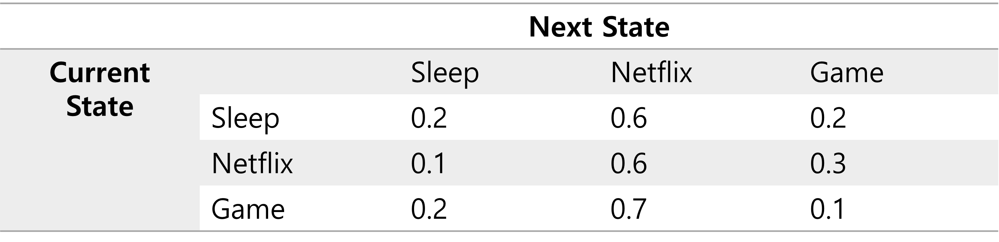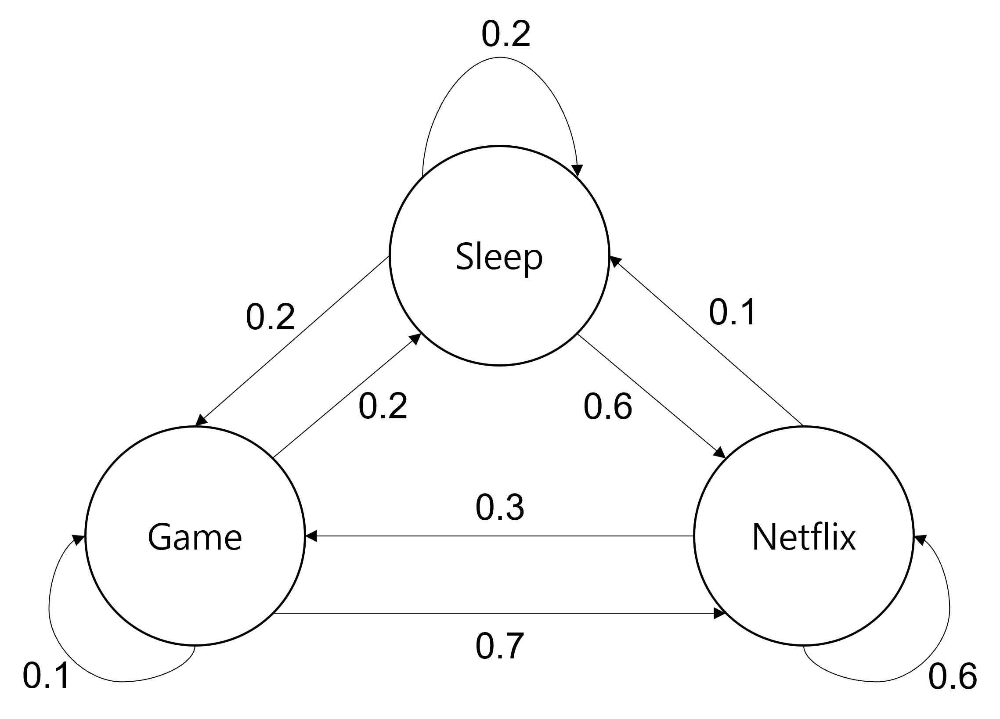

With this example, we can assume the question like this: "Starting from the state: sleep, what is the probability that Alice will be watching Netflix at the end of a sad 2-day duration?"

How to solve this problem using Markov chian? Let's try to code in Python

In [ ]:
import numpy as np
import random as rm

In [ ]:
# The statespace 
states = ["Sleep","Game","Netflix"]

# Possible sequences of events
transitionName = [["SS","SN","SG"],["NS","NN","NG"],["GS","GN","GG"]]

# Probabilities matrix (transition matrix)
transitionMatrix = [[0.2,0.6,0.2],[0.1,0.6,0.3],[0.2,0.7,0.1]]

Make sure the probabilities sum up to 1. 

In [ ]:
if sum(transitionMatrix[0])+sum(transitionMatrix[1])+sum(transitionMatrix[1]) != 3:
    print("Somewhere, something went wrong. Transition matrix, perhaps?")
else: print("All is gonna be okay, you should move on!! ;)")

In [ ]:
# A function that implements the Markov model to forecast the state/mood.
def activity_forecast(days):
    # Choose the starting state
    activityToday = "Sleep"
    print("Start state: " + activityToday)
    # Shall store the sequence of states taken. So, this only has the starting state for now.
    activityList = [activityToday]
    i = 0
    # To calculate the probability of the activityList
    prob = 1
    while i != days:
        if activityToday == "Sleep":
            change = np.random.choice(transitionName[0],replace=True,p=transitionMatrix[0])
            if change == "SS":
                prob = prob * 0.2
                activityList.append("Sleep")
                pass
            elif change == "SN":
                prob = prob * 0.6
                activityToday = "Netflix"
                activityList.append("Netflix")
            else:
                prob = prob * 0.2
                activityToday = "Game"
                activityList.append("Game")
        elif activityToday == "Netflix":
            change = np.random.choice(transitionName[1],replace=True,p=transitionMatrix[1])
            if change == "NN":
                prob = prob * 0.5
                activityList.append("Netflix")
                pass
            elif change == "NS":
                prob = prob * 0.2
                activityToday = "Sleep"
                activityList.append("Sleep")
            else:
                prob = prob * 0.3
                activityToday = "Game"
                activityList.append("Game")
        elif activityToday == "Game":
            change = np.random.choice(transitionName[2],replace=True,p=transitionMatrix[2])
            if change == "GG":
                prob = prob * 0.1
                activityList.append("Game")
                pass
            elif change == "GS":
                prob = prob * 0.2
                activityToday = "Sleep"
                activityList.append("Sleep")
            else:
                prob = prob * 0.7
                activityToday = "Netflix"
                activityList.append("Netflix")
        i += 1  
    print("Possible states: " + str(activityList))
    print("End state after "+ str(days) + " days: " + activityToday)
    print("Probability of the possible sequence of states: " + str(prob))

# Function that forecasts the possible state for the next 2 days
activity_forecast(2)

You get a random set of transitions possible along with the probability of it happening, starting from state: Sleep. Extend the program further to maybe iterate it for a couple of hundred times with the same starting state, you can then see the expected probability of ending at any particular state along with its probability. Let's rewrite the function activity_forecast and add a fresh set of loops to do this...

In [ ]:
def activity_forecast(days):
    # Choose the starting state
    activityToday = "Sleep"
    activityList = [activityToday]
    i = 0
    prob = 1
    while i != days:
        if activityToday == "Sleep":
            change = np.random.choice(transitionName[0],replace=True,p=transitionMatrix[0])
            if change == "SS":
                prob = prob * 0.2
                activityList.append("Sleep")
                pass
            elif change == "SN":
                prob = prob * 0.6
                activityToday = "Netflix"
                activityList.append("Netflix")
            else:
                prob = prob * 0.2
                activityToday = "Game"
                activityList.append("Game")
        elif activityToday == "Netflix":
            change = np.random.choice(transitionName[1],replace=True,p=transitionMatrix[1])
            if change == "NN":
                prob = prob * 0.5
                activityList.append("Netflix")
                pass
            elif change == "NS":
                prob = prob * 0.2
                activityToday = "Sleep"
                activityList.append("Sleep")
            else:
                prob = prob * 0.3
                activityToday = "Game"
                activityList.append("Game")
        elif activityToday == "Game":
            change = np.random.choice(transitionName[2],replace=True,p=transitionMatrix[2])
            if change == "GG":
                prob = prob * 0.1
                activityList.append("Game")
                pass
            elif change == "GS":
                prob = prob * 0.2
                activityToday = "Sleep"
                activityList.append("Sleep")
            else:
                prob = prob * 0.7
                activityToday = "Netflix"
                activityList.append("Netflix")
        i += 1    
    return activityList

# To save every activityList
list_activity = []
count = 0

# `Range` starts from the first count up until but excluding the last count
for iterations in range(1,10000):
        list_activity.append(activity_forecast(2))

# Check out all the `activityList` we collected    
#print(list_activity)

# Iterate through the list to get a count of all activities ending in state:'Netflix'
for smaller_list in list_activity:
    if(smaller_list[2] == "Netflix"):
        count += 1

# Calculate the probability of starting from state:'Sleep' and ending at state:'Netflix'
percentage = (count/10000) * 100
print("The probability of starting at state:'Sleep' and ending at state:'Netflix'= " + str(percentage) + "%")

Reference
https://www.datacamp.com/community/tutorials/markov-chains-python-tutorial#dtmc

## Reinforcement Learning Using Monte Carlo Sampling

As discussed in class, one simple approach to solving the reinforcement learning problem is to use Monte Carlo sampling. Here, we show how to do this in two simple environments. While this approach can be successful, it is computationally costly and does not scale well on games with large action and/or state spaces. 

The outline for the algorithm is:

1. Initialize the policy and value function
2. Start by generating an episode according to the current policy <br>
  a. Keep track of the states encountered during that episode
3. Select a state in 2.a <br>
  a. Add to a list the return received after first occurrence of this state <br>
  b. Average over all returns <br>
  c. Set the value of the state as that computed average
4. Repeat step 3
5. Repeat 2-4 until satisfied

## A Note on OpenAI gym

[OpenAI gym](https://gym.openai.com/docs/) was created as a space for reinforcement learning research. It has many different environments (games) from simple grid-world problems to robotic hand manipulation. 

All the environments were built in the same way, with the same output parameters (such as action_space, observation_space.n, etc) such that code from one environment can easily be ported to another. 

## Environment 1: Frozen Lake

The Frozen Lake game comes from the Open AI gym library, [and more information can be found here.](https://gym.openai.com/envs/FrozenLake-v0/)


The agent controls the movement of a character in a grid world. Some tiles of the grid are walkable, and others lead to the agent falling into the water. Additionally, the movement direction of the agent is uncertain and only partially depends on the chosen direction. The agent is rewarded for finding a walkable path to a goal tile.


You receive a reward of 1 if you reach the goal (in any number of steps), and 0 otherwise.

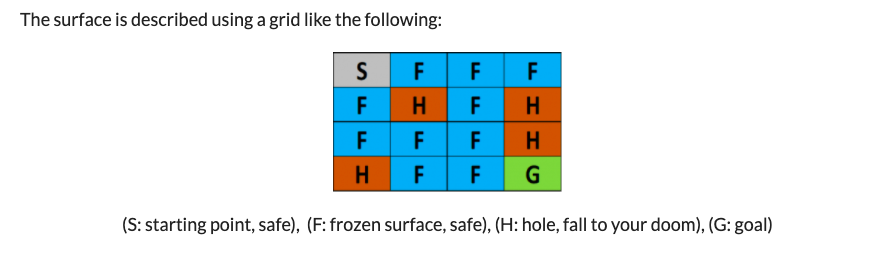

In [ ]:
"""
General purpose Monte Carlo model for training on-policy methods.
"""
from copy import deepcopy
import numpy as np

class FiniteMCModel:
    def __init__(self, state_space, action_space, gamma=1.0, epsilon=0.1):
        """MCModel takes in state_space and action_space (finite) 
        Arguments
        ---------
        
        state_space: int OR list[observation], where observation is any hashable type from env's obs.
        action_space: int OR list[action], where action is any hashable type from env's actions.
        gamma: float, discounting factor.
        epsilon: float, epsilon-greedy parameter.
        
        If the parameter is an int, then we generate a list, and otherwise we generate a dictionary.
        >>> m = FiniteMCModel(2,3,epsilon=0)
        >>> m.Q
        [[0, 0, 0], [0, 0, 0]]
        >>> m.Q[0][1] = 1
        >>> m.Q
        [[0, 1, 0], [0, 0, 0]]
        >>> m.pi(1, 0)
        1
        >>> m.pi(1, 1)
        0
        >>> d = m.generate_returns([(0,0,0), (0,1,1), (1,0,1)])
        >>> assert(d == {(1, 0): 1, (0, 1): 2, (0, 0): 2})
        >>> m.choose_action(m.pi, 1)
        0
        """
        self.gamma = gamma
        self.epsilon = epsilon
        self.Q = None
        if isinstance(action_space, int):
            self.action_space = np.arange(action_space)
            actions = [0]*action_space
            # Action representation
            self._act_rep = "list"
        else:
            self.action_space = action_space
            actions = {k:0 for k in action_space}
            self._act_rep = "dict"
        if isinstance(state_space, int):
            self.state_space = np.arange(state_space)
            self.Q = [deepcopy(actions) for _ in range(state_space)]
        else:
            self.state_space = state_space
            self.Q = {k:deepcopy(actions) for k in state_space}
            
        # Frequency of state/action.
        self.Ql = deepcopy(self.Q)

        
    def pi(self, action, state):
        """pi(a,s,A,V) := pi(a|s)
        We take the argmax_a of Q(s,a).
        q[s] = [q(s,0), q(s,1), ...]
        """
        if self._act_rep == "list":
            if action == np.argmax(self.Q[state]):
                return 1
            return 0
        elif self._act_rep == "dict":
            if action == max(self.Q[state], key=self.Q[state].get):
                return 1
            return 0
    
    
    def b(self, action, state):
        """b(a,s,A) := b(a|s) 
        Sometimes you can only use a subset of the action space
        given the state.

        Randomly selects an action from a uniform distribution.
        """
        return self.epsilon/len(self.action_space) + (1-self.epsilon) * self.pi(action, state)

    
    def generate_returns(self, ep):
        """Backup on returns per time period in an epoch
        Arguments
        ---------
        
        ep: [(observation, action, reward)], an episode trajectory in chronological order.
        """
        G = {} # return on state
        C = 0 # cumulative reward
        for tpl in reversed(ep):
            observation, action, reward = tpl
            G[(observation, action)] = C = reward + self.gamma*C
        return G
    
    
    def choose_action(self, policy, state):
        """Uses specified policy to select an action randomly given the state.
        Arguments
        ---------
        
        policy: function, can be self.pi, or self.b, or another custom policy.
        state: observation of the environment.
        """
        probs = [policy(a, state) for a in self.action_space]
        return np.random.choice(self.action_space, p=probs)

    
    def update_Q(self, ep):
        """Performs a action-value update.
        Arguments
        ---------
        
        ep: [(observation, action, reward)], an episode trajectory in chronological order.
        """
        # Generate returns, return ratio
        G = self.generate_returns(ep)
        for s in G:
            state, action = s
            q = self.Q[state][action]
            self.Ql[state][action] += 1
            N = self.Ql[state][action]
            self.Q[state][action] = q * N/(N+1) + G[s]/(N+1)
    
    def score(self, env, policy, n_samples=1000):
        """Evaluates a specific policy with regards to the env.
        Arguments
        ---------
        
        env: an openai gym env, or anything that follows the api.
        policy: a function, could be self.pi, self.b, etc.
        """
        rewards = []
        for _ in range(n_samples):
            observation = env.reset()
            cum_rewards = 0
            while True:
                action = self.choose_action(policy, observation)
                observation, reward, done, _ = env.step(action)
                cum_rewards += reward
                if done:
                    rewards.append(cum_rewards)
                    break
        return np.mean(rewards)
    

In [ ]:
import gym
import numpy as np
import matplotlib.pyplot as plt
import timeit


env = gym.make("FrozenLake-v0")

episodes = 100_000


S = env.observation_space.n 
A = env.action_space.n
m = FiniteMCModel(S, A, epsilon=.5)
returns_over_time = []
start = timeit.default_timer()
for i in range(1, episodes+1):
    ep = []
    observation = env.reset()
    while True:
        # Choosing behavior policy
        action = m.choose_action(m.b, observation)

        # Run simulation
        next_observation, reward, done, _ = env.step(action)
        ep.append((observation, action, reward))
        observation = next_observation
        if done:
            break

    m.update_Q(ep)
    # Decaying epsilon, reach optimal policy
    m.epsilon = max((episodes-i)/episodes, 0.1)

    if i % 1000 == 0:
      returns_over_time.append(m.score(env, m.pi, n_samples=1000))


stop = timeit.default_timer()
print('Time: ', stop - start) 

# maximum (optimal) reward is 1
print("Final expected returns : {}".format(m.score(env, m.pi, n_samples=1000)))



Here, we see a pretty good result after about 7.5 minutes (100,000 episodes). If we continue to run episodes we should see slightly improved performance. We can also try to tune epsilon and our decay rate to obtain the optimal policy quicker, or if we are not finding the optimal policy, explore more.

## Environment #2: Frozen Lake 8x8

This environment is identical to the first, except that now instead of a 4x4 grid world, we have an 8x8 grid world. This drastically increases the number of states (but not the number of actions). 

In [ ]:
import gym
import numpy as np
import matplotlib.pyplot as plt
import timeit


env = gym.make("FrozenLake8x8-v0")

episodes = 100_000


S = env.observation_space.n 
A = env.action_space.n
m = FiniteMCModel(S, A, epsilon=.5)
returns_over_time = []
start = timeit.default_timer()
for i in range(1, episodes+1):
    ep = []
    observation = env.reset()
    while True:
        # Choosing behavior policy
        action = m.choose_action(m.b, observation)

        # Run simulation
        next_observation, reward, done, _ = env.step(action)
        ep.append((observation, action, reward))
        observation = next_observation
        if done:
            break

    m.update_Q(ep)
    # Decaying epsilon, reach optimal policy
    m.epsilon = max((episodes-i)/episodes, 0.1)

    if i % 1000 == 0:
      returns_over_time.append(m.score(env, m.pi, n_samples=1000))


stop = timeit.default_timer()
print('Time: ', stop - start) 

# maximum (optimal) reward is 1
print("Final expected returns : {}".format(m.score(env, m.pi, n_samples=1000)))



Here, in order to run the same number of episodes, it takes almost 3x as long. And due to the added complexity of the game, we obtain far worse performance. 

One thing normally done in practice to ensure proper state/action space exploration is to add an epsilon-greedy policy. This is often referred to in discussions about [exploration vs exploitation](https://www.youtube.com/watch?v=sGuiWX07sKw&list=PLqYmG7hTraZDM-OYHWgPebj2MfCFzFObQ&index=9).

Now, instead of purely random sampling, we choose some epsilon value (say 0.1) and then select a number, n, uniformly from [0,1]. If n < epsilon, we then choose our action randomly. If n >= epsilon, we choose the action given by our policy. A higher epsilon means more random actions, and therefore more "exploration" of the environment. A lower epslion means fewer random actions, and more "exploitation" (ie, choosing the best action). 

In practice, epsilon is normally set at an initial value and then decays over time. 

# Lecture 26: Deep RL

## Model-based RL

If an algorithm that computes optimal policy for a RL problem assumes the transition probability $p(s' | s, a)$ is known, we call it a model-based  algorithm.

The following are two model-based algorithms: Value Iteration and Policy Iteration (A good comparison between these two algorithms can be found [here](https://www.baeldung.com/cs/ml-value-iteration-vs-policy-iteration)).



### 1. Value Iteration

The following code example is adapted from [Massimo Caccia's colab](https://colab.research.google.com/github/lcharlin/80-629/blob/master/week12-MDPs/value_and_policy_iteration_solution.ipynb#scrollTo=ayALGYKaEHBR)

Original author: Massimo Caccia massimo.p.caccia@gmail.com <br>

You can find details about the Value Iteration algorithm at slide 46 of the [slide](http://www.cs.toronto.edu/~lcharlin/courses/80-629/slides_rl.pdf) deck. <br>

The algorithm will be tested on a simple Gridworld similar to the one presented at slide 12.

Let's set some variables. <br>
- `SMALL_ENOUGH` is a threshold we will utilize to determine the convergence of value iteration<br>
- `GAMMA` is the discount factor denoted $\gamma$ in the slides (see slide 36) <br>
- `ALL_POSSIBLE_ACTIONS` are the actions you can take in the GridWold, as in slide 12. In this simple grid world, we will have four actions: Up, Down, Right, Left. <br>
- `NOISE_PROB` defines how stochastic the environement is. It is the probability that the environment takes you where a random action would. 

In [ ]:
#imports

!wget -nc https://raw.githubusercontent.com/lcharlin/80-629/master/week12-MDPs/gridWorldGame.py
    
import numpy as np
from gridWorldGame import standard_grid, negative_grid, print_values, print_policy

File ‘gridWorldGame.py’ already there; not retrieving.



In [ ]:
SMALL_ENOUGH = 1e-3 # threshold to declare convergence
GAMMA = 0.9         # discount factor
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R') # Up, Down, Left, Right
NOISE_PROB = 0.1    # Probability of the agent not reaching it's intended goal after an action

Now we will set up a the Gridworld. <br>


In [ ]:
grid = standard_grid(noise_prob=NOISE_PROB)
print("rewards:")
print_values(grid.rewards, grid)

rewards:
---------------------------
 0.00| 0.00| 0.00| 1.10|
---------------------------
 0.00| 0.00| 0.00|-1.00|
---------------------------
 0.00| 0.00| 0.00| 0.00|


There are three absorbing states: (0,3),(1,3), and (1,1)

Next, we will define a random inital policy $\pi$. <br>
Remember that a policy maps states to actions $\pi : S \rightarrow A$.

In [ ]:
policy = {}
for s in grid.actions.keys():
    policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)

# initial policy
print("initial policy:")
print_policy(policy, grid)

initial policy:
---------------------------
  R  |  L  |  R  | N/A |
---------------------------
  D  | N/A |  D  | N/A |
---------------------------
  R  |  R  |  U  |  D  |


Note that there is policy in the absorbing/terminal states

Next, we will randomly initialize the value fonction

In [ ]:
np.random.seed(1234) # make sure this is reproducable

V = {}
states = grid.all_states()
for s in states:
    # V[s] = 0
    if s in grid.actions:
        V[s] = np.random.random()
    else:
        # terminal state
        V[s] = 0

# initial value for all states in grid
print_values(V, grid)

---------------------------
 0.44| 0.19| 0.96| 0.00|
---------------------------
 0.80| 0.00| 0.62| 0.00|
---------------------------
 0.78| 0.79| 0.28| 0.27|


Note that we set to Null the values of the terminal states. <br> 
For the print_values() function to compile, we set them to 0.

For each iteration, each state s need to have to be update with the formula:

$$
V(s) = \underset{a}{max}\big\{ \sum_{s',a}  p(s'|s,a)(r + \gamma*V(s') \big\}
$$
Note that in the current gridWorld, p(s'|s,a) is deterministic. <br>
Also, remember that in value iteration, the policy is **implicit**. <br> Thus, you don't need to update it at every iteration. <br>
Run the algorithm until convergence.

In [ ]:
iteration=0
while True:
    print("VI iteration %d: " % iteration)
    print_values(V, grid)
    print("\n\n")
  
    biggest_change = 0
    for s in states:
        old_v = V[s]

        # V(s) only has value if it's not a terminal state
        if s in policy:
            new_v = float('-inf')

            # for each action
            for a in ALL_POSSIBLE_ACTIONS:
                grid.set_state(s)
                r = grid.move(a)
                sprime = grid.current_state()
                #  - compute this V[s] = max[a]{ sum[s',r] { p(s',r|s,a)[r + gamma*V[s']] } }
                v = r + GAMMA * V[sprime]
                if v > new_v: # is this the best action so far
                    new_v = v
            V[s] = new_v
            biggest_change = max(biggest_change, np.abs(old_v - V[s]))

    print('\t biggest change is: %f \n\n' % biggest_change)
    if biggest_change < SMALL_ENOUGH:
        break
    iteration+=1
print_values(V, grid)

VI iteration 0: 
---------------------------
 0.44| 0.19| 0.96| 0.00|
---------------------------
 0.80| 0.00| 0.62| 0.00|
---------------------------
 0.78| 0.79| 0.28| 0.27|



	 biggest change is: 0.670806 


VI iteration 1: 
---------------------------
 0.78| 0.86| 1.10| 0.00|
---------------------------
 0.72| 0.00| 0.86| 0.00|
---------------------------
 0.72| 0.71| 0.78| 0.25|



	 biggest change is: 0.449666 


VI iteration 2: 
---------------------------
 0.89| 0.99| 1.10| 0.00|
---------------------------
 0.80| 0.00| 0.70| 0.00|
---------------------------
 0.65| 0.70| 0.63| 0.70|



	 biggest change is: 0.291516 


VI iteration 3: 
---------------------------
 0.89| 0.99| 0.99| 0.00|
---------------------------
 0.80| 0.00| 0.99| 0.00|
---------------------------
 0.72| 0.63| 0.89| 0.63|



	 biggest change is: 0.173265 


VI iteration 4: 
---------------------------
 0.80| 0.89| 1.10| 0.00|
---------------------------
 0.72| 0.00| 0.89| 0.00|
---------------------------
 

Now that the value function is optimized, use it to find the optimal policy.

In [ ]:
deterministic_grid = standard_grid(noise_prob=0.)

for s in policy.keys():
    best_a = None
    best_value = float('-inf')
    # loop through all possible actions to find the best current action
    for a in ALL_POSSIBLE_ACTIONS:
        deterministic_grid.set_state(s)
        r = deterministic_grid.move(a)
        v = r + GAMMA * V[deterministic_grid.current_state()]
        if v > best_value:
            best_value = v
            best_a = a
    policy[s] = best_a

Now print your policy and make sure it leads to the upper-right corner which is the termnial state returning the most rewards.

In [ ]:
print("values:")
print_values(V, grid)
print("\npolicy:")
print_policy(policy, grid)

values:
---------------------------
 0.89| 0.99| 1.10| 0.00|
---------------------------
 0.80| 0.00| 0.99| 0.00|
---------------------------
 0.72| 0.80| 0.89| 0.80|

policy:
---------------------------
  R  |  R  |  R  | N/A |
---------------------------
  U  | N/A |  U  | N/A |
---------------------------
  U  |  R  |  U  |  L  |


### 2. Policy Iteration

The following code example is adapted from [Massimo Caccia's colab](https://colab.research.google.com/github/lcharlin/80-629/blob/master/week12-MDPs/value_and_policy_iteration_solution.ipynb#scrollTo=ayALGYKaEHBR)

Original author: Massimo Caccia massimo.p.caccia@gmail.com <br>

You can find details about the Policy Iteration algorithm at slide 47 of the slide deck. <br>
The algorithm will be tested on a simple Gridworld similar to the one presented at slide 12. <br>
This Gridworld is however simpler because the MDP is deterministic. <br>

First we will define a random inital policy. <br>
Remember that a policy maps states to actions.

In [ ]:
#imports

!wget -nc https://raw.githubusercontent.com/lcharlin/80-629/master/week12-MDPs/gridWorldGame.py
    
import numpy as np
from gridWorldGame import standard_grid, negative_grid, print_values, print_policy

File ‘gridWorldGame.py’ already there; not retrieving.



In [ ]:
policy = {}
for s in grid.actions.keys():
    policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)

# initial policy
print("initial policy:")
print_policy(policy, grid)

initial policy:
---------------------------
  U  |  L  |  R  | N/A |
---------------------------
  R  | N/A |  U  | N/A |
---------------------------
  U  |  D  |  D  |  R  |


Next, we will randomly initialize the value function

In [ ]:
np.random.seed(1234)

# initialize V(s) - value function
V = {}
states = grid.all_states()
for s in states:
    if s in grid.actions:
        V[s] = np.random.random()
    else:
        # terminal state
        V[s] = 0

# initial value for all states in grid
print_values(V, grid)

---------------------------
 0.44| 0.19| 0.96| 0.00|
---------------------------
 0.80| 0.00| 0.62| 0.00|
---------------------------
 0.78| 0.79| 0.28| 0.27|


Note that we set to Null the values of the terminal states. <br> 
For the print_values() function to compile, we set them to 0.

The algorithm works in two phases. <br>
First, in the *policy evaluation* phase, the value function is update with the formula:

$$
V^\pi(s) =  \sum_{s'}  p(s'|s,\pi(s))(r + \gamma*V^\pi(s') 
$$

Second, in the *policy improvement* step, the policy is updated with the formula:

$$
\pi'(s) = \underset{a}{arg max}\big\{ \sum_{s'}  p(s'|s,a)(r + \gamma*V^\pi(s') \big\}
$$

Note that in the current gridWorld, p(s'|s,a) is deterministic. <br>
Run the algorithm until convergence.

In [ ]:
iteration=0
# repeat until the policy does not change
while True:
    print("values (iteration %d)" % iteration)
    print_values(V, grid)
    print("policy (iteration %d)" % iteration)
    print_policy(policy, grid)
    print('\n\n')

    # 1. policy evaluation step
    # this implementation does multiple policy-evaluation steps
    # this is different than in the algorithm from the slides 
    # which does a single one.
    while True:
        biggest_change = 0
        for s in states:
            old_v = V[s]

            # V(s) only has value if it's not a terminal state
            if s in policy:
                a = policy[s]
                grid.set_state(s)
                r = grid.move(a) # reward
                sprime = grid.current_state() # s' 
                V[s] = r + GAMMA * V[sprime]
            biggest_change = max(biggest_change, np.abs(old_v - V[s]))
        if biggest_change < SMALL_ENOUGH:
            break

    #2. policy improvement step
    is_policy_converged = True
    for s in states:
        if s in policy:
            old_a = policy[s]
            new_a = None
            best_value = float('-inf')
            # loop through all possible actions to find the best current action
            for a in ALL_POSSIBLE_ACTIONS:
                grid.set_state(s)
                r = grid.move(a)
                sprime = grid.current_state() 
                v = r + GAMMA * V[sprime]
                if v > best_value:
                    best_value = v
                    new_a = a
            if new_a is None: 
                print('problem')
            policy[s] = new_a
            if new_a != old_a:
                is_policy_converged = False

    if is_policy_converged:
        break
    iteration+=1


values (iteration 0)
---------------------------
 0.44| 0.19| 0.96| 0.00|
---------------------------
 0.80| 0.00| 0.62| 0.00|
---------------------------
 0.78| 0.79| 0.28| 0.27|
policy (iteration 0)
---------------------------
  U  |  L  |  R  | N/A |
---------------------------
  R  | N/A |  U  | N/A |
---------------------------
  U  |  D  |  D  |  R  |



values (iteration 1)
---------------------------
 0.00| 0.00| 1.10| 0.00|
---------------------------
 0.00| 0.00| 0.99| 0.00|
---------------------------
 0.00|-0.00|-0.00|-0.00|
policy (iteration 1)
---------------------------
  U  |  R  |  R  | N/A |
---------------------------
  U  | N/A |  U  | N/A |
---------------------------
  U  |  L  |  U  |  D  |



values (iteration 2)
---------------------------
 0.00| 0.99| 1.10| 0.00|
---------------------------
 0.00| 0.00| 0.99| 0.00|
---------------------------
 0.00| 0.00| 0.89|-0.00|
policy (iteration 2)
---------------------------
  R  |  R  |  R  | N/A |
--------------------

Now print your policy and make sure it leads to the upper-right corner which is the termnial state returning the most rewards.

In [ ]:
print("final values:")
print_values(V, grid)
print("final policy:")
print_policy(policy, grid)

final values:
---------------------------
 0.89| 0.99| 1.10| 0.00|
---------------------------
 0.80| 0.00| 0.99| 0.00|
---------------------------
 0.72| 0.80| 0.89| 0.80|
final policy:
---------------------------
  R  |  R  |  L  | N/A |
---------------------------
  U  | N/A |  U  | N/A |
---------------------------
  U  |  R  |  U  |  L  |


## Model-free RL

If an algorithm that computes optimal policy for a RL problem assumes the transition probability $p(s' | s, a)$ is unknown, we call it a model-free  algorithm.

In a model-free algorithm, $p(s' | s, a)$ is estimated by sampling, which takes in the form that the agent enacts its (not necessarily optimal) policy to sample trajectories $\{s_0, a_0, s_1, a_1, \ldots\}$ and estimate $p(s' | s, a)$ afterwards.

The following is a model-free algorihtm called Q-learning. When the learning rate in Q-learning is set to 1, it becomes a version of policy iteration where $Q(s,a)$ is tracked, $V(s)$ is computed from $Q(s,a)$ using $V(s) = \max_a Q(s,a)$, and $p(s' | s, a)$ is estimated with one sample.

### Q-Learning

The following code example is adapted from [Thomas Simonini's colab](https://colab.research.google.com/github/simoninithomas/Deep_reinforcement_learning_Course/blob/master/Q_Learning_with_FrozenLakev2.ipynb#scrollTo=5aQKQMJTJBPH)

Original author: Thomas Simonini


#### Q Learning with FrozenLake 4x4 

In this Notebook, we'll implement an agent <b>that plays FrozenLake.</b>

![alt text](http://simoninithomas.com/drlc/Qlearning/frozenlake4x4.png)

The goal of this game is <b>to go from the starting state (S) to the goal state (G)</b> by walking only on frozen tiles (F) and avoid holes (H). However, the ice is slippery, **so you won't always move in the direction you intend (stochastic environment)**

Thanks to [lukewys](https://github.com/lukewys) for his help

##### Prerequisites 🏗️
Before diving on the notebook **you need to understand**:
- The foundations of Reinforcement learning (MC, TD, Rewards hypothesis...) [Article](https://medium.freecodecamp.org/an-introduction-to-reinforcement-learning-4339519de419)
- Q-learning [Article](https://medium.freecodecamp.org/diving-deeper-into-reinforcement-learning-with-q-learning-c18d0db58efe)
- In the [video version](https://www.youtube.com/watch?v=q2ZOEFAaaI0)  we implemented a Q-learning agent that learns to play OpenAI Taxi-v2 🚕 with Numpy.

##### Step -1: Install the dependencies on Google Colab

In [ ]:
!pip install numpy
!pip install gym

##### Step 0: Import the dependencies 📚
We use 3 libraries:
- `Numpy` for our Qtable
- `OpenAI Gym` for our FrozenLake Environment
- `Random` to generate random numbers

In [ ]:
import numpy as np
import gym
import random

##### Step 1: Create the environment 🎮
- Here we'll create the FrozenLake 8x8 environment. 
- OpenAI Gym is a library <b> composed of many environments that we can use to train our agents.</b>
- In our case we choose to use Frozen Lake.

In [ ]:
env = gym.make("FrozenLake-v0")

##### Step 2: Create the Q-table and initialize it 🗄️
- Now, we'll create our Q-table, to know how much rows (states) and columns (actions) we need, we need to calculate the action_size and the state_size
- OpenAI Gym provides us a way to do that: `env.action_space.n` and `env.observation_space.n`

In [ ]:
action_size = env.action_space.n
state_size = env.observation_space.n

In [ ]:
# Create our Q table with state_size rows and action_size columns (64x4)
qtable = np.zeros((state_size, action_size))
print(qtable)

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


##### Step 3: Create the hyperparameters ⚙️
- Here, we'll specify the hyperparameters

In [ ]:
total_episodes = 20000       # Total episodes
learning_rate = 0.7          # Learning rate
max_steps = 99               # Max steps per episode
gamma = 0.95                 # Discounting rate

# Exploration parameters
epsilon = 1.0                 # Exploration rate
max_epsilon = 1.0             # Exploration probability at start
min_epsilon = 0.01            # Minimum exploration probability 
decay_rate = 0.005            # Exponential decay rate for exploration prob

##### Step 4: The Q learning algorithm 🧠
- Now we implement the Q learning algorithm:
  ![alt text](http://simoninithomas.com/drlc/Qlearning//qtable_algo.png)


In [ ]:
# List of rewards
rewards = []

# 2 For life or until learning is stopped
for episode in range(total_episodes):
    # Reset the environment
    state = env.reset()
    step = 0
    done = False
    total_rewards = 0
    
    for step in range(max_steps):
        # 3. Choose an action a in the current world state (s)
        ## First we randomize a number
        exp_exp_tradeoff = random.uniform(0, 1)
        
        ## If this number > greater than epsilon --> exploitation (taking the biggest Q value for this state)
        if exp_exp_tradeoff > epsilon:
            action = np.argmax(qtable[state,:])
            #print(exp_exp_tradeoff, "action", action)

        # Else doing a random choice --> exploration
        else:
            action = env.action_space.sample()
            #print("action random", action)
            
        
        # Take the action (a) and observe the outcome state(s') and reward (r)
        new_state, reward, done, info = env.step(action)

        # Update Q(s,a):= Q(s,a) + lr [R(s,a) + gamma * max Q(s',a') - Q(s,a)]
        # qtable[new_state,:] : all the actions we can take from new state
        qtable[state, action] = qtable[state, action] + learning_rate * (reward + gamma * np.max(qtable[new_state, :]) - qtable[state, action])
        
        total_rewards += reward
        
        # Our new state is state
        state = new_state
        
        # If done (if we're dead) : finish episode
        if done == True: 
            break
        
    # Reduce epsilon (because we need less and less exploration)
    epsilon = min_epsilon + (max_epsilon - min_epsilon)*np.exp(-decay_rate*episode) 
    rewards.append(total_rewards)
    

print ("Score over time: " +  str(sum(rewards)/total_episodes))
print(qtable)

Score over time: 0.49795
[[1.01193825e-01 1.07254381e-01 1.04982130e-01 1.08867379e-01]
 [1.09769246e-03 5.13988407e-02 4.25630069e-03 1.02469296e-01]
 [1.28368016e-02 1.13115070e-02 2.12879957e-02 7.58268068e-02]
 [1.35858277e-02 2.69996133e-03 1.64752539e-02 6.12685939e-02]
 [9.48312153e-02 3.07982896e-02 9.32422354e-03 9.48164983e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.95259001e-06 1.81981726e-05 8.69814936e-02 4.42652807e-06]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [5.92199535e-02 6.67074963e-02 5.68230558e-02 3.97649093e-01]
 [5.64008599e-02 6.63737046e-01 3.84724008e-04 4.20933164e-02]
 [8.58930402e-01 2.08203260e-02 2.79901323e-03 1.30312395e-04]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [3.36977685e-02 1.31119912e-01 7.75510149e-01 6.96931994e-02]
 [5.32240651e-01 9.88459442e-01 4.65620510e-01 2.83521573e-01]
 [0.00000000e+00 0.00000000e+0

##### Step 5: Use our Q-table to play FrozenLake ! 👾
- After 10 000 episodes, our Q-table can be used as a "cheatsheet" to play FrozenLake"
- By running this cell you can see our agent playing FrozenLake.

In [ ]:
env.reset()

for episode in range(5):
    state = env.reset()
    step = 0
    done = False
    print("****************************************************")
    print("EPISODE ", episode)

    for step in range(max_steps):
        
        # Take the action (index) that have the maximum expected future reward given that state
        action = np.argmax(qtable[state,:])
        
        new_state, reward, done, info = env.step(action)
        
        if done:
            # Here, we decide to only print the last state (to see if our agent is on the goal or fall into an hole)
            env.render()
            if new_state == 15:
                print("We reached our Goal 🏆")
            else:
                print("We fell into a hole ☠️")
            
            # We print the number of step it took.
            print("Number of steps", step)
            
            break
        state = new_state
env.close()

****************************************************
EPISODE  0
****************************************************
EPISODE  1
****************************************************
EPISODE  2
****************************************************
EPISODE  3
****************************************************
EPISODE  4


## DRL: Relaxing state to be continuous

One advancement of DRL compared to classical RL is that it can solve RL problems with continuous state space and/or continuous action space.

The following is an example RL problem where the state space is continuous. It is solved using Q-learning where the Q-function is parametrized as a Deep Q-network.

### Deep Q-network (DQN)

The following code example is adapted from [TF-Agents's colab](https://colab.research.google.com/github/tensorflow/agents/blob/master/docs/tutorials/1_dqn_tutorial.ipynb#scrollTo=pmDI-h7cI0tI).

Original authors:
* James Davidson
* Ethan Holly
* Toby Boyd
* Summer Yue
* Robert Ormandi
* Kuang-Huei Lee
* Alexa Greenberg
* Amir Yazdanbakhsh
* Yao Lu
* Gaurav Jain
* Christof Angermueller
* Mark Daoust
* Adam Wood

Copyright 2021 The TF-Agents Authors.

```python
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
```

#### Introduction


This example shows how to train a [DQN (Deep Q Networks)](https://storage.googleapis.com/deepmind-media/dqn/DQNNaturePaper.pdf)  agent on the Cartpole environment using the TF-Agents library.

![Cartpole environment](https://raw.githubusercontent.com/tensorflow/agents/master/docs/tutorials/images/cartpole.png)

It will walk you through all the components in a Reinforcement Learning (RL) pipeline for training, evaluation and data collection.


To run this code live, click the 'Run in Google Colab' link above.


#### Setup

If you haven't installed the following dependencies, run:

In [ ]:
!sudo apt-get update
!sudo apt-get install -y xvfb ffmpeg freeglut3-dev
!pip install 'imageio==2.4.0'
!pip install pyvirtualdisplay
!pip install tf-agents[reverb]
!pip install pyglet

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:13 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:15 http://ppa

In [ ]:
from __future__ import absolute_import, division, print_function

import base64
import imageio
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
import pyvirtualdisplay
import reverb

import tensorflow as tf

from tf_agents.agents.dqn import dqn_agent
from tf_agents.drivers import py_driver
from tf_agents.environments import suite_gym
from tf_agents.environments import tf_py_environment
from tf_agents.eval import metric_utils
from tf_agents.metrics import tf_metrics
from tf_agents.networks import sequential
from tf_agents.policies import py_tf_eager_policy
from tf_agents.policies import random_tf_policy
from tf_agents.replay_buffers import reverb_replay_buffer
from tf_agents.replay_buffers import reverb_utils
from tf_agents.trajectories import trajectory
from tf_agents.specs import tensor_spec
from tf_agents.utils import common

RuntimeError: ignored

In [ ]:
# Set up a virtual display for rendering OpenAI gym environments.
display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()

In [ ]:
tf.version.VERSION

'2.7.0'

#### Hyperparameters

In [ ]:
num_iterations = 20000 # @param {type:"integer"}

initial_collect_steps = 100  # @param {type:"integer"}
collect_steps_per_iteration =   1# @param {type:"integer"}
replay_buffer_max_length = 100000  # @param {type:"integer"}

batch_size = 64  # @param {type:"integer"}
learning_rate = 1e-3  # @param {type:"number"}
log_interval = 200  # @param {type:"integer"}

num_eval_episodes = 10  # @param {type:"integer"}
eval_interval = 1000  # @param {type:"integer"}

#### Environment

In Reinforcement Learning (RL), an environment represents the task or problem to be solved. Standard environments can be created in TF-Agents using `tf_agents.environments` suites. TF-Agents has suites for loading environments from sources such as the OpenAI Gym, Atari, and DM Control.

Load the CartPole environment from the OpenAI Gym suite. 

In [ ]:
env_name = 'CartPole-v0'
env = suite_gym.load(env_name)

You can render this environment to see how it looks. A free-swinging pole is attached to a cart.  The goal is to move the cart right or left in order to keep the pole pointing up.

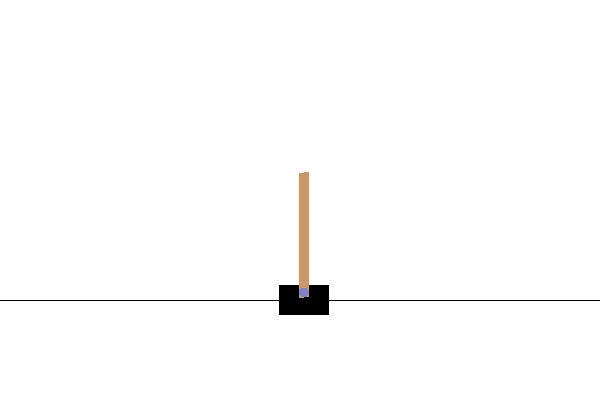

In [ ]:
#@test {"skip": true}
env.reset()
PIL.Image.fromarray(env.render())

The `environment.step` method takes an `action` in the environment and returns a `TimeStep` tuple containing the next observation of the environment and the reward for the action.

The `time_step_spec()` method returns the specification for the `TimeStep` tuple. Its `observation` attribute shows the shape of observations, the data types, and the ranges of allowed values. The `reward` attribute shows the same details for the reward.


In [ ]:
print('Observation Spec:')
print(env.time_step_spec().observation)

Observation Spec:
BoundedArraySpec(shape=(4,), dtype=dtype('float32'), name='observation', minimum=[-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], maximum=[4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38])


In [ ]:
print('Reward Spec:')
print(env.time_step_spec().reward)

Reward Spec:
ArraySpec(shape=(), dtype=dtype('float32'), name='reward')


The `action_spec()` method returns the shape, data types, and allowed values of valid actions.

In [ ]:
print('Action Spec:')
print(env.action_spec())

Action Spec:
BoundedArraySpec(shape=(), dtype=dtype('int64'), name='action', minimum=0, maximum=1)


In the Cartpole environment:

-   `observation` is an array of 4 floats: 
    -   the position and velocity of the cart
    -   the angular position and velocity of the pole 
-   `reward` is a scalar float value
-   `action` is a scalar integer with only two possible values:
    -   `0` — "move left"
    -   `1` — "move right"


In [ ]:
time_step = env.reset()
print('Time step:')
print(time_step)

action = np.array(1, dtype=np.int32)

next_time_step = env.step(action)
print('Next time step:')
print(next_time_step)

Time step:
TimeStep(
{'discount': array(1., dtype=float32),
 'observation': array([ 0.01486274,  0.0327124 , -0.00815726,  0.02528692], dtype=float32),
 'reward': array(0., dtype=float32),
 'step_type': array(0, dtype=int32)})
Next time step:
TimeStep(
{'discount': array(1., dtype=float32),
 'observation': array([ 0.01551699,  0.22795038, -0.00765153, -0.26995853], dtype=float32),
 'reward': array(1., dtype=float32),
 'step_type': array(1, dtype=int32)})


Usually two environments are instantiated: one for training and one for evaluation. 

In [ ]:
train_py_env = suite_gym.load(env_name)
eval_py_env = suite_gym.load(env_name)

The Cartpole environment, like most environments, is written in pure Python. This is converted to TensorFlow using the `TFPyEnvironment` wrapper.

The original environment's API uses Numpy arrays. The `TFPyEnvironment` converts these to `Tensors` to make it compatible with Tensorflow agents and policies.


In [ ]:
train_env = tf_py_environment.TFPyEnvironment(train_py_env)
eval_env = tf_py_environment.TFPyEnvironment(eval_py_env)

#### Agent

The algorithm used to solve an RL problem is represented by an `Agent`. TF-Agents provides standard implementations of a variety of `Agents`, including:

-   [DQN](https://storage.googleapis.com/deepmind-media/dqn/DQNNaturePaper.pdf) (used in this tutorial)
-   [REINFORCE](https://www-anw.cs.umass.edu/~barto/courses/cs687/williams92simple.pdf)
-   [DDPG](https://arxiv.org/pdf/1509.02971.pdf)
-   [TD3](https://arxiv.org/pdf/1802.09477.pdf)
-   [PPO](https://arxiv.org/abs/1707.06347)
-   [SAC](https://arxiv.org/abs/1801.01290)

The DQN agent can be used in any environment which has a discrete action space.

At the heart of a DQN Agent is a `QNetwork`, a neural network model that can learn to predict `QValues` (expected returns) for all actions, given an observation from the environment.

We will use `tf_agents.networks.` to create a `QNetwork`. The network will consist of a sequence of `tf.keras.layers.Dense` layers, where the final layer will have 1 output for each possible action.

In [ ]:
fc_layer_params = (100, 50)
action_tensor_spec = tensor_spec.from_spec(env.action_spec())
num_actions = action_tensor_spec.maximum - action_tensor_spec.minimum + 1

# Define a helper function to create Dense layers configured with the right
# activation and kernel initializer.
def dense_layer(num_units):
  return tf.keras.layers.Dense(
      num_units,
      activation=tf.keras.activations.relu,
      kernel_initializer=tf.keras.initializers.VarianceScaling(
          scale=2.0, mode='fan_in', distribution='truncated_normal'))

# QNetwork consists of a sequence of Dense layers followed by a dense layer
# with `num_actions` units to generate one q_value per available action as
# its output.
dense_layers = [dense_layer(num_units) for num_units in fc_layer_params]
q_values_layer = tf.keras.layers.Dense(
    num_actions,
    activation=None,
    kernel_initializer=tf.keras.initializers.RandomUniform(
        minval=-0.03, maxval=0.03),
    bias_initializer=tf.keras.initializers.Constant(-0.2))
q_net = sequential.Sequential(dense_layers + [q_values_layer])

Now use `tf_agents.agents.dqn.dqn_agent` to instantiate a `DqnAgent`. In addition to the `time_step_spec`, `action_spec` and the QNetwork, the agent constructor also requires an optimizer (in this case, `AdamOptimizer`), a loss function, and an integer step counter.

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

train_step_counter = tf.Variable(0)

agent = dqn_agent.DqnAgent(
    train_env.time_step_spec(),
    train_env.action_spec(),
    q_network=q_net,
    optimizer=optimizer,
    td_errors_loss_fn=common.element_wise_squared_loss,
    train_step_counter=train_step_counter)

agent.initialize()

#### Policies

A policy defines the way an agent acts in an environment. Typically, the goal of reinforcement learning is to train the underlying model until the policy produces the desired outcome.

In this tutorial:

-   The desired outcome is keeping the pole balanced upright over the cart.
-   The policy returns an action (left or right) for each `time_step` observation.

Agents contain two policies: 

-   `agent.policy` — The main policy that is used for evaluation and deployment.
-   `agent.collect_policy` — A second policy that is used for data collection.


In [ ]:
eval_policy = agent.policy
collect_policy = agent.collect_policy

Policies can be created independently of agents. For example, use `tf_agents.policies.random_tf_policy` to create a policy which will randomly select an action for each `time_step`.

In [ ]:
random_policy = random_tf_policy.RandomTFPolicy(train_env.time_step_spec(),
                                                train_env.action_spec())

To get an action from a policy, call the `policy.action(time_step)` method. The `time_step` contains the observation from the environment. This method returns a `PolicyStep`, which is a named tuple with three components:

-   `action` — the action to be taken (in this case, `0` or `1`)
-   `state` — used for stateful (that is, RNN-based) policies
-   `info` — auxiliary data, such as log probabilities of actions

In [ ]:
example_environment = tf_py_environment.TFPyEnvironment(
    suite_gym.load('CartPole-v0'))

In [ ]:
time_step = example_environment.reset()

In [ ]:
random_policy.action(time_step)

PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())

#### Metrics and Evaluation

The most common metric used to evaluate a policy is the average return. The return is the sum of rewards obtained while running a policy in an environment for an episode. Several episodes are run, creating an average return.

The following function computes the average return of a policy, given the policy, environment, and a number of episodes.


In [ ]:
#@test {"skip": true}
def compute_avg_return(environment, policy, num_episodes=10):

  total_return = 0.0
  for _ in range(num_episodes):

    time_step = environment.reset()
    episode_return = 0.0

    while not time_step.is_last():
      action_step = policy.action(time_step)
      time_step = environment.step(action_step.action)
      episode_return += time_step.reward
    total_return += episode_return

  avg_return = total_return / num_episodes
  return avg_return.numpy()[0]


# See also the metrics module for standard implementations of different metrics.
# https://github.com/tensorflow/agents/tree/master/tf_agents/metrics

Running this computation on the `random_policy` shows a baseline performance in the environment.

In [ ]:
compute_avg_return(eval_env, random_policy, num_eval_episodes)

26.3

#### Replay Buffer

In order to keep track of the data collected from the environment, we will use [Reverb](https://deepmind.com/research/open-source/Reverb), an efficient, extensible, and easy-to-use replay system by Deepmind. It stores experience data when we collect trajectories and is consumed during training.

This replay buffer is constructed using specs describing the tensors that are to be stored, which can be obtained from the agent using agent.collect_data_spec.


In [ ]:
table_name = 'uniform_table'
replay_buffer_signature = tensor_spec.from_spec(
      agent.collect_data_spec)
replay_buffer_signature = tensor_spec.add_outer_dim(
    replay_buffer_signature)

table = reverb.Table(
    table_name,
    max_size=replay_buffer_max_length,
    sampler=reverb.selectors.Uniform(),
    remover=reverb.selectors.Fifo(),
    rate_limiter=reverb.rate_limiters.MinSize(1),
    signature=replay_buffer_signature)

reverb_server = reverb.Server([table])

replay_buffer = reverb_replay_buffer.ReverbReplayBuffer(
    agent.collect_data_spec,
    table_name=table_name,
    sequence_length=2,
    local_server=reverb_server)

rb_observer = reverb_utils.ReverbAddTrajectoryObserver(
  replay_buffer.py_client,
  table_name,
  sequence_length=2)

For most agents, `collect_data_spec` is a named tuple called `Trajectory`, containing the specs for observations, actions, rewards, and other items.

In [ ]:
agent.collect_data_spec

Trajectory(
{'action': BoundedTensorSpec(shape=(), dtype=tf.int64, name='action', minimum=array(0), maximum=array(1)),
 'discount': BoundedTensorSpec(shape=(), dtype=tf.float32, name='discount', minimum=array(0., dtype=float32), maximum=array(1., dtype=float32)),
 'next_step_type': TensorSpec(shape=(), dtype=tf.int32, name='step_type'),
 'observation': BoundedTensorSpec(shape=(4,), dtype=tf.float32, name='observation', minimum=array([-4.8000002e+00, -3.4028235e+38, -4.1887903e-01, -3.4028235e+38],
      dtype=float32), maximum=array([4.8000002e+00, 3.4028235e+38, 4.1887903e-01, 3.4028235e+38],
      dtype=float32)),
 'policy_info': (),
 'reward': TensorSpec(shape=(), dtype=tf.float32, name='reward'),
 'step_type': TensorSpec(shape=(), dtype=tf.int32, name='step_type')})

In [ ]:
agent.collect_data_spec._fields

('step_type',
 'observation',
 'action',
 'policy_info',
 'next_step_type',
 'reward',
 'discount')

#### Data Collection

Now execute the random policy in the environment for a few steps, recording the data in the replay buffer.

Here we are using 'PyDriver' to run the experience collecting loop. You can learn more about TF Agents driver in our [drivers tutorial](https://www.tensorflow.org/agents/tutorials/4_drivers_tutorial).

In [ ]:
#@test {"skip": true}
py_driver.PyDriver(
    env,
    py_tf_eager_policy.PyTFEagerPolicy(
      random_policy, use_tf_function=True),
    [rb_observer],
    max_steps=initial_collect_steps).run(train_py_env.reset())

(TimeStep(
{'discount': array(1., dtype=float32),
 'observation': array([-0.10033326, -0.9548542 ,  0.1895909 ,  1.7445862 ], dtype=float32),
 'reward': array(1., dtype=float32),
 'step_type': array(1, dtype=int32)}),
 ())

The replay buffer is now a collection of Trajectories.

In [ ]:
# For the curious:
# Uncomment to peel one of these off and inspect it.
# iter(replay_buffer.as_dataset()).next()

The agent needs access to the replay buffer. This is provided by creating an iterable `tf.data.Dataset` pipeline which will feed data to the agent.

Each row of the replay buffer only stores a single observation step. But since the DQN Agent needs both the current and next observation to compute the loss, the dataset pipeline will sample two adjacent rows for each item in the batch (`num_steps=2`).

This dataset is also optimized by running parallel calls and prefetching data.

In [ ]:
# Dataset generates trajectories with shape [Bx2x...]
dataset = replay_buffer.as_dataset(
    num_parallel_calls=3,
    sample_batch_size=batch_size,
    num_steps=2).prefetch(3)

dataset

<PrefetchDataset shapes: (Trajectory(
{action: (64, 2),
 discount: (64, 2),
 next_step_type: (64, 2),
 observation: (64, 2, 4),
 policy_info: (),
 reward: (64, 2),
 step_type: (64, 2)}), SampleInfo(key=(64, 2), probability=(64, 2), table_size=(64, 2), priority=(64, 2))), types: (Trajectory(
{action: tf.int64,
 discount: tf.float32,
 next_step_type: tf.int32,
 observation: tf.float32,
 policy_info: (),
 reward: tf.float32,
 step_type: tf.int32}), SampleInfo(key=tf.uint64, probability=tf.float64, table_size=tf.int64, priority=tf.float64))>

In [ ]:
iterator = iter(dataset)
print(iterator)

In [ ]:
# For the curious:
# Uncomment to see what the dataset iterator is feeding to the agent.
# Compare this representation of replay data 
# to the collection of individual trajectories shown earlier.

# iterator.next()

#### Training the agent

Two things must happen during the training loop:

-   collect data from the environment
-   use that data to train the agent's neural network(s)

This example also periodicially evaluates the policy and prints the current score.

The following will take ~5 minutes to run.

In [ ]:
#@test {"skip": true}
try:
  %%time
except:
  pass

# (Optional) Optimize by wrapping some of the code in a graph using TF function.
agent.train = common.function(agent.train)

# Reset the train step.
agent.train_step_counter.assign(0)

# Evaluate the agent's policy once before training.
avg_return = compute_avg_return(eval_env, agent.policy, num_eval_episodes)
returns = [avg_return]

# Reset the environment.
time_step = train_py_env.reset()

# Create a driver to collect experience.
collect_driver = py_driver.PyDriver(
    env,
    py_tf_eager_policy.PyTFEagerPolicy(
      agent.collect_policy, use_tf_function=True),
    [rb_observer],
    max_steps=collect_steps_per_iteration)

for _ in range(num_iterations):

  # Collect a few steps and save to the replay buffer.
  time_step, _ = collect_driver.run(time_step)

  # Sample a batch of data from the buffer and update the agent's network.
  experience, unused_info = next(iterator)
  train_loss = agent.train(experience).loss

  step = agent.train_step_counter.numpy()

  if step % log_interval == 0:
    print('step = {0}: loss = {1}'.format(step, train_loss))

  if step % eval_interval == 0:
    avg_return = compute_avg_return(eval_env, agent.policy, num_eval_episodes)
    print('step = {0}: Average Return = {1}'.format(step, avg_return))
    returns.append(avg_return)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.63 µs
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.foldr(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.foldr(fn, elems))
step = 200: loss = 27.394378662109375
step = 400: loss = 3.5449039936065674
step = 600: loss = 268.5993957519531
step = 800: loss = 270.5380554199219
step = 1000: loss = 651.0963745117188
step = 1000: Average Return = 50.0
step = 1200: loss = 314.3579406738281
step = 1400: loss = 205.6936798095703
step = 1600: loss = 797.511962890625
step = 1800: loss = 1098.075439453125
step = 2000: loss = 802.5950317382812
step = 2000: Average Return = 164.89999389648438
step = 2200: loss = 363.7132263183594
step = 2400: loss = 527.284912109375
step = 2600: loss = 186.64474487304688
step = 2800: loss = 99.6411361694336
step = 3000: loss = 166.77792358398438
step = 3000: Average Return = 179.5
step = 3200: lo

#### Visualization


##### Plots

Use `matplotlib.pyplot` to chart how the policy improved during training.

One iteration of `Cartpole-v0` consists of 200 time steps. The environment gives a reward of `+1` for each step the pole stays up, so the maximum return for one episode is 200. The charts shows the return increasing towards that maximum each time it is evaluated during training. (It may be a little unstable and not increase monotonically each time.)

(-0.2349997997283939, 250.0)

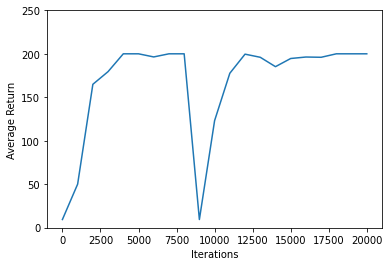

In [ ]:
#@test {"skip": true}

iterations = range(0, num_iterations + 1, eval_interval)
plt.plot(iterations, returns)
plt.ylabel('Average Return')
plt.xlabel('Iterations')
plt.ylim(top=250)

##### Videos

Charts are nice. But more exciting is seeing an agent actually performing a task in an environment. 

First, create a function to embed videos in the notebook.

In [ ]:
def embed_mp4(filename):
  """Embeds an mp4 file in the notebook."""
  video = open(filename,'rb').read()
  b64 = base64.b64encode(video)
  tag = '''
  <video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{0}" type="video/mp4">
  Your browser does not support the video tag.
  </video>'''.format(b64.decode())

  return IPython.display.HTML(tag)

Now iterate through a few episodes of the Cartpole game with the agent. The underlying Python environment (the one "inside" the TensorFlow environment wrapper) provides a `render()` method, which outputs an image of the environment state. These can be collected into a video.

In [ ]:
def create_policy_eval_video(policy, filename, num_episodes=5, fps=30):
  filename = filename + ".mp4"
  with imageio.get_writer(filename, fps=fps) as video:
    for _ in range(num_episodes):
      time_step = eval_env.reset()
      video.append_data(eval_py_env.render())
      while not time_step.is_last():
        action_step = policy.action(time_step)
        time_step = eval_env.step(action_step.action)
        video.append_data(eval_py_env.render())
  return embed_mp4(filename)

create_policy_eval_video(agent.policy, "trained-agent")

For fun, compare the trained agent (above) to an agent moving randomly. (It does not do as well.)

In [ ]:
create_policy_eval_video(random_policy, "random-agent")

## DRL: Policy Gradient


The following code example is adapted from [James Allingham's colab](https://colab.research.google.com/github/deep-learning-indaba/indaba-pracs-2019/blob/master/4b_reinforcement_learning.ipynb#scrollTo=y__eyOeyzbp1).

Original author: James Allingham

### The Reinforcement Learning Problem

So far we have encountered **supervised learning**, where we have an input and a target value or class that we want to predict. We have also encountered **unsupervised learning** where we are only given an input and look for patterns in that input. In this practical, we look into **reinforcement learning**, which can loosely be defined as training an **agent** to maximise the total **reward** it obtains through many interactions with an **environment**.

The agent can make an **observation** of the environment $o_t$. For example, if the environment is a computer game, the observation could be the the pixel values of the current screen.

The environment defines a set of **actions** that an agent can take.  The agent performs an action $a_t$ informed by the observations it has made, and will receive a **reward** $r_t$ from the environment after every action. The *reinforcement learning problem* is to find an agent whose actions maximize the total rewards obtained from the environment over many actions.

The following diagram illustrates the interaction between the agent and environment. We will explore each of the terms in more detail throughout this practical.

<!-- ![Interaction of Agent and Environment](https://github.com/sbodenstein/Tutorials/blob/master/indaba_2019/Images/RL_Environment.png?raw=true) -->

<img src="https://raw.githubusercontent.com/sbodenstein/Tutorials/master/indaba_2019/Images/RL_Environment.png" alt="drawing" width=600/>



**Optional Recommended Reading**: 
- [*OpenAI Spinning Up: Key Concepts in RL*](https://spinningup.openai.com/en/latest/spinningup/rl_intro.html) is a great summary of the terminology used in reinforcement learning. We will follow the notation used by OpenAI Spinning Up.

#### The Environment

In [ ]:
!pip install pyglet~=1.3.2 > /dev/null 2>&1
!pip install 'gym[atari]' > /dev/null 2>&1
!apt-get install python-opengl -y > /dev/null 2>&1
!apt install xvfb -y > /dev/null 2>&1
!pip install pyvirtualdisplay > /dev/null 2>&1
!pip install tensorflow==2.0.0-beta0 > /dev/null 2>&1

from IPython.display import HTML

# Start virtual display
from pprint import pprint
import logging
from pyvirtualdisplay import Display
logging.getLogger("pyvirtualdisplay").setLevel(logging.ERROR)

display = Display(visible=0, size=(1024, 768))
display.start()
import os

We will focus on the cartpole environment for this practical. This environment consists of a pole attached to a cart via a hinge, with the pole initially balanced close to upright. The agent can move the cart to the left or to the right in order to prevent the pole from falling down.

![CartPole Illustration](https://user-images.githubusercontent.com/10624937/42135683-dde5c6f0-7d13-11e8-90b1-8770df3e40cf.gif)


We will use the OpenAI Gym implementation of the cartpole environment. [OpenAI Gym](https://gym.openai.com/) is probably the most popular set of Reinforcement Learning environments (the available environments in Gym can be seen [here](https://gym.openai.com/envs)). Every Gym environment has the same interface, allowing code written for one environment to work for all of them. Popular reinforcement learning frameworks, such as [Ray](https://ray.readthedocs.io/en/latest/index.html), often use the Gym interface as [their default interface](https://ray.readthedocs.io/en/latest/rllib-env.html#openai-gym) for reinforcement learning environments.

Let us import Gym and open a cartpole environment:

In [ ]:
import numpy as np
import gym
env_cartpole = gym.make('CartPole-v1')

The first step to using a Gym environment is to initialize the environment to some initial state using the `reset` method. The `reset` method also returns the first observation of the environment:

In [ ]:
env_cartpole.reset()

array([ 0.02114871, -0.04747352,  0.00585786, -0.0243832 ])

These four numbers represent the position and velocity of the cart and pole. We will want our agent to use this observation to inform its actions.

**Question**: is there any difference between the observation and state of the cartpole environment? (**Hint**: is any more information required to describe the system?)

 But we also want to see an image of the system that we can interpret. Gym provides the `render` method to do this:

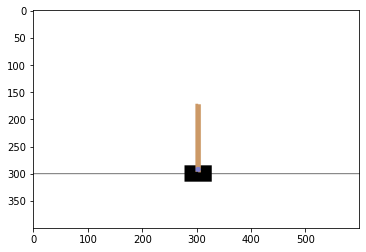

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(env_cartpole.render(mode='rgb_array'));

Note that re-initializing this environment with `reset` will change its initial state. Cartpole starts with slighty different angles when we reset. By running this multiple times, see if you can notice:

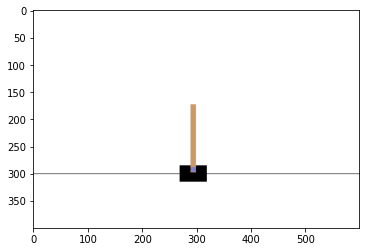

In [ ]:
env_cartpole.reset()
plt.imshow(env_cartpole.render(mode='rgb_array'));

Now we want to take an action using the `step` method. But which actions are allowed, and how are they represented? We can find this out using the `action_space` property of Gym environments:

In [ ]:
env_cartpole.action_space

Discrete(2)

In Gym, `Discrete(n)` means actions are represented by the integers `0,1,...,n-1`. Action spaces always provide a way to take a random action sampled from the space:

In [ ]:
[env_cartpole.action_space.sample() for _ in range(10)]

[1, 1, 1, 1, 0, 1, 1, 1, 0, 1]

Now let us take an action using the `step` method, which takes an action and returns a tuple `(observation, reward, done, info)`:

In [ ]:
action = 1
env_cartpole.step(action)

(array([-0.0462187 ,  0.18142156,  0.00051723, -0.266329  ]), 1.0, False, {})

### Agents and Policies

A **policy** is a function used by an agent to decide what actions to take. This function takes as input an observation and returns either an action (a **deterministic policy**) or a probability distribution over possible actions (a **stochastic policy**).

**Note**: the terms **policy** and **agent** are often used interchangeably:
> Because the policy is essentially the agent’s brain, it’s not uncommon to substitute the word “policy” for “agent”, eg saying “The policy is trying to maximize reward.” ~ [OpenAI Spinning Up](https://spinningup.openai.com/en/latest/spinningup/rl_intro.html#policies)

We will consider an **agent** to be a function whose input is the observation, and it returns a dictionary which always contains the `"Action"` key. It might also contain other keys, such as the action probabilities, the value function, etc. 

The simplest possible policy for a cartpole agent is one that always takes the `0` action, no matter what the observation is:

In [ ]:
def agent_left(observation):
    return {"Action":0}

In [ ]:
agent_left(None)

{'Action': 0}

#### Rewards and Returns

Is our agent `agent_left` any good? To answer that, we need some measure of 'goodness', which is usually related to the total obtained during an episode. This is called the **return**, $R$, and there are different ways of defining it. The most obvious definition for return is to simply add up all the rewards the agent received during an episode. If the episode took $T$ steps, and got a reward $r_t$ at each step, then this return is $R = \sum_{t=1}^{T} r_{t}$, where $r_t$ is the reward received at timestep $t$.

One issue is that some environments will have different initial states, and some agents take actions stochastically. The solution is to average the returns over multiple starting points. Here is a function that does this:

In [ ]:
def average_episodic_return(env, agent, episodes=10, max_steps_per_episode=1000):
    epoch_rewards = []
    for episode in range(episodes):
        total_rewards = 0
        obs = env.reset()
        for t in range(max_steps_per_episode):
            out = agent(obs) # we don't care about the probabilities here
            assert ("Action" in out), "The key 'Action' was missing from the agents output."
            obs, rew, done, _ = env.step(out["Action"])
            total_rewards += rew
            # check if we are done, if so, exit loop
            if done:
                break
                
        epoch_rewards.append(total_rewards)
        
    return {
        "AverageEpisodicReturn": np.mean(epoch_rewards), 
        "StandardDeviation":np.sqrt(np.var(epoch_rewards))
    }

Now we can see how good our agent `agent_left` is:

In [ ]:
average_episodic_return(env_cartpole, agent_left)

{'AverageEpisodicReturn': 9.4, 'StandardDeviation': 0.66332495807108}

**Question**: the implementation of `average_episodic_return` has the optional parameter `max_steps_per_episode`. What does it do, and why is it there? (**Hint**: think of agents that are **too good** at controlling cartpole)

#### Animating Agents

**We suggest cell without understanding the implementation.** This code cell defines a function `animate_agent(environment, agent)` that produces a human understandable animation of the `agent` controlling the `environment`:

In [ ]:
from collections import deque
import matplotlib.animation
import matplotlib.pyplot as plt
%matplotlib inline

def animate_agent(env, agent, max_steps = 400):
    obs = env.reset()
    frames = deque()
    frames.append(env.render(mode='rgb_array'))
    for _ in range(max_steps):
        out = agent(obs)
        assert ("Action" in out), "The key 'Action' was missing from the agents output."
        action = out["Action"]
        obs, _ , done, _ = env.step(action)
        frames.append(env.render(mode='rgb_array'))
        if done:
            break
            
    return animate_frames(frames)

def animate_frames(frames):
    new_height = 2.2
    original_height = frames[0].shape[0]
    original_width = frames[0].shape[1]
    new_width = (new_height / original_height) * original_width
    fig = plt.figure(figsize=(new_width, new_height), dpi = 120)
    
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    patch = ax.imshow(frames[0], aspect='auto', animated=True, interpolation='bilinear')
    animate = lambda i: patch.set_data(frames[i])
    
    ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(frames), interval = 50)
    
    plt.close()
    return HTML(ani.to_jshtml())

Now we can easily get an animation of the cartpole environment controlled by `policy_left`:

In [ ]:
def agent_left(observation):
    return {"Action":0}
  
animate_agent(env_cartpole, agent_left, max_steps = 400)

### Policy Gradient Theory

We will now use a neural net to represent a stochastic policy  $\pi_\mathbf{\theta}(a_t|s_t)$, where $\mathbf{\theta}$ is the set of learnable parameters in the neural net, and $\pi_\mathbf{\theta}(a_t|s_t)$ is a probability distribution over the possible actions conditioned on the state/observation.

A **trajectory**  $\tau$ is a sequence of states/observations of the environment and the corresponding actions an agent takes. For an episodic task that ends after $T$ steps:
$$\tau = (s_0, a_0, s_1, a_1, \ldots , s_T, a_T)$$
The return (or total rewards) is a function of the trajectory, $R(\tau)$.

We want to find the values of $\theta$ that maximize the **expected return** over trajectories:
$$J(\pi_\theta)= \mathop{\mathbb{E}} _{\tau \sim \pi_{\theta}}[R(\tau)]$$

The usual way of efficiently finding good values of $\theta$ is to differentiate the objective with respect to $\theta$ and then use gradient descent. Luckily, we can obtain an *estimate* of this gradient. The key result is the *Policy Gradient Theorem*:
$$\nabla_\theta J(\pi_\theta) = 
\mathop{\mathbb{E}} _{\tau \sim \pi_{\theta}}\left[ \sum_{t=0}^{T}\Phi_t\nabla_\theta\log \pi_\theta(a_t|s_t) \right] 
$$
There are many possibilities for $\Phi_t$ (see page 2 [here](https://arxiv.org/pdf/1506.02438.pdf) for a list of these possibilities). We  will use $\Phi_t = \hat{R}_t \equiv \sum_{t'=t}^{T} r_{t'}$, sometimes known as the [reward-to-go](https://spinningup.openai.com/en/latest/spinningup/rl_intro3.html#don-t-let-the-past-distract-you). Note that $\mathop{\mathbb{E}} _{\tau \sim \pi_{\theta}}$ is an expectation over trajectories $\tau$ which can be estimated by using a sample mean. Let us call this estimate of the gradient $\hat{g}$:

$$\hat{g} = \frac{1}{|D|}\sum_{\tau \in \mathcal{D}}
\sum_{t=0}^{T}\hat{R}_t\nabla_\theta\log \pi_\theta(a_t|s_t) 
$$
where $\mathcal{D}$ is a set of trajectories of size $|\mathcal{D}|$. The more trajectories we sample from, the lower the variance of the estimator $\hat{g}$. But to simplify things for this practical, we will only be sampling from only one trajectory at a time to get our gradient estimate. Then:
$$\hat{g} =
\sum_{t=0}^{T}\hat{R}_t\nabla_\theta\log \pi_\theta(a_t|s_t) 
$$
Translating this into a loss to be *maximized*:
$$\mathcal{L}=\sum_{t=0}^{T}\hat{R}_t\log \pi_\theta(a_t|s_t) $$

This looks very similar to the usual supervised learning cross-entropy loss, $\sum_{i}\log p(y_i|x_i) $, where $y_i$ is the label and $x_i$ is the feature. Indeed, learning with policy gradients is almost the same doing supervised learning with the following small changes:

- we use the action $a_t$ taken when we saw $s_t$ as the label ($y_i$)
- the loss of each example gets multiplied (or *weighted*) by $\hat{R}_t$. This increases the log probability for good actions and decrease it by bad actions.
- we are doing gradient *ascent* rather than the usual gradient *descent*

In summary:

| Reinforcement Learning         	|  Supervised Learning 	|
|-------------------------------------	|-----------------------------------------------------		|
|  $\sum_{t}\log \pi_\theta(a_t|s_t) \hat{R}_t$     	| $\sum_{i}\log p(y_i|x_i) $    |
|  action $a_t$    | label $y_i$    |
|  state $s_t$    | feature $x_i$    |
| $\pi_\theta(a_t|s_t)$   |   $p(y_i|x_i)$  |
|  gradient ascent     	|  gradient descent    |

For those interested in the derivation, there are two excellent resources:
- [Part 3: Intro to Policy Optimization](https://spinningup.openai.com/en/latest/spinningup/rl_intro3.html) of OpenAI Spinning Up.
- Chapter 13 of Sutton and Barto, *Reinforcement Learning: and Introduction*, 2nd Edition. A free copy can be found [here](http://incompleteideas.net/book/RLbook2018.pdf).

The name "policy gradient" comes from the fact that we're directly taking the gradient of the policy, rather than the alternative, value-based RL, which uses iterative update rules to calculate the expected return assocated with a state. The particular flavour of policy gradient which uses the loss function above, along with the Monte-carlo approximation of the objective is known as the **REINFORCE** algorithm ([Williams 1992](https://link.springer.com/article/10.1007/BF00992696)).


**Note**:

> Reinforcement learning notation sometimes puts the symbol for state, $s$, in places where it would be technically more appropriate to write the symbol for observation, $o$. Specifically, this happens when talking about how the agent decides an action: we often signal in notation that the action is conditioned on the state, when in practice, the action is conditioned on the observation because the agent does not have access to the state. In our guide, we’ll follow standard conventions for notation ~ [OpenAI Spinning Up](https://spinningup.openai.com/en/latest/spinningup/rl_intro.html#states-and-observations)

For this tutorial, we do the same, so that the derivations presented in other resources, such as OpenAI Spinning Up, use this notation.

#### Optional: A Mathematical Digression on Policy Gradients

This section is for the mathematically inclined, and gives more insight into the Policy Gradient Theorem.

Outside of the reinforcement learning setting, the Policy Gradient Theorem is known as a [score function estimator](http://blog.shakirm.com/2015/11/machine-learning-trick-of-the-day-5-log-derivative-trick/):
$$\frac{\partial }{\partial \theta}\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)]=\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)\frac{\partial }{\partial \theta}\log p(x,\theta)]$$

The power of this theorem comes from the ability to evaluate the RHS, even if $f(x)$ is a black-box function, if we replace the mean with the sample mean. In the reinforcement learning setting, $x$ is the action sampled from the parameterized policy $p(x,\theta)$, and $f(x)$ is the reward function.

The derivation:
$$
\begin{align}
\frac{\partial }{\partial \theta}\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)] 
&= \frac{\partial }{\partial \theta} \int p(x, \theta)f(x) \, dx \\ 
&= \int  \frac{\partial }{\partial \theta} p(x, \theta)f(x) \, dx \\ 
&= \int  p(x, \theta) \frac{\partial }{\partial \theta} \log p(x, \theta)f(x) \, dx \\ 
&= \mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)\frac{\partial }{\partial \theta}\log p(x,\theta)]
\end{align}
$$

This equation is valid under **very** general conditions: $p(x,\theta)$ needs to be a continuous function of $\theta$, but does not need to be a continuous function of $x$. Furthermore, $f(x)$ can be discontinuous and $x$ can be either a discrete or continuous random variable (a reference for these conditions is [here](https://arxiv.org/abs/1506.05254)). This should reassure us when using this theorem for reinforcement learning, as it means we don't need to worry about showing that our environments produce a smooth or even continuous return function (which might not be true, or might be very hard to show for most environments)!




To get some intuition for how this works, lets consider a toy model: Let $f(x)=-(x-2)^2$ and $p(x,\theta)$ be normally distributed with variance of 1 and a mean $\theta$, $\mathcal{N}(\theta, 1)$. The PDF is $p(x,\theta) = \frac{e^{-\frac{1}{2} (x-\theta)^2}}{\sqrt{2 \pi }}$. Now $f(x)$ has an maximum at $x=2$, so the best value of $\theta$ will be $2$ as well, as we want to maximize the number of samples of $x$ close to maximum of $f(x)$.

Then $$\frac{\partial }{\partial \theta}\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)]= \frac{\partial }{\partial \theta}\int^{\infty}_{-\infty} f(x) p(x,\theta) dx=\frac{\partial }{\partial \theta}\left[\theta(4-\theta) -5\right]=4-2\theta$$
This is what we expect: when $\theta>2$, the gradient wants to move $\theta$ downwards, and if $\theta<2$ it wants to move it upwards towards 2.

The RHS of the Policy Gradient Theorem is:
$$\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)\frac{\partial }{\partial \theta}\log p(x,\theta)]=\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x) (x-\theta)]$$
We can evaluate the above analytically, but we are interested in the case where it can't be. In that case, we approximate the expectation with the sample mean. Consider the case where $\theta_0=0$. Then $\frac{\partial }{\partial \theta_0}\mathop{\mathbb{E}} _{x \sim p_{\theta_0}}[f(x)]=4$. Then performing the sample mean: 

In [ ]:
def f(x):
    return -(x - 2)**2

def sf_estimator(mean, sample_size, f):
    x = np.random.normal(mean, 1, sample_size)
    return np.mean(f(x) * (x - mean))

The expected result is $4$, with the sampled result:

In [ ]:
num_samples = 200
sf_estimator(0, num_samples, f)

4.935522831559431

We can also get an idea of the **variance** of gradients estimated this way:

In [ ]:
#@title
def sf_estimator_variance(mean, mean_sample_size, grad_f, variance_samples = 200):
    grads = [grad_f(mean, mean_sample_size, f) for _ in range(variance_samples)];
    return np.var(grads)

With a sample size of 50, the variance is:

In [ ]:
#@title
var1 = sf_estimator_variance(0, 50, sf_estimator)
var1

1.856881102265781

One way to reduce the variance is via a *baseline*. First, note that $$\frac{\partial }{\partial \theta}\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)] = \frac{\partial }{\partial \theta}\mathop{\mathbb{E}} _{x \sim p_{\theta}}[(f(x)-b)]$$ for any constant $b$. A popular choice is $b=\mathop{\mathbb{E}} _{x \sim p_{\theta}}[f(x)]$. Does this reduce the variance? Lets implement the gradient estimator with baseline:

In [ ]:
#@title
def sf_baseline_estimator(mean, sample_size, f):
    x = np.random.normal(mean, 1, sample_size)
    f_vals = f(x)
    baseline = np.mean(f_vals)
    f_vals = f(x) - baseline
    return np.mean(f_vals * (x - mean))

This still gives the same gradient (~4):

In [ ]:
#@title
sf_baseline_estimator(0, 2000, f)

4.170738126475893

But the variance is significantly reduced

In [ ]:
#@title
var2 = sf_estimator_variance(0, 50, sf_baseline_estimator)
var2

0.800297164264636

In [ ]:
#@title
var1/var2

2.320239512496588

**Extra Reading**
- A great review of score function estimators:
    * [Monte Carlo Gradient Estimation in Machine Learning](https://arxiv.org/abs/1906.10652), Mohamed *et al*, 2019

### Episode Trajectory Collector

Let us implement a function `get_episode_trajectory(env, agent)` that controls the environment `env` with `agent` and returns the reward, observation and action taken at each timestep:

In [ ]:
def get_episode_trajectory(env, agent, max_steps=1000):
    observation_list = []
    reward_list = []
    action_list = []
    value_list = []

    done = False
    obs = env.reset()
    for _ in range(max_steps):
        observation_list.append(obs)
        out = agent(obs)
        assert ("Action" in out), "The key 'Action' was missing from the agents output."
        action = out["Action"]        
        obs, rew, done, _, = env.step(action)
        reward_list.append(rew)
        action_list.append(action)
        if "Value" in out:
            value_list.append(out["Value"])
            
        if done:
            break
        
    ret = {
        "Observations": observation_list, 
        "Actions": action_list, 
        "Rewards": np.array(reward_list, dtype=np.float32)
    }
    if len(value_list) > 0:
        ret["Values"] = value_list
        
    return ret

### Reward-to-go $\hat{R}_t$

We need to compute the reward-to-go $\hat{R}_t= \sum_{t'=t}^{T} r_{t'}$. Here is a simple NumPy implementation:

In [ ]:
def reward_to_go(rewards):
    return np.flip(np.cumsum(np.flip(rewards)))

Checking that this works as expected:

In [ ]:
reward_to_go([1, 1.2, 1])

array([3.2, 2.2, 1. ])

A trick to reduce the variance of the gradient estimator and improve the stability of training is to normalize the future rewards over an episode by subtracting the mean and dividing by the standard deviation.

In [ ]:
def reward_to_go_normalized(rewards):
    raise NotImplementedError

#### Solution

In [ ]:
def reward_to_go_normalized(rewards):
    adv = reward_to_go(rewards)
    eps = 0.00001
    return (adv - adv.mean()) / (adv.std() + eps)

In [ ]:
reward_to_go_normalized([1, 1, 1])

array([ 1.22472987,  0.        , -1.22472987])

#### Optional Extra Reading

The estimator $\Phi_t \equiv \hat{R}_t= \sum_{t'=t}^{T} r_{t'}$ we used has a number of problems. For example, if we don't get to the end of an episode (as it takes too long and we stop sampling), or our task is not episodic, we will have incorrect estimates of the advantages of our states. In addition, we can reduce the variance of the gradient further if we have access to a **value function**. One popular expression is $\Phi_t$ that works around these difficulties is the GAE-Lamba estimator: 
 - [High-Dimensional Continuous Control Using Generalized Advantage Estimation](https://arxiv.org/abs/1506.02438), Schulman *et al*, 2015
 - A good blog post on this: https://danieltakeshi.github.io/2017/04/02/notes-on-the-generalized-advantage-estimation-paper/

### TensorFlow Policy Net

Let us use a neural net policy with parameters $\theta$, so we have $\pi_\theta(a|s) = NN(s; \theta)$, where $NN(s; \theta)$ is some potentially complex function represented by a neural network with parameters $\theta$:

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Conv2D
from tensorflow.keras import Model

In [ ]:
class AgentMLPTF(Model):
  def __init__(self):
    super(AgentMLPTF, self).__init__()
    self.d1 = Dense(15, activation='tanh')
    self.d2 = Dense(2)

  def call(self, x):
    # 1. Define Policy
    batch = True
    if x.ndim == 1:
        batch = False
        x = np.expand_dims(x, axis=0)
    x = self.d1(x)
    action_logits = self.d2(x)
    
    # 2. Sample policy to get action
    action = tf.random.categorical(action_logits, 1)
    action = action.numpy().flatten()
    if not batch:
        action = np.asscalar(action)
        
    return {"Action":action, "LogProbability":action_logits}

In [ ]:
agent_mlp_tf = AgentMLPTF()

In [ ]:
obs = np.array([0.1,0.2,0.3,0.4])
agent_mlp_tf(obs)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


{'Action': 0,
 'LogProbability': <tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[ 0.00859711, -0.34685013]], dtype=float32)>}

We can also verify that this works on a batch of observations:


In [ ]:
obs_batch = np.array([[0.1,0.2,0.3,0.4], [0.5,0.3,0.2,0.1]])
agent_mlp_tf(obs_batch)

{'Action': array([0, 0]),
 'LogProbability': <tf.Tensor: shape=(2, 2), dtype=float32, numpy=
 array([[ 0.00859711, -0.34685007],
        [-0.21448073, -0.0756692 ]], dtype=float32)>}

### Loss Function

Let us implement the loss function $\mathcal{L}=\sum_{t=0}^{T}\hat{R}_t\log \pi_\theta(a_t|s_t) $ using TensorFlow operations:

In [ ]:
def loss_pg(actions, logits, weights):
    action_masks = tf.one_hot(actions, 2, dtype=np.float64)
    log_probs = tf.reduce_sum(action_masks * tf.nn.log_softmax(logits), axis=1)
    return -tf.reduce_mean(weights * log_probs)

Verify that this works on some example data:

In [ ]:
actions = [1,0,0]
logits = np.array([[0.2,0.8],[0.2,0.8],[0.6,0.4]])
weights = [2.3, 4.3, 2.1]
loss_pg(actions, logits, weights)

<tf.Tensor: shape=(), dtype=float64, numpy=2.2411706996360627>

**Note**: this is equivalent to:

In [ ]:
def loss_pg2(actions, logits, weights):
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
    return tf.reduce_mean(weights * loss(actions, logits))

In [ ]:
loss_pg2(actions, logits, weights)

<tf.Tensor: shape=(), dtype=float64, numpy=2.241170754035314>

### Train the Policy Net

Now we can put all the pieces together in the training loop. It simply collects a single trajectory and uses it to do a single gradient update of the agent:

In [ ]:
def train_policy_grad(env, agent, num_epochs=250, max_episode_steps=1000):
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    log_reward = 0
    log_reward_list = []
    logging_period = 20
    
    for epoch in range(num_epochs):
        # get the training data
        traj = get_episode_trajectory(env, agent, max_steps=max_episode_steps)
        obs = np.stack(traj["Observations"])
        rew = traj["Rewards"]
        actions = traj["Actions"]
        
        # compute 'reward-to-go'
        rew_2_go = reward_to_go_normalized(rew)
        
        # compute gradients + update weights
        with tf.GradientTape() as tape:
            logits = agent(obs)["LogProbability"]
            loss = loss_pg(actions, tf.cast(logits, tf.double), rew_2_go)
            
        gradients = tape.gradient(loss, agent.trainable_variables)
        optimizer.apply_gradients(zip(gradients, agent.trainable_variables))
        
        # log the reward
        log_reward += np.sum(rew)
        if (epoch % logging_period) == 0:
            template = 'Training Epoch {}, Averaged Return: {}'
            print(template.format(epoch, log_reward / logging_period))
            log_reward_list.append(log_reward / logging_period)
            log_reward = 0
       
    return (range(0, num_epochs, logging_period), log_reward_list)

Note that `train_policy_grad(env, agent)` takes a TensorFlow agent as input and mutates it during training. Create and train a `AgentMLPTF` agent:

In [ ]:
agent_mlp_tf = AgentMLPTF()
(episodes, rewards) = train_policy_grad(env_cartpole, agent_mlp_tf)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


Training Epoch 0, Averaged Return: 1.1
Training Epoch 20, Averaged Return: 81.85
Training Epoch 40, Averaged Return: 129.2
Training Epoch 60, Averaged Return: 223.7
Training Epoch 80, Averaged Return: 403.55
Training Epoch 100, Averaged Return: 278.4
Training Epoch 120, Averaged Return: 215.5
Training Epoch 140, Averaged Return: 150.3
Training Epoch 160, Averaged Return: 121.6
Training Epoch 180, Averaged Return: 173.55
Training Epoch 200, Averaged Return: 177.85
Training Epoch 220, Averaged Return: 209.2
Training Epoch 240, Averaged Return: 260.15


We can plot the average rewards obtained versus the number of episodes trained for:

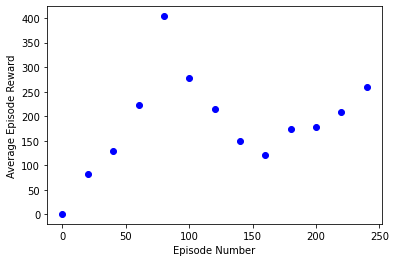

In [ ]:
plt.plot(episodes, rewards, 'bo')
plt.xlabel('Episode Number')
plt.ylabel('Average Episode Reward')
plt.show()

Let us animate this agent controlling the cartpole environment:

In [ ]:
animate_agent(env_cartpole, agent_mlp_tf)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


### Optional Extra Reading on Policy Gradients



- The simple REINFORCE algorithm shown here is very unstable. There are a number of improvements to this method, the most popular of which is probably PPO:
    * [Proximal Policy Optimization Algorithms](https://arxiv.org/abs/1707.06347), Schulman *et al*, 2017
    * OpenAI SpinningUp: https://spinningup.openai.com/en/latest/algorithms/ppo.html
    * OpenAI Blog: https://openai.com/blog/openai-baselines-ppo/
- PPO borrows many ideas from TRPO. [Depth First Learning](https://www.depthfirstlearning.com/2018/TRPO) has a course with a lot of good resources on TRPO.
- The idea of being able to differentiate through stochastic nodes in computation graphs is a very powerful idea, and it is used in a number of other areas in deep learning, such as *variational autoencoders*. 
    * For the general setting, see [Gradient Estimation Using Stochastic Computation Graphs](https://arxiv.org/abs/1506.05254), Schulman *et al*, 2015.
- For a skeptical take on policy gradients, see Ben Recht's post [The Policy of Truth](https://www.argmin.net/2018/02/20/reinforce/).
- Karpathy has [good post](http://karpathy.github.io/2016/05/31/rl/) on reinforcement learning using policy gradients, including an implementation of policy gradients that solves Pong using only NumPy in [131 lines of Python](https://gist.github.com/karpathy/a4166c7fe253700972fcbc77e4ea32c5)! 